## Predicción de lluvia en Australia


# Contexto

El proyecto se basa en el análisis de las condiciones meteorológicas en Australia. El objetivo de este trabajo es predecir a las 23.59hs de cada dia, si al dia siguiente va a llover o no.
Para la construcción de un modelo que nos permita predecir este fenómeno, contamos con los datos de las condiciones meteorológicas por día de los últimos 10 años en las distintas localidades del país.
Gestionar adecuadamente estos datos nos permitirá desarrollar estrategias específicas para cada zona de Australia, y
asi obtener los mejores resultados de predicción para las precipitaciones por región.


### Variables del conjunto de datos  
| **Variable**         | **Descripción**                                                                 |
|----------------------|----------------------------------------------------------------------------------|
| **Date**             | Fecha de la observación meteorológica.                                           |
| **Location**         | Ciudad o estación meteorológica donde se registraron los datos.                  |
| **MinTemp**          | Temperatura mínima del día (°C).                                                 |
| **MaxTemp**          | Temperatura máxima del día (°C).                                                 |
| **Rainfall**         | Cantidad de lluvia caída ese día (mm).                                           |
| **Evaporation**      | Evaporación del agua (mm) registrada ese día.                                    |
| **Sunshine**         | Horas de sol registradas durante el día.                                         |
| **WindGustDir**      | Dirección del viento más fuerte del día (puntos cardinales, ej. N, SW).          |
| **WindGustSpeed**    | Velocidad del viento más fuerte (km/h).                                          |
| **WindDir9am**       | Dirección del viento a las 9 a.m.                                                |
| **WindDir3pm**       | Dirección del viento a las 3 p.m.                                                |
| **WindSpeed9am**     | Velocidad del viento a las 9 a.m. (km/h).                                        |
| **WindSpeed3pm**     | Velocidad del viento a las 3 p.m. (km/h).                                        |
| **Humidity9am**      | Humedad relativa (%) a las 9 a.m.                                                |
| **Humidity3pm**      | Humedad relativa (%) a las 3 p.m.                                                |
| **Pressure9am**      | Presión atmosférica (hPa) a las 9 a.m.                                           |
| **Pressure3pm**      | Presión atmosférica (hPa) a las 3 p.m.                                           |
| **Cloud9am**         | Cobertura de nubes a las 9 a.m. (escala de 0 a 9 octas).                         |
| **Cloud3pm**         | Cobertura de nubes a las 3 p.m. (escala de 0 a 9 octas).                         |
| **Temp9am**          | Temperatura a las 9 a.m. (°C).                                                   |
| **Temp3pm**          | Temperatura a las 3 p.m. (°C).                                                   |
| **RainToday**        | Indicador (Si/No) de si llovió ese día.                                 |
| **RainTomorrow**     | Indicador (Si/No) de si se espera lluvia al día siguiente (target de predicción).|


# Librerias

In [ ]:
!pip install category_encoders
!pip install optuna
!pip install shap
!pip install pycaret

import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import math
import category_encoders as ce
import optuna
import copy
import pycaret
import tensorflow as tf
import joblib

from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import ( confusion_matrix,classification_report, ConfusionMatrixDisplay, accuracy_score, precision_score,
                             recall_score, f1_score, roc_curve, roc_auc_score
)
from sklearn.ensemble import RandomForestClassifier

from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

import warnings
warnings.filterwarnings("ignore")

from pycaret.classification import setup, compare_models, predict_model, save_model, load_model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

from sklearn.utils.class_weight import compute_class_weight

#Para producción
import os, sys
sys.path.insert(0, os.path.abspath("docker"))  # para cargar módulos personalizados

from transformadores.Temporal_GeoTransformer import TemporalGeoTransformer
from transformadores.Hierarchical_Imputer import HierarchicalImputer
from transformadores.Outlier_Capper import OutlierCapper
from transformadores.Cyclic_Encoder_Cleaner import CyclicEncoderCleaner



[notice] A new release of pip available: 22.3 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# Carga del Dataset

Comenzamos con la carga del dataset **weatherAUS.csv** que contiene información climática de Australia de los últimos diez años, incluyendo si para el día siguiente llovió o no en la columna *‘RainTomorrow’*.

In [ ]:
# Carga datos de dataset en dataframe
file_path= 'https://raw.githubusercontent.com/guillericci/AA1-TUIA-Aranda-Cicoria-Ricci/refs/heads/main/weatherAUS.csv'
df = pd.read_csv(file_path)

In [ ]:
# Cargamos además las coordenadas de Australia
coord_aus = pd.read_csv('https://raw.githubusercontent.com/guillericci/AA1-TUIA-Aranda-Cicoria-Ricci/refs/heads/main/coordenadas_aus.csv')

# Analisis Exploratorio

Procedemos a obtener información general del dataset. Variables involucradas, cantidad de registros no nulos y tipos de datos de las mismas.

In [ ]:
df.info()
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

(145460, 23)

In [ ]:
# Recuento de valores nulos por columna
nulos = df.isnull().sum().sort_values(ascending=False)
nulos_percent = (nulos / len(df)) * 100
nulos_df = pd.DataFrame({'Nulos': nulos, 'Porcentaje': nulos_percent})
print("\n Valores nulos por columna:")
print(nulos_df)


 Valores nulos por columna:
               Nulos  Porcentaje
Sunshine       69835   48.009762
Evaporation    62790   43.166506
Cloud3pm       59358   40.807095
Cloud9am       55888   38.421559
Pressure9am    15065   10.356799
Pressure3pm    15028   10.331363
WindDir9am     10566    7.263853
WindGustDir    10326    7.098859
WindGustSpeed  10263    7.055548
Humidity3pm     4507    3.098446
WindDir3pm      4228    2.906641
Temp3pm         3609    2.481094
RainTomorrow    3267    2.245978
Rainfall        3261    2.241853
RainToday       3261    2.241853
WindSpeed3pm    3062    2.105046
Humidity9am     2654    1.824557
Temp9am         1767    1.214767
WindSpeed9am    1767    1.214767
MinTemp         1485    1.020899
MaxTemp         1261    0.866905
Location           0    0.000000
Date               0    0.000000


Observamos que hay valores faltantes en las variables de nuestro dataset, por lo tanto deberemos tomar una decision de imputacion sobre los mismos. Lo analizaremos mas adelante.

In [ ]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


Procedemos a visualizar las medidas descriptivas asociadas a las variables
cuantitativas.

In [ ]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


##Correlograma


Visualizamos la matriz de correlación para observar la relación lineal entre las variables explicativas.

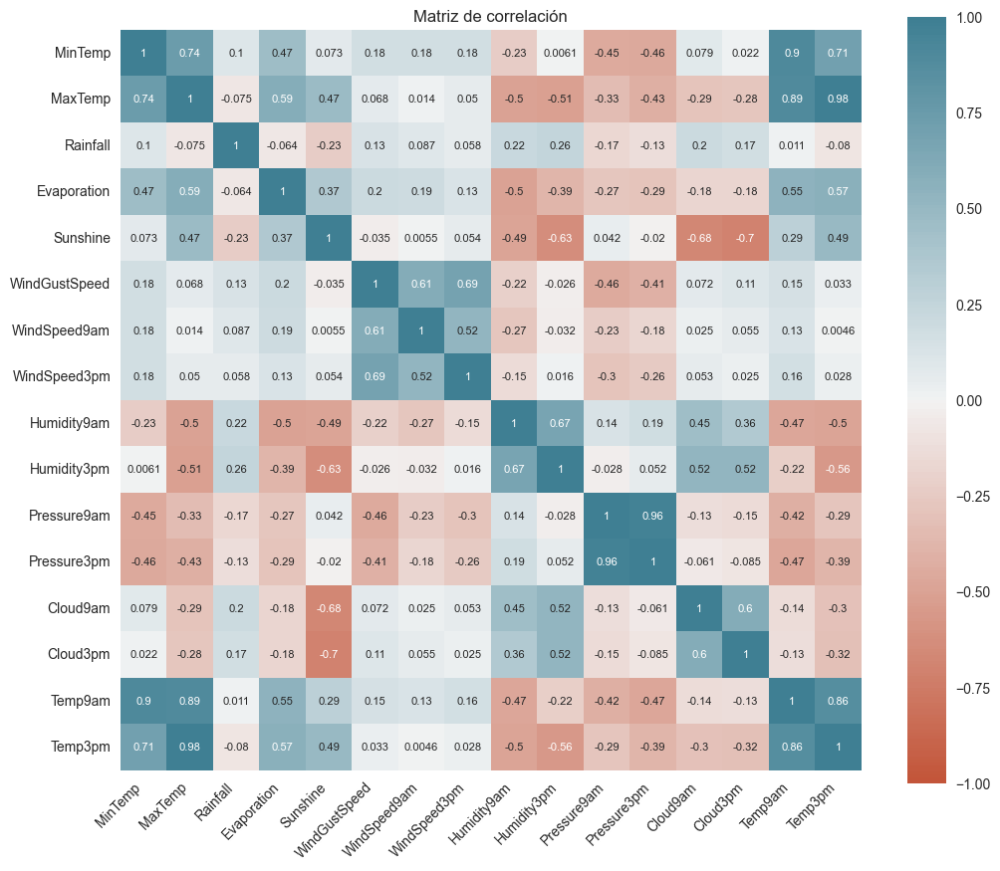

In [ ]:
df_num = df.select_dtypes(include=['float64', 'int64'])
# Calcular la matriz de correlación
corr = df_num.corr()
# Crear una figura más grande
plt.figure(figsize=(12, 10))
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot = True,
    annot_kws = {'size': 8}
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.title('Matriz de correlación')
plt.show()

Realizamos gráficos de dispersión sobre las variables numéricas.

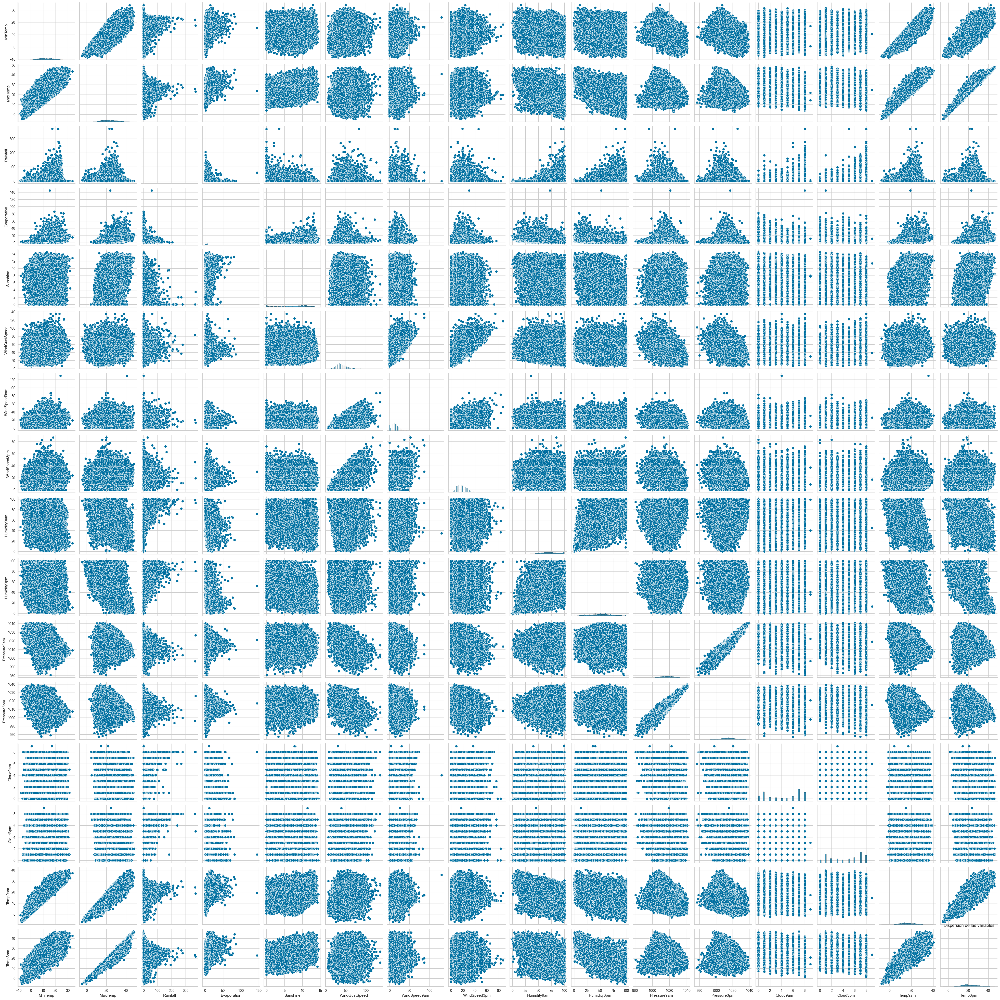

In [ ]:
sns.pairplot(df)
plt.title('Dispersión de las variables')
plt.show()

Procedemos a graficar la distribución de las variables categóricas.

In [ ]:
# Columnas categóricas
cat_cols = df.select_dtypes(include=['object']).columns
# Excluimos columnas con muchos valores únicos o irrelevantes para visualización categórica
cat_cols_plot = [col for col in cat_cols if col not in ['Date', 'Location', 'RainTomorrow']]

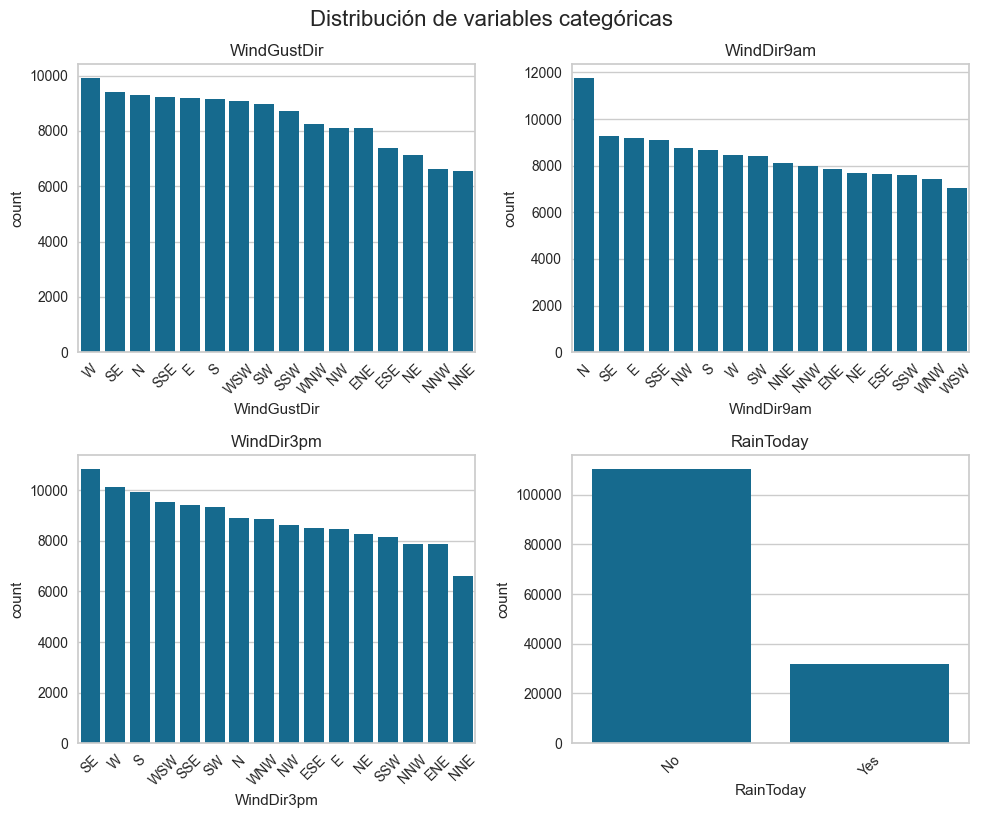

In [ ]:
def plot_categorical_distributions(df, cols, cols_per_row=2):
    cat_vars = len(cols)
    rows = math.ceil(cat_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.countplot(x=col, data=df, order=df[col].value_counts().index)
        plt.title(col)
        plt.xticks(rotation=45)
        plt.tight_layout()

    plt.suptitle('Distribución de variables categóricas', fontsize=16, y=1.02)
    plt.show()

plot_categorical_distributions(df, cat_cols_plot)

Procedemos a graficar las variables cuantitativas con relación a la variable target, para ver cómo varía su comportamiento respecto a ella.

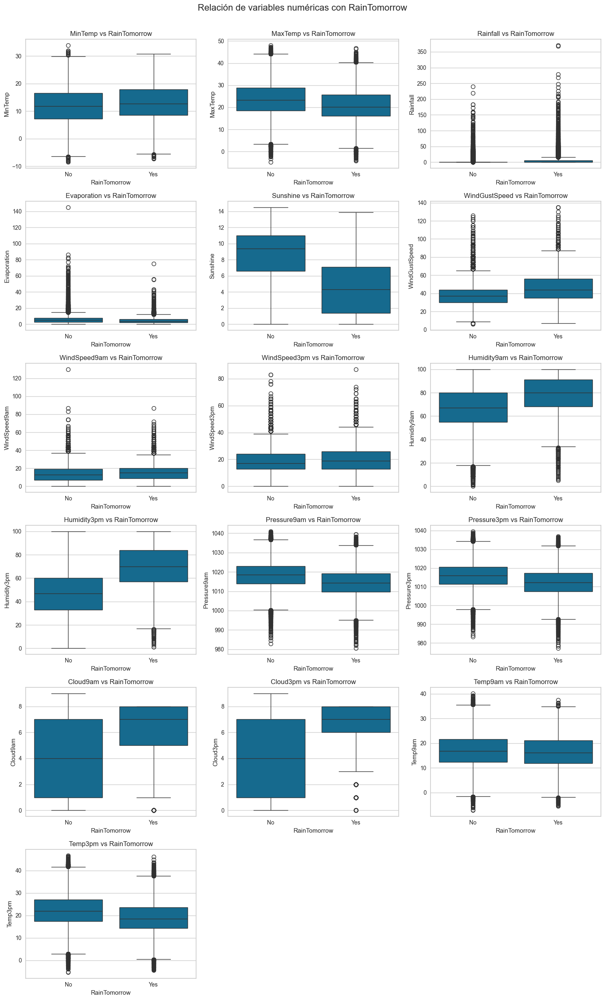

In [ ]:
def plot_numeric_vs_target(df, num_cols, target, cols_per_row=3):
    import math
    num_vars = len(num_cols)
    rows = math.ceil(num_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(num_cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.boxplot(x=target, y=col, data=df)
        plt.title(f'{col} vs {target}')
        plt.tight_layout()

    plt.suptitle(f'Relación de variables numéricas con {target}', fontsize=16, y=1.02)
    plt.show()

num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
plot_numeric_vs_target(df, num_cols, 'RainTomorrow')

De estas visualizaciones podemos deducir que las variable relativas a la *humedad*, la *presión* y las *horas de sol* parecen significativas a la hora de determinar si llueve o no al día siguiente.


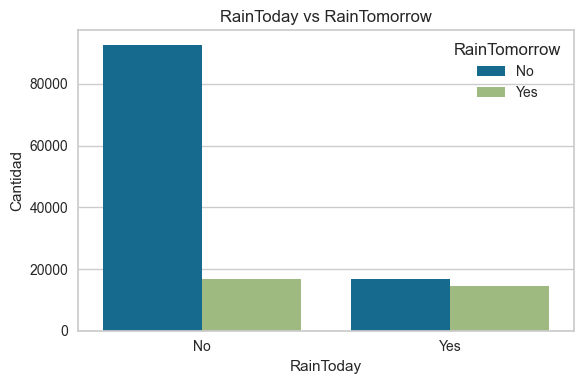

In [ ]:
def plot_rain_today_vs_rain_tomorrow(df):
    plt.figure(figsize=(6, 4))
    sns.countplot(x='RainToday', hue='RainTomorrow', data=df, order=df['RainToday'].value_counts().index)
    plt.title('RainToday vs RainTomorrow')
    plt.xlabel('RainToday')
    plt.ylabel('Cantidad')
    plt.legend(title='RainTomorrow')
    plt.tight_layout()
    plt.show()

plot_rain_today_vs_rain_tomorrow(df)

# Preprocesamiento de datos

## Segmentación de datos temporales

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], utc=True)

#Extraemos de 'Date' la fecha, el mes y el año.
df['mes'] = df['Date'].dt.month
df['anio'] = df['Date'].dt.year
df['fecha'] = df['Date'].dt.date

df.drop('Date', axis=1, inplace = True)

##Agrupamiento de ciudades por regiones con Clustering espacial - KMeans

Comenzando identificacndo los diferentes valores de la variables *Location*


In [ ]:
# Visualizamos los diferentes valores en Location
print(df['Location'].unique())
print(f"Cantidad de ciudades en Australia:", len(df['Location'].unique()))

['Albury' 'BadgerysCreek' 'Cobar' 'CoffsHarbour' 'Moree' 'Newcastle'
 'NorahHead' 'NorfolkIsland' 'Penrith' 'Richmond' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Wollongong' 'Canberra' 'Tuggeranong'
 'MountGinini' 'Ballarat' 'Bendigo' 'Sale' 'MelbourneAirport' 'Melbourne'
 'Mildura' 'Nhil' 'Portland' 'Watsonia' 'Dartmoor' 'Brisbane' 'Cairns'
 'GoldCoast' 'Townsville' 'Adelaide' 'MountGambier' 'Nuriootpa' 'Woomera'
 'Albany' 'Witchcliffe' 'PearceRAAF' 'PerthAirport' 'Perth' 'SalmonGums'
 'Walpole' 'Hobart' 'Launceston' 'AliceSprings' 'Darwin' 'Katherine'
 'Uluru']
Cantidad de ciudades en Australia: 49


Añadimos la información de las coordenadas por ciudad a nuestro dataset.

In [ ]:
# Merge de ciudades y coordenadas
df = df.merge(coord_aus, on='Location', how='left')

In [ ]:
# Verificamos si hay ciudades sin coordenadas
faltantes = df[df['Latitude'].isna() | df['Longitude'].isna()]['Location'].unique()
print("Ciudades sin coordenadas después del merge:", faltantes)

Ciudades sin coordenadas después del merge: []


In [ ]:
df.sample(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,mes,anio,fecha,Latitude,Longitude
110667,Albany,12.7,21.2,0.0,4.4,12.2,NaN,NaN,ESE,SE,...,1.0,18.6,18.5,No,No,11,2014,2014-11-25,-35.026944,117.883889
70446,Mildura,14.2,36.4,0.0,8.0,10.8,W,57.0,N,WNW,...,7.0,22.4,35.3,No,No,2,2009,2009-02-23,-34.206600,142.135300
41579,Williamtown,19.1,37.7,NaN,NaN,NaN,NW,93.0,NW,NW,...,NaN,26.9,37.2,NaN,NaN,11,2014,2014-11-01,-32.806300,151.843600
139436,Darwin,19.9,32.2,0.0,5.8,10.9,S,31.0,SSE,S,...,1.0,24.8,31.8,No,No,5,2009,2009-05-22,-12.463440,130.845642
50507,Tuggeranong,5.4,25.7,0.0,NaN,NaN,WNW,39.0,W,NW,...,NaN,11.0,24.4,No,No,3,2013,2013-03-24,-35.424400,149.088800


Nos disponemos a ubicar cada una de las localidades en el mapa para su mejor
visualización y comprensión.

In [ ]:
# Eliminar duplicados para que no repita ciudades
ciudades_unicas = df[['Location', 'Latitude', 'Longitude']].drop_duplicates()

# Crear el scatter plot con Plotly
fig = px.scatter_geo(
    ciudades_unicas,
    lat='Latitude',
    lon='Longitude',
    text='Location',
    title='Distribución geográfica de ciudades en Australia',
    scope='world',
    projection='natural earth'
)
# Centrar y enfocar en Australia
fig.update_geos(
    center=dict(lat=-25, lon=135),
    lataxis_range=[-50, -10],  # Rango de latitudes para enfocarse
    lonaxis_range=[120, 185],  # Rango de longitudes
    showland=True, landcolor="LightGreen"
)

fig.update_traces(marker=dict(size=8, color='blue'))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})

fig.show()


In [ ]:
X = ciudades_unicas[['Latitude', 'Longitude']].values

Luego de probar con distintos numeros de clusters, concluímos en que 9 es un número con resultados de agrupamientos óptimo según lo que podemos visualizar en el mapa.

In [ ]:
# Aplicamos KMeans para 9 clusters
k = 9
modelo_kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
ciudades_unicas['RegionCluster'] = modelo_kmeans.fit_predict(X)

In [ ]:
#Graficamos la clusterización elegida
fig = px.scatter_geo(
    ciudades_unicas,
    lat='Latitude',
    lon='Longitude',
    color='RegionCluster',
    text='Location',
    title='Clusters de ciudades australianas por región geográfica',
    projection='natural earth',
    color_discrete_sequence=px.colors.qualitative.Set2  # o Set3, Pastel1, etc.

)

fig.update_traces(marker=dict(size=8),textposition='top center')

# Centrar y enfocar en Australia
fig.update_geos(
    center=dict(lat=-25, lon=135),
    lataxis_range=[-50, -10],  # Rango de latitudes para enfocarse
    lonaxis_range=[120, 185],  # Rango de longitudes
    showland=True, landcolor="LightGreen"
)

fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()

Agregamos a nuestro dataset la columna RegionCluster y eliminamos Location, Latitud y Longitud.

In [ ]:
df = df.merge(ciudades_unicas[['Location', 'RegionCluster']], on='Location', how='left')

In [ ]:
df.drop(columns=['Latitude', 'Longitude', 'Location'], inplace=True)

## Division Train-Test

Antes de realizar la división procedemos a eliminar los registros inconsistentes de la variable target.

In [ ]:
#Eliminamos nulos de la variable target
df = df.dropna(subset=['RainTomorrow'])

In [ ]:
y = df['RainTomorrow'].map({'No': 0, 'Yes': 1})
X = df.drop(columns=['RainTomorrow'], axis=1)
# División estratificada (porque la clase puede estar desbalanceada)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

## Imputacion de valores faltantes

Dividimos las variables en númericas y categóricas.

In [ ]:
# Columnas numéricas
num_cols = X.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Columnas categóricas
cat_cols = X.select_dtypes(include=['object']).columns.tolist()

Visualizamos los valores faltantes de cada variable numerica.

In [ ]:
X_train[num_cols].isnull().sum()

MinTemp            513
MaxTemp            258
Rainfall          1131
Evaporation      48695
Sunshine         54344
WindGustSpeed     7440
WindSpeed9am      1082
WindSpeed3pm      2130
Humidity9am       1418
Humidity3pm       2897
Pressure9am      11287
Pressure3pm      11262
Cloud9am         42877
Cloud3pm         45669
Temp9am            735
Temp3pm           2203
dtype: int64

Procedemos a visualizar la distribución de las variables numéricas mediante histogramas.

In [ ]:
def plot_numeric_distributions(df, cols, cols_per_row=3):
    num_vars = len(cols)
    rows = math.ceil(num_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.histplot(df[col], kde=True, bins=30)
        plt.title(col)
        plt.tight_layout()

    plt.suptitle('Distribución de variables numéricas', fontsize=16, y=1.02)
    plt.show()

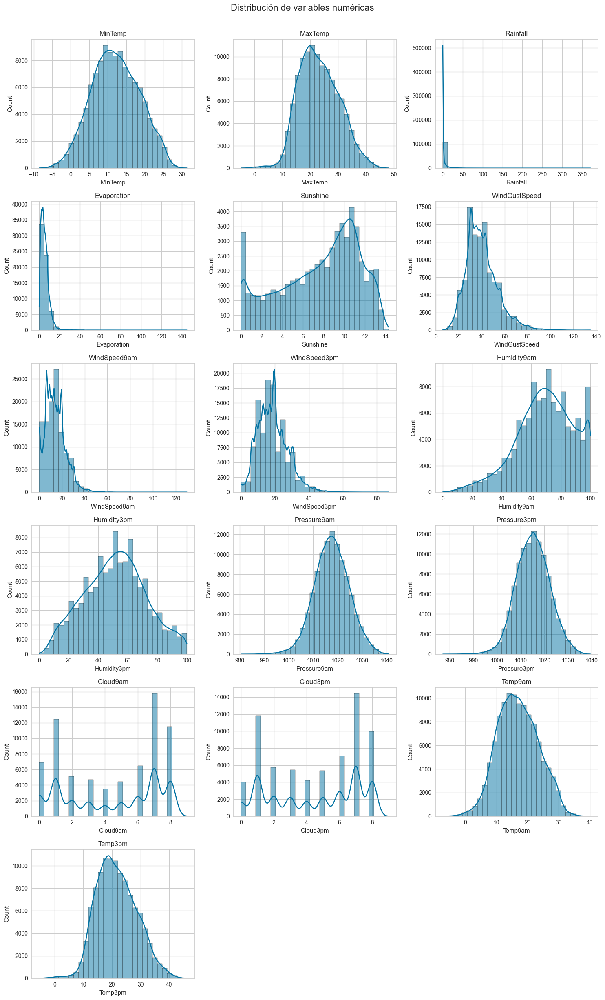

In [ ]:
plot_numeric_distributions(X_train, num_cols)

Podemos visualizar que:


*   Las variables Rainfall y Evaporation presentan distribuciones altamente asimétricas, similares a una distribución exponencial, con una gran concentración de valores bajos.
*   Las variables MinTemp, MaxTemp, Temp9am, Temp3pm, Pressure9am, Pressure3pm
presentan distribuciones aproximadamente normal y simétricas.
* WindGustSpeed, WindSpeed9am, WindSpeed3pm presentan distribuciones sesgadas a la derecha.
* La variable Sunshine presenta una distribución bimodal o irregular, con una concentración en dos grupos principales que parecen corresponder a días soleados y nublados.
* Cloud9am, Cloud3pm son variables discretas.
* Humidity9am y Humidity3pm tienen distribuciones irregulares mas cercanas a bimodal y normal respectivamente.


   


Procedemos a imputar los valores faltantes de las variables numericas y continuas, a partir de la ***mediana*** ya que algunas distribuciones están sesgadas. Agrupamos por cluster(región) y por fecha.

In [ ]:
# Columnas numéricas excepto las discretas
columnas_num_imputar =  [col for col in num_cols if col not in ['Cloud9am', 'Cloud3pm']]

# Diccionarios para guardar las medianas por grupo calculadas desde X_train
medianas_region_fecha = {}
medianas_region = {}

# Imputación jerárquica
for columna in columnas_num_imputar:
    # IMPUTACIÓN EN X_TRAIN
    # 1. Por RegionCluster + fecha
    X_train[columna] = X_train[columna].fillna(
        X_train.groupby(['RegionCluster', 'fecha'])[columna].transform('median')
    )

    # 2. Por RegionCluster (si sigue habiendo nulos)
    X_train[columna] = X_train[columna].fillna(
        X_train.groupby('RegionCluster')[columna].transform('median')
    )

    # CALCULAR LAS MEDIANAS EN X_TRAIN
    # Para luego usar en imputación de X_test
    medianas_region_fecha[columna] = X_train.groupby(['RegionCluster', 'fecha'])[columna].median()
    medianas_region[columna] = X_train.groupby('RegionCluster')[columna].median()

    # IMPUTACIÓN EN X_TEST
    def imputar_test(row):
        if pd.isna(row[columna]):
            clave1 = (row['RegionCluster'], row['fecha'])
            if clave1 in medianas_region_fecha[columna]:
                return medianas_region_fecha[columna][clave1]
            elif row['RegionCluster'] in medianas_region[columna]:
                return medianas_region[columna][row['RegionCluster']]
            else:
                return np.nan  # si no hay mediana para ese grupo
        else:
            return row[columna]

    X_test[columna] = X_test.apply(imputar_test, axis=1)

X_train[num_cols].isnull().sum()

MinTemp              0
MaxTemp              0
Rainfall             0
Evaporation          0
Sunshine             0
WindGustSpeed        0
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am          0
Pressure3pm          0
Cloud9am         42877
Cloud3pm         45669
Temp9am              0
Temp3pm              0
dtype: int64

Imputamos los valores faltantes de las variables categoricas y discretas a partir de la ***moda***. Agrupamos por cluster(región) y por fecha.


In [ ]:
print("Variables antes de la imputacion: ")
X_train[cat_cols].isnull().sum()

Variables antes de la imputacion: 


WindGustDir    7485
WindDir9am     8055
WindDir3pm     3066
RainToday      1131
fecha             0
dtype: int64

In [ ]:
# Función para calcular modas y hacer imputación eficiente
def imputar_categoricas(X_train, X_test, columnas_cat_imputar):
    def moda_segura(x):
        moda = x.mode()
        if not moda.empty:
            return moda.iloc[0]
        else:
            return np.nan

    X_train = X_train.copy()
    X_test = X_test.copy()

    for col in columnas_cat_imputar:
        # Moda global
        moda_global = moda_segura(X_train[col])

        # Modas por (fecha, RegionCluster)
        modas_fecha_cluster = (
            X_train.groupby(['fecha', 'RegionCluster'])[col]
            .agg(moda_segura)
            .rename('moda_fecha_cluster')
            .reset_index()
        )

        # Modas por RegionCluster
        modas_cluster = (
            X_train.groupby('RegionCluster')[col]
            .agg(moda_segura)
            .rename('moda_cluster')
            .reset_index()
        )

        # Imputación en X_train

        X_train = X_train.merge(modas_fecha_cluster, how='left', on=['fecha', 'RegionCluster'])
        X_train = X_train.merge(modas_cluster, how='left', on='RegionCluster')

        X_train[col] = X_train[col].fillna(X_train['moda_fecha_cluster'])
        X_train[col] = X_train[col].fillna(X_train['moda_cluster'])
        X_train[col] = X_train[col].fillna(moda_global)

        X_train.drop(columns=['moda_fecha_cluster', 'moda_cluster'], inplace=True)

        # Imputación en X_test

        X_test = X_test.merge(modas_fecha_cluster, how='left', on=['fecha', 'RegionCluster'])
        X_test = X_test.merge(modas_cluster, how='left', on='RegionCluster')

        X_test[col] = X_test[col].fillna(X_test['moda_fecha_cluster'])
        X_test[col] = X_test[col].fillna(X_test['moda_cluster'])
        X_test[col] = X_test[col].fillna(moda_global)

        X_test.drop(columns=['moda_fecha_cluster', 'moda_cluster'], inplace=True)

    return X_train, X_test

# Columnas categóricas a imputar
columnas_cat_imputar = cat_cols + ['Cloud9am', 'Cloud3pm']

# Ejecutar imputación
X_train, X_test = imputar_categoricas(X_train, X_test, columnas_cat_imputar)

# Mostrar resultados
print("Valores faltantes en X_train luego de la imputación categórica:")
print(X_train[columnas_cat_imputar].isnull().sum())

print("\nValores faltantes en X_test luego de la imputación categórica:")
print(X_test[columnas_cat_imputar].isnull().sum())

Valores faltantes en X_train luego de la imputación categórica:
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
fecha          0
Cloud9am       0
Cloud3pm       0
dtype: int64

Valores faltantes en X_test luego de la imputación categórica:
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
fecha          0
Cloud9am       0
Cloud3pm       0
dtype: int64


## Tratamiento de Outliers


Procederemos a imputar todos lo valores que sean físicamente imposibles o que se encuentren por fuera de los máximos y mínimos valores históricos registrados.

In [ ]:
intervals = {
    'MinTemp': [-23, 50.7],
    'MaxTemp': [-23, 50.7],
    'Rainfall': [0, 907],
    'Evaporation': [0, 100],
    'Sunshine': [0, 16],
    'WindGustSpeed': [0, 408],
    'WindSpeed9am': [0, 408],
    'WindSpeed3pm': [0, 408],
    'Humidity9am': [0, 100],
    'Humidity3pm': [0, 100],
    'Pressure9am': [870, 1045],
    'Pressure3pm': [870, 1045],
    'Temp9am': [-23, 50.7],
    'Temp3pm': [-23, 50.7]
}

def cap_outliers_with_median(X, intervals, ref_data=None):
    """
    Imputa valores fuera de los límites usando la mediana.

    Parámetros:
    - X: DataFrame a imputar (X_train o X_test).
    - intervals: diccionario con los límites por variable.
    - ref_data: DataFrame para calcular la mediana (por ejemplo, X_train). Si es None, se usa X.
    """
    if ref_data is None:
        ref_data = X

    X_imputed = X.copy()

    for col, (low, high) in intervals.items():
        median = ref_data[col].median()
        X_imputed[col + '_cap'] = np.where(
            X[col] > high, median,
            np.where(X[col] < low, median, X[col])
        )

    return X_imputed

# Imputar train (usa sus propias medianas)
X_train_imputed = cap_outliers_with_median(X_train, intervals)

# Imputar test usando medianas de train
X_test_imputed = cap_outliers_with_median(X_test, intervals, ref_data=X_train)


Procedemos a visualizar la distribución y presencia de valores atípicos en las variables numéricas mediante un gráfico de boxplot.

In [ ]:
def plot_boxplots(x, cols, cols_per_row=3):
    num_vars = len(cols)
    rows = math.ceil(num_vars / cols_per_row)

    plt.figure(figsize=(cols_per_row * 5, rows * 4))

    for i, col in enumerate(cols):
        plt.subplot(rows, cols_per_row, i + 1)
        sns.boxplot(x=x[col])
        plt.title(col)
        plt.tight_layout()

    plt.suptitle('Boxplots de variables numéricas', fontsize=16, y=1.02)
    plt.show()


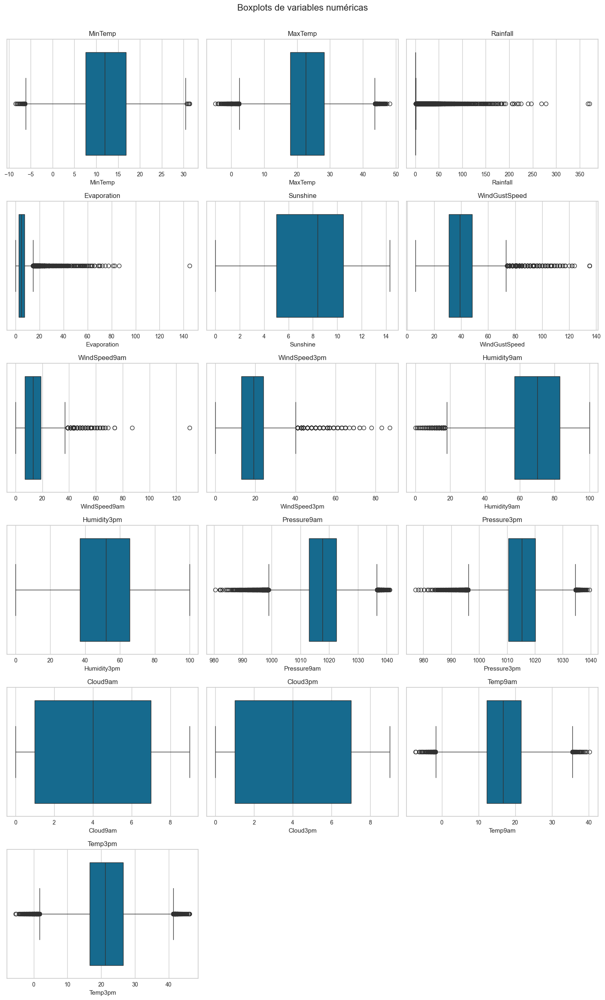

In [ ]:
plot_boxplots(X_train, num_cols)

Aplicamos una transformación logarítmica sobre las variables que poseen valores atípicos y una distribución sesgada a la derecha.

In [ ]:
# Variables con valores > 0 → aplicar log
vars_log = ['WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm']

for col in vars_log:
    X_train[col + '_log'] = np.log1p(X_train[col])
    X_test[col + '_log'] = np.log1p(X_test[col])

Transformamos el resto de las variables con valores atípicos, que no tienen un comportamiento exponencial, mediante *capping*. También realizamos la misma transformación sobre las variables a las que le aplicamos transformación logarítmica para comparar resultados más adelante.

In [ ]:
def calcular_limites_iqr(X, columnas):
    limites = {}
    for col in columnas:
        q1 = X[col].quantile(0.25)
        q3 = X[col].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        limites[col] = (lower, upper)
    return limites

def aplicar_capping(X, limites):
    X_capped = X.copy()
    for col, (lower, upper) in limites.items():
        X_capped[col + '_cap'] = np.where(
            X[col] > upper, upper,
            np.where(X[col] < lower, lower, X[col])
        )
    return X_capped

def imprimir_limites(limites):
    print("\nLímites de capping por IQR:")
    for col, (lower, upper) in limites.items():
        print(f"  {col}: Lower = {lower:.2f}, Upper = {upper:.2f}")

In [ ]:
# Variables a tratar
vars_cap = ['Temp9am', 'Temp3pm', 'Pressure9am', 'Pressure3pm', 'Humidity9am',
            'MinTemp', 'MaxTemp', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm']

# Calcular límites con X_train
limites_iqr = calcular_limites_iqr(X_train, vars_cap)

# Aplicar capping
X_train = aplicar_capping(X_train, limites_iqr)
X_test = aplicar_capping(X_test, limites_iqr)

# Imprimir los límites
imprimir_limites(limites_iqr)


Límites de capping por IQR:
  Temp9am: Lower = -1.65, Upper = 35.55
  Temp3pm: Lower = 1.75, Upper = 41.35
  Pressure9am: Lower = 999.00, Upper = 1036.60
  Pressure3pm: Lower = 996.10, Upper = 1034.50
  Humidity9am: Lower = 18.00, Upper = 122.00
  MinTemp: Lower = -6.20, Upper = 30.60
  MaxTemp: Lower = 2.45, Upper = 43.65
  WindGustSpeed: Lower = 5.50, Upper = 73.50
  WindSpeed9am: Lower = -11.00, Upper = 37.00
  WindSpeed3pm: Lower = -3.50, Upper = 40.50


Debido a la distribución observada en las variables Rainfall y Evaporation, tomamos la desición de categorizarlas.

In [ ]:
X_train['Rainfall'].describe(percentiles=[.25, .5, .75])

count    113754.000000
mean          2.359334
std           8.531676
min           0.000000
25%           0.000000
50%           0.000000
75%           0.600000
max         371.000000
Name: Rainfall, dtype: float64

In [ ]:
X_train['Rainfall_cat'] = pd.cut(
    X_train['Rainfall'],
    bins=[-float('inf'), 10, 30, float('inf')],
    labels=['bajo', 'medio', 'alto']
)
X_test['Rainfall_cat'] = pd.cut(
    X_test['Rainfall'],
    bins=[-float('inf'), 10, 30, float('inf')],
    labels=['bajo', 'medio', 'alto']
)

In [ ]:
X_train['Evaporation'].describe(percentiles=[.25, .5, .75])

count    113754.000000
mean          5.407129
std           3.879473
min           0.000000
25%           2.600000
50%           4.700000
75%           7.400000
max         145.000000
Name: Evaporation, dtype: float64

In [ ]:
X_train['Evaporation_cat'] = pd.cut(
    X_train['Evaporation'],
    bins=[-float('inf'), 3, 7, float('inf')],
    labels=['bajo', 'medio', 'alto']
)
X_test['Evaporation_cat'] = pd.cut(
    X_test['Evaporation'],
    bins=[-float('inf'), 3, 7, float('inf')],
    labels=['bajo', 'medio', 'alto']
)

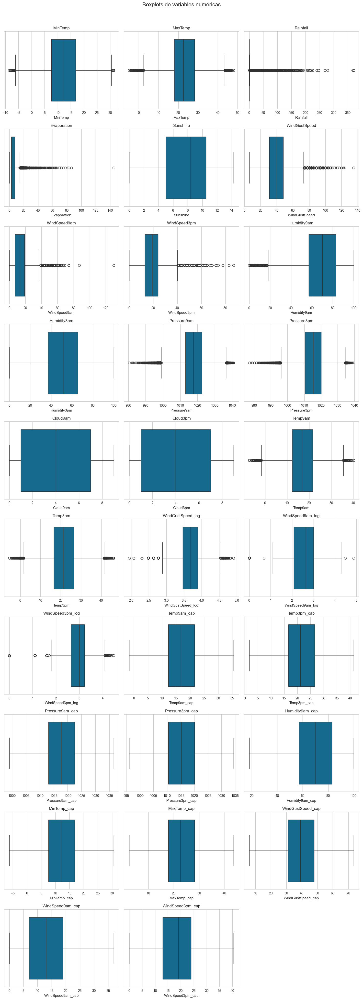

In [ ]:
#volvemos a definir num_cols para que incluya las columnas transformadas
num_cols_transf = X_train.select_dtypes(include=['float64', 'int64']).columns
plot_boxplots(X_train, num_cols_transf)

Analizamos la distribución de las variables numéricas luego del tratamiento de outliers.

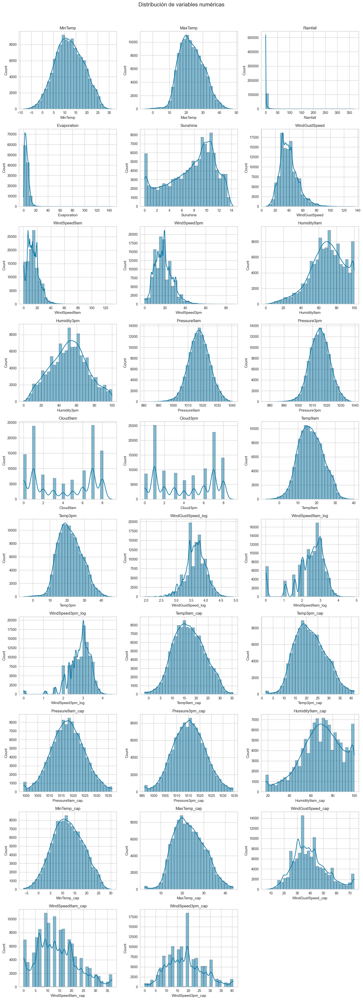

In [ ]:
plot_numeric_distributions(X_train, num_cols_transf)

Viendo los gráficos podemos comparar los distintos resultados de aplicar transformaciones a las variables originales y tomar desiciones sobre que variables utilizar para entrenar el modelo.

## Estandarizacion y Codificación

In [ ]:
# Mapeo de direcciones a grados
wind_dir_map = {
    'N': 0, 'NNE': 22.5, 'NE': 45, 'ENE': 67.5, 'E': 90,
    'ESE': 112.5, 'SE': 135, 'SSE': 157.5, 'S': 180, 'SSW': 202.5,
    'SW': 225, 'WSW': 247.5, 'W': 270, 'WNW': 292.5, 'NW': 315, 'NNW': 337.5
}

# Convertir direcciones a grados a grados
X_train['WindGustDir_degrees'] = X_train['WindGustDir'].map(wind_dir_map)
X_test['WindGustDir_degrees'] = X_test['WindGustDir'].map(wind_dir_map)
X_train['WindDir9am_degrees'] = X_train['WindDir9am'].map(wind_dir_map)
X_test['WindDir9am_degrees'] = X_test['WindDir9am'].map(wind_dir_map)
X_train['WindDir3pm_degrees'] = X_train['WindDir3pm'].map(wind_dir_map)
X_test['WindDir3pm_degrees'] = X_test['WindDir3pm'].map(wind_dir_map)

# Codificación cíclica para WindGustDir
X_train['WindGustDir_sin'] = np.sin(2 * np.pi * X_train['WindGustDir_degrees'] / 360)
X_train['WindGustDir_cos'] = np.cos(2 * np.pi * X_train['WindGustDir_degrees'] / 360)

X_test['WindGustDir_sin'] = np.sin(2 * np.pi * X_test['WindGustDir_degrees'] / 360)
X_test['WindGustDir_cos'] = np.cos(2 * np.pi * X_test['WindGustDir_degrees'] / 360)

# Codificación cíclica para WindDir9am
X_train['WindDir9am_sin'] = np.sin(2 * np.pi * X_train['WindDir9am_degrees'] / 360)
X_train['WindDir9am_cos'] = np.cos(2 * np.pi * X_train['WindDir9am_degrees'] / 360)

X_test['WindDir9am_sin'] = np.sin(2 * np.pi * X_test['WindDir9am_degrees'] / 360)
X_test['WindDir9am_cos'] = np.cos(2 * np.pi * X_test['WindDir9am_degrees'] / 360)

# Codificación cíclica para WindDir3pm
X_train['WindDir3pm_sin'] = np.sin(2 * np.pi * X_train['WindDir3pm_degrees'] / 360)
X_train['WindDir3pm_cos'] = np.cos(2 * np.pi * X_train['WindDir3pm_degrees'] / 360)

X_test['WindDir3pm_sin'] = np.sin(2 * np.pi * X_test['WindDir3pm_degrees'] / 360)
X_test['WindDir3pm_cos'] = np.cos(2 * np.pi * X_test['WindDir3pm_degrees'] / 360)

# Codificación cíclica para mes
X_train['mes_sin'] = np.sin(2 * np.pi * X_train['mes'] / 12)
X_train['mes_cos'] = np.cos(2 * np.pi * X_train['mes'] / 12)

X_test['mes_sin'] = np.sin(2 * np.pi * X_test['mes'] / 12)
X_test['mes_cos'] = np.cos(2 * np.pi * X_test['mes'] / 12)

Observamos la información de las variables resultantes.

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113754 entries, 0 to 113753
Data columns (total 50 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   MinTemp              113754 non-null  float64 
 1   MaxTemp              113754 non-null  float64 
 2   Rainfall             113754 non-null  float64 
 3   Evaporation          113754 non-null  float64 
 4   Sunshine             113754 non-null  float64 
 5   WindGustDir          113754 non-null  object  
 6   WindGustSpeed        113754 non-null  float64 
 7   WindDir9am           113754 non-null  object  
 8   WindDir3pm           113754 non-null  object  
 9   WindSpeed9am         113754 non-null  float64 
 10  WindSpeed3pm         113754 non-null  float64 
 11  Humidity9am          113754 non-null  float64 
 12  Humidity3pm          113754 non-null  float64 
 13  Pressure9am          113754 non-null  float64 
 14  Pressure3pm          113754 non-null  float64 
 15  

Eliminamos las variables que no va a utilizar el modelo.

In [ ]:
X_train.drop(columns=['WindGustDir_degrees','WindGustDir','WindDir9am','WindDir9am_degrees','WindDir3pm','WindDir3pm_degrees', 'mes',
                      'Evaporation', 'Rainfall', 'fecha', 'MinTemp', 'MaxTemp','WindGustSpeed','WindSpeed9am',
                      'WindSpeed3pm', 'Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm', 'WindGustSpeed_log',
                      'WindSpeed9am_log', 'WindSpeed3pm_log'], inplace=True)
X_test.drop(columns=['WindGustDir_degrees','WindGustDir','WindDir9am','WindDir9am_degrees','WindDir3pm','WindDir3pm_degrees', 'mes',
                      'Evaporation', 'Rainfall', 'fecha', 'MinTemp', 'MaxTemp','WindGustSpeed','WindSpeed9am',
                      'WindSpeed3pm', 'Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm', 'WindGustSpeed_log',
                      'WindSpeed9am_log', 'WindSpeed3pm_log'], inplace=True)

In [ ]:
onehot_cols = ['Rainfall_cat', 'Evaporation_cat', 'RegionCluster']
binary_cols = ['RainToday']

In [ ]:
# Redefinimos nuestras columnas numéricas para realizar el escalado posterior
# Columnas numéricas
num_cols = [
    'Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio',
    'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap',
    'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap',
    'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap'
]


In [ ]:
print(num_cols)

['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap']


In [ ]:
print("Columnas en X_train:", list(X_train.columns))

print("num_cols:", num_cols)
print("onehot_cols:", onehot_cols)
print("binary_cols:", binary_cols)

for col_list in [num_cols, onehot_cols, binary_cols]:
    for col in col_list:
        if col not in X_train.columns:
            print(f"ERROR: Columna '{col}' no está en X_train")


Columnas en X_train: ['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'RainToday', 'anio', 'RegionCluster', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap', 'Rainfall_cat', 'Evaporation_cat', 'WindGustDir_sin', 'WindGustDir_cos', 'WindDir9am_sin', 'WindDir9am_cos', 'WindDir3pm_sin', 'WindDir3pm_cos', 'mes_sin', 'mes_cos']
num_cols: ['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap']
onehot_cols: ['Rainfall_cat', 'Evaporation_cat', 'RegionCluster']
binary_cols: ['RainToday']


Realizamos el escalado de las variables numéricas.

In [ ]:
# Crear el preprocesador
preprocesador = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'), onehot_cols),
    ('binary', OrdinalEncoder(), binary_cols)
])

# Modelado

Chequeamos los datos finales con los que entrenaremos nuestro modelo.

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113754 entries, 0 to 113753
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   Sunshine           113754 non-null  float64 
 1   Humidity3pm        113754 non-null  float64 
 2   Cloud9am           113754 non-null  float64 
 3   Cloud3pm           113754 non-null  float64 
 4   RainToday          113754 non-null  object  
 5   anio               113754 non-null  int32   
 6   RegionCluster      113754 non-null  int32   
 7   Temp9am_cap        113754 non-null  float64 
 8   Temp3pm_cap        113754 non-null  float64 
 9   Pressure9am_cap    113754 non-null  float64 
 10  Pressure3pm_cap    113754 non-null  float64 
 11  Humidity9am_cap    113754 non-null  float64 
 12  MinTemp_cap        113754 non-null  float64 
 13  MaxTemp_cap        113754 non-null  float64 
 14  WindGustSpeed_cap  113754 non-null  float64 
 15  WindSpeed9am_cap   113754 non-null

In [ ]:
X_test.isnull().sum()

Sunshine             0
Humidity3pm          0
Cloud9am             0
Cloud3pm             0
RainToday            0
anio                 0
RegionCluster        0
Temp9am_cap          0
Temp3pm_cap          0
Pressure9am_cap      0
Pressure3pm_cap      0
Humidity9am_cap      0
MinTemp_cap          0
MaxTemp_cap          0
WindGustSpeed_cap    0
WindSpeed9am_cap     0
WindSpeed3pm_cap     0
Rainfall_cat         0
Evaporation_cat      0
WindGustDir_sin      0
WindGustDir_cos      0
WindDir9am_sin       0
WindDir9am_cos       0
WindDir3pm_sin       0
WindDir3pm_cos       0
mes_sin              0
mes_cos              0
dtype: int64

In [ ]:
print("num_cols:", num_cols)


num_cols: ['Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio', 'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap', 'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap', 'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap']


Realizamos el modelado con **Regresión Logística**

In [ ]:
X_test_original = X_test.copy()
X_train_original = X_train.copy()
Y_train_original = y_train.copy()
Y_test_original = y_test.copy()

In [ ]:
# Creación del pipeline con el modelo de regresion lineal
# Pipeline con regularización aplicando Ridge
pipeline = Pipeline([
    ('preprocesamiento', preprocesador),
    ('model', LogisticRegression(penalty='l2', random_state=42))
])


# Fitteo y prediccion del modelo
pipeline.fit(X_train, y_train)

# Predicciones en el conjunto de prueba
y_pred = pipeline.predict(X_test)


In [ ]:
print(y_pred)

[0 1 0 ... 0 1 0]


# Evaluación del modelo

Realizamos la matriz de confusión del modelo entrenado.

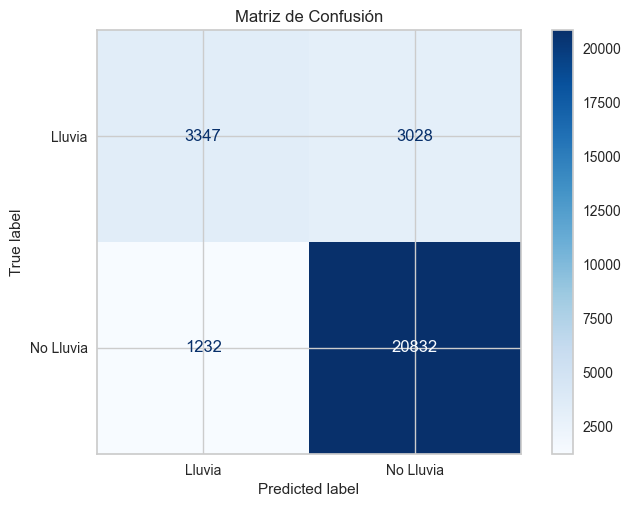

In [ ]:
# Probabilidades para clase 1 (lluvia)
y_scores = pipeline.predict_proba(X_test)[:, 1]

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred, labels=[1, 0])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Lluvia', 'No Lluvia'])
disp.plot(cmap='Blues')
plt.title('Matriz de Confusión')
plt.show()

## Métricas

Dado que nuestros datos se encuentran desbalanceados descartamos la posibilidad de aplicar Accuracy. Utilizaremos las métricas de Recall, Precisión y F1 como combinación de ellas para evaluar ambas clases. Específicamente buscaremos minimizar los FN, es decir, la predicción de que no llovía cuando sí llovió. Para esto, le daremos mayor importancia a la métrica de Recall de la clase 1 (Sí llovió) que representa cuantos de los días en los que si llovió fueron detectados correctamente por la predicción del modelo.


In [ ]:
def matriz_de_confusion(clases_reales, clases_predichas, titulo):
    """ Visualiza la matriz de confusión con métrica personalizada """
    matriz = confusion_matrix(clases_reales, clases_predichas)

    # Cálculo de precision y recall
    recall = recall_score(clases_reales, clases_predichas, pos_label=1)
    precision = precision_score(clases_reales, clases_predichas, pos_label=1)
    # Métrica personalizada
    metrica = (2 * recall + precision) / 3

    matriz = pd.DataFrame(matriz,
                          columns=["0 : No llueve", "1 : Llueve"],
                          index=["0 : No llueve", "1 : Llueve"])

    plt.figure(figsize=(4, 4))
    plt.matshow(matriz.values, cmap="Blues", vmin=0, vmax=20000)
    plt.xticks(range(len(matriz.columns)), matriz.columns, rotation=45)
    plt.yticks(range(len(matriz.index)), matriz.index)

    etiquetas = (("Verdaderos\nnegativos", "Falsos\npositivos"),
                 ("Falsos\nnegativos", "Verdaderos\npositivos"))

    plt.text(1.60, -0.30, titulo, fontsize=25, c="red")
    plt.text(2.1, 0.10, f"Métrica custom: {metrica:.2f}", fontsize=15, color="blue")


    for i in range(len(matriz.columns)):
        for j in range(len(matriz.columns)):
            plt.text(i, j + 0.14, str(matriz.iloc[j, i]),
                     fontsize=30, ha="center", va="center")
            plt.text(i, j - 0.25, etiquetas[j][i],
                     fontsize=11.5, ha="center", va="center")
    plt.show()

In [ ]:
# Métricas de evaluación
precision = precision_score(y_test, y_pred, pos_label=1)
recall = recall_score(y_test, y_pred, pos_label=1)
f1 = f1_score(y_test, y_pred, pos_label=1)
# Cálculo de métrica personalizada
custom_metric = (2 * recall + precision) / 3

print(f"\n Métricas del modelo:")
print(f"Precision: {precision:.2f}")
print(f"Recall   : {recall:.2f}  ← Buscamos maximizarla, por importancia de los FN")
print(f"F1-score : {f1:.2f}")
print(f"Métrica custom : {custom_metric:.2f}   ← (2*recall+precision)/3")


print("\n Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=['No Lluvia', 'Lluvia']))



 Métricas del modelo:
Precision: 0.73
Recall   : 0.53  ← Buscamos maximizarla, por importancia de los FN
F1-score : 0.61
Métrica custom : 0.59   ← (2*recall+precision)/3

 Reporte de clasificación:
              precision    recall  f1-score   support

   No Lluvia       0.87      0.94      0.91     22064
      Lluvia       0.73      0.53      0.61      6375

    accuracy                           0.85     28439
   macro avg       0.80      0.73      0.76     28439
weighted avg       0.84      0.85      0.84     28439



Calculamos las métricas de entrenamiento para analizar el fitting del modelo.

In [ ]:
y_pred_train = pipeline.predict(X_train)
# Métricas de evaluación
precision = precision_score(y_train, y_pred_train, pos_label=1)
recall = recall_score(y_train, y_pred_train, pos_label=1)
f1 = f1_score(y_train, y_pred_train, pos_label=1)
custom_metric = (2 * recall + precision) / 3

print(f"\n Métricas del modelo (para los datos de entrenamiento):")
print(f"Precision: {precision:.2f}")
print(f"Recall   : {recall:.2f}")
print(f"F1-score : {f1:.2f}")
print(f"Métrica custom : {custom_metric:.2f}   ← (2*recall+precision)/3")

print("\n Reporte de clasificación:")
print(classification_report(y_train, y_pred_train, target_names=['No Lluvia', 'Lluvia']))


 Métricas del modelo (para los datos de entrenamiento):
Precision: 0.72
Recall   : 0.52
F1-score : 0.61
Métrica custom : 0.59   ← (2*recall+precision)/3

 Reporte de clasificación:
              precision    recall  f1-score   support

   No Lluvia       0.87      0.94      0.91     88252
      Lluvia       0.72      0.52      0.61     25502

    accuracy                           0.85    113754
   macro avg       0.80      0.73      0.76    113754
weighted avg       0.84      0.85      0.84    113754



Notamos que las métricas son similares en train y test por lo tanto deducimos que no hay Overfitting.

Probamos con un umbral menor (0.3) con el objetivo de aumentar el recall de la clase 1 (lluvia).

In [ ]:
# Elegir un nuevo umbral
umbral = 0.3

# Aplicar el nuevo umbral para obtener las predicciones ajustadas
y_pred_umbral = (y_scores >= umbral).astype(int)


In [ ]:
# Métricas con nuevo umbral
print(confusion_matrix(y_test, y_pred_umbral))
print(classification_report(y_test, y_pred_umbral, target_names=['No Lluvia', 'Lluvia']))
# Métrica personalizada
recall = recall_score(y_test, y_pred_umbral, pos_label=1)
precision = precision_score(y_test, y_pred_umbral, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")

[[19001  3063]
 [ 1851  4524]]
              precision    recall  f1-score   support

   No Lluvia       0.91      0.86      0.89     22064
      Lluvia       0.60      0.71      0.65      6375

    accuracy                           0.83     28439
   macro avg       0.75      0.79      0.77     28439
weighted avg       0.84      0.83      0.83     28439

Métrica custom (2*recall + precision)/3: 0.67


Podemos observar como mejora nuestra métrica de 0.59 a 0.67.

## Curva ROC

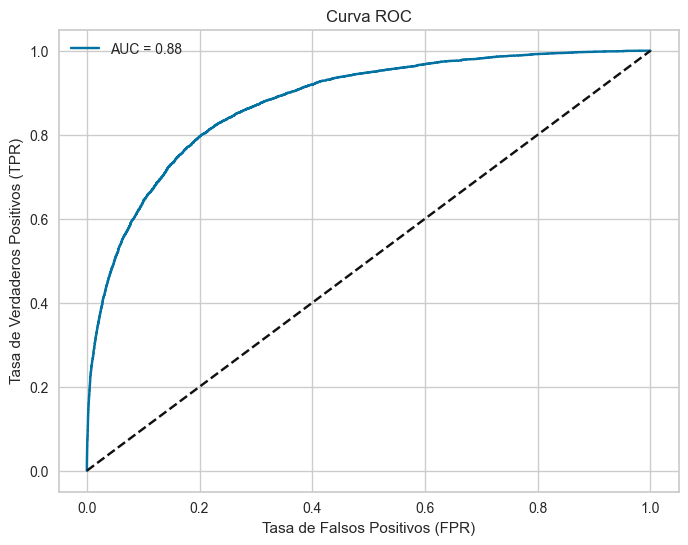

In [ ]:
# Curva ROC y AUC
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {roc_auc_score(y_test, y_scores):.2f}')
plt.plot([0, 1], [0, 1], 'k--')  # Línea aleatoria
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC')
plt.legend()
plt.grid(True)
plt.show()

Probamos con el umbral óptimo, obtenido del punto de la curva ROC más cercano al vértice superior izquierdo, con el objetivo de equilibrar la tasa de verdaderos positivos y falsos positivos.

In [ ]:
# y_scores  son las probabilidades para clase 1
fpr, tpr, thresholds = roc_curve(y_test, y_scores)

# Calcular distancia al punto (0,1) para cada umbral
distancias = np.sqrt((fpr - 0)**2 + (tpr - 1)**2)

# Índice del umbral óptimo
idx_optimo = np.argmin(distancias)

# Umbral óptimo
umbral_optimo = thresholds[idx_optimo]

print(f" Umbral óptimo según curva ROC: {umbral_optimo:.2f}")

 Umbral óptimo según curva ROC: 0.22


<Figure size 400x400 with 0 Axes>

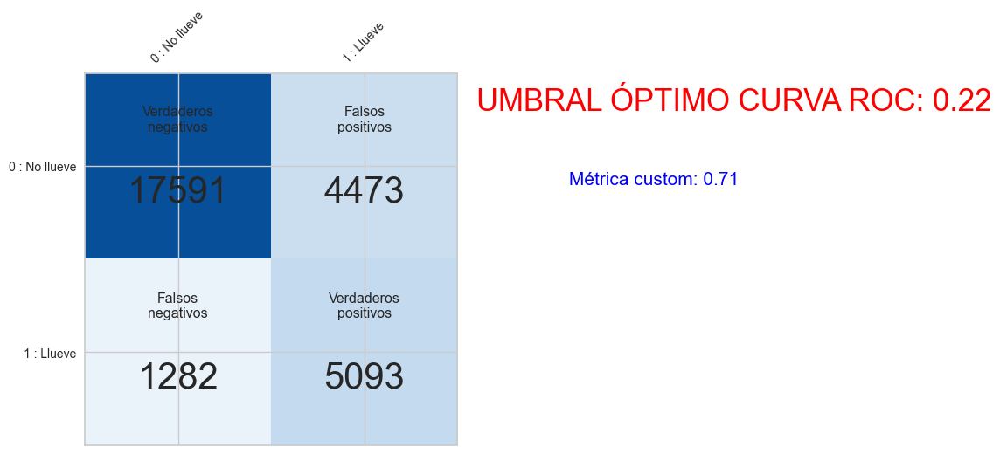

              precision    recall  f1-score   support

   No Lluvia       0.93      0.80      0.86     22064
      Lluvia       0.53      0.80      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439



In [ ]:
# Aplicar el umbral óptimo
y_pred_optimo = (y_scores >= umbral_optimo).astype(int)

# Evaluar desempeño
matriz_de_confusion(y_test, y_pred_optimo, "UMBRAL ÓPTIMO CURVA ROC: 0.22")
print(classification_report(y_test, y_pred_optimo, target_names=['No Lluvia', 'Lluvia']))


Podemos observar como mejora nuestra métrica a 0.71.

Probamos disminuyendo el umbral a 0.18.

In [ ]:
# Elegir un nuevo umbral
umbral = 0.14

# Aplicar el nuevo umbral para obtener las predicciones ajustadas
y_pred_umbral = (y_scores >= umbral).astype(int)

<Figure size 400x400 with 0 Axes>

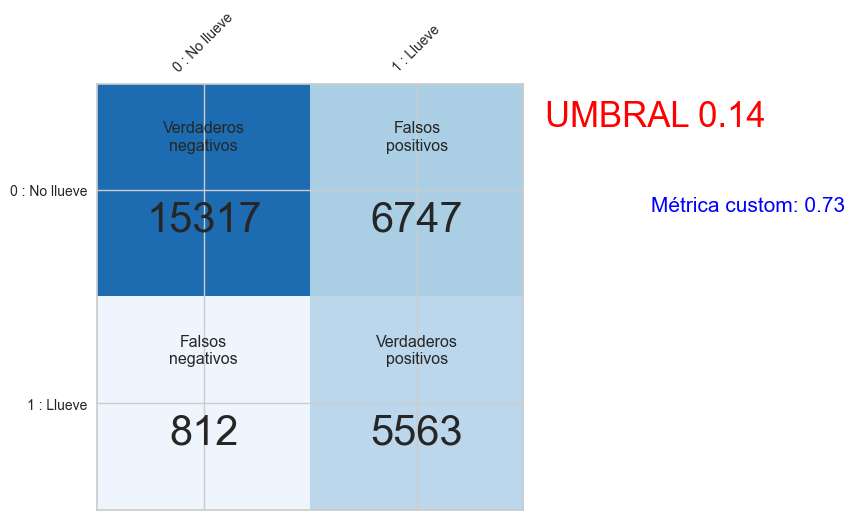

              precision    recall  f1-score   support

   No Lluvia       0.95      0.69      0.80     22064
      Lluvia       0.45      0.87      0.60      6375

    accuracy                           0.73     28439
   macro avg       0.70      0.78      0.70     28439
weighted avg       0.84      0.73      0.76     28439



In [ ]:
# Métricas con nuevo umbral
matriz_de_confusion(y_test, y_pred_umbral, "UMBRAL 0.14")
print(classification_report(y_test, y_pred_umbral, target_names=['No Lluvia', 'Lluvia']))

Observamos un valor superior de nuestra métrica en 0.73.

# Tratamiento de desbalanceo

Observamos cómo es la distribución de nuestros datos según la clase.

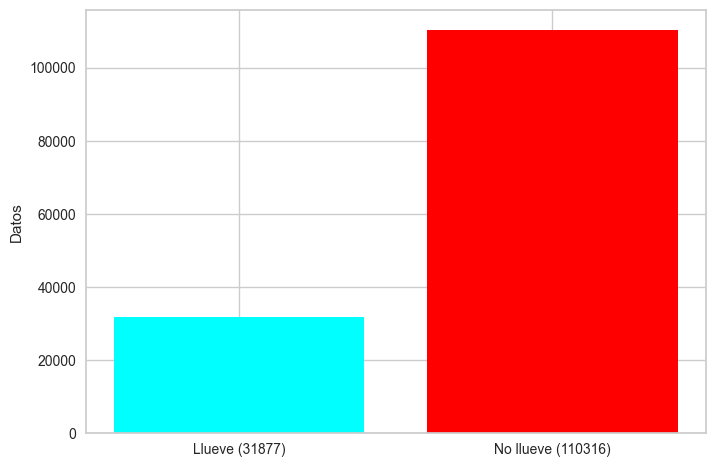

In [ ]:
llueve = len(y[y == 1])
no_llueve = len(y[y == 0])

plt.bar(["Llueve (%d)" % llueve, "No llueve (%d)" % no_llueve],
        [llueve, no_llueve],
        color =["cyan", "red"],
        width = 0.8)
plt.ylabel("Datos")
plt.show()

Se observa un gran desbalanceo que puede ocasionar inconvenientes en las predicciones.

In [ ]:
pipeline_balanceado = Pipeline(steps=[
    ('preprocesamiento', preprocesador),
    ('model',  LogisticRegression(random_state=42, class_weight='balanced'))
])

# Fitteo y prediccion del modelo
pipeline_balanceado.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_balanceado = pipeline_balanceado.predict(X_test)

# Obtengo las probabilidades de predicción del modelo
y_probs_balanceado = pipeline_balanceado.predict_proba(X_test)[:, 0]

# Evaluar
print("Resultados regresión logística con balanceo:\n")
print(classification_report(y_test, y_pred_balanceado))
# Métrica personalizada
recall = recall_score(y_test, y_pred_balanceado, pos_label=1)
precision = precision_score(y_test, y_pred_balanceado, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")

Resultados regresión logística con balanceo:

              precision    recall  f1-score   support

           0       0.93      0.80      0.86     22064
           1       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Métrica custom (2*recall + precision)/3: 0.71


## Oversampling

Remuestreo con oversampling

In [ ]:
# Crear el pipeline completo con preprocesamiento y oversampling
pipeline_oversampled = ImbPipeline(steps=[
    ('preprocesamiento', preprocesador),
    ('oversample', RandomOverSampler(random_state=42)),
    ('modelo', LogisticRegression(random_state=42))
])

# Entrenar con el pipeline
pipeline_oversampled.fit(X_train, y_train)

# Predecir
y_pred_ov = pipeline_oversampled.predict(X_test)

# Evaluar
print("Resultados regresión logística con Oversampling:\n")
print(classification_report(y_test, y_pred_ov))

# Métrica personalizada
recall = recall_score(y_test, y_pred_ov, pos_label=1)
precision = precision_score(y_test, y_pred_ov, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")


Resultados regresión logística con Oversampling:

              precision    recall  f1-score   support

           0       0.93      0.80      0.86     22064
           1       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Métrica custom (2*recall + precision)/3: 0.71


## Smote

In [ ]:
# Pipeline completo con preprocesamiento y SMOTE
pipeline_smote = ImbPipeline(steps=[
    ('preprocesamiento', preprocesador),   # ColumnTransformer con OneHotEncoder y StandardScaler
    ('smote', SMOTE(random_state=42)),     # aplicamos SMOTE después del preprocesamiento
    ('modelo', LogisticRegression(random_state=42))
])

# Entrenar el pipeline
pipeline_smote.fit(X_train, y_train)

# Predecir sobre el test (se preprocesa igual que el train)
y_pred_smote = pipeline_smote.predict(X_test)

# Evaluar
print("Resultados regresión logística con SMOTE:\n")
print(classification_report(y_test, y_pred_smote))

# Métrica personalizada
recall = recall_score(y_test, y_pred_smote, pos_label=1)
precision = precision_score(y_test, y_pred_smote, pos_label=1)
metrica = (2 * recall + precision) / 3

print(f"Métrica custom (2*recall + precision)/3: {metrica:.2f}")

Resultados regresión logística con SMOTE:

              precision    recall  f1-score   support

           0       0.93      0.81      0.86     22064
           1       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.74      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Métrica custom (2*recall + precision)/3: 0.71


## Comparación de matrices de confusion

<Figure size 400x400 with 0 Axes>

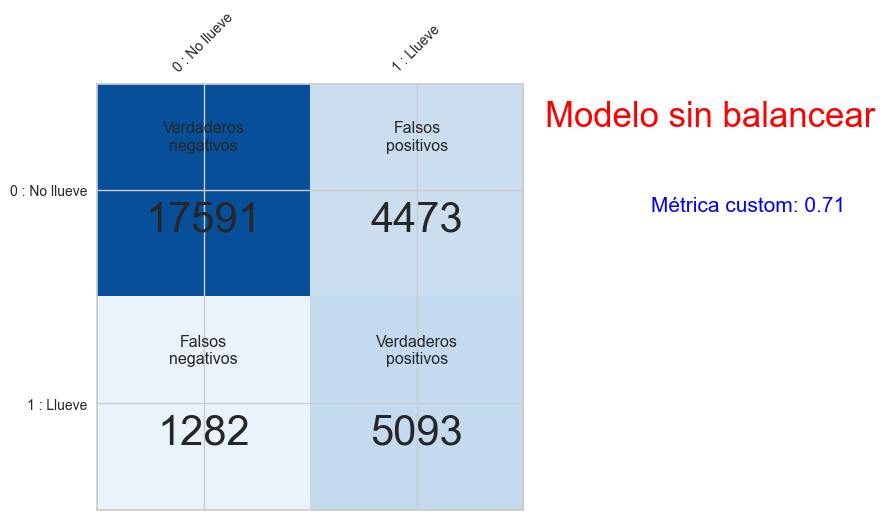

In [ ]:
matriz_de_confusion(y_test, y_pred_optimo, "Modelo sin balancear")

<Figure size 400x400 with 0 Axes>

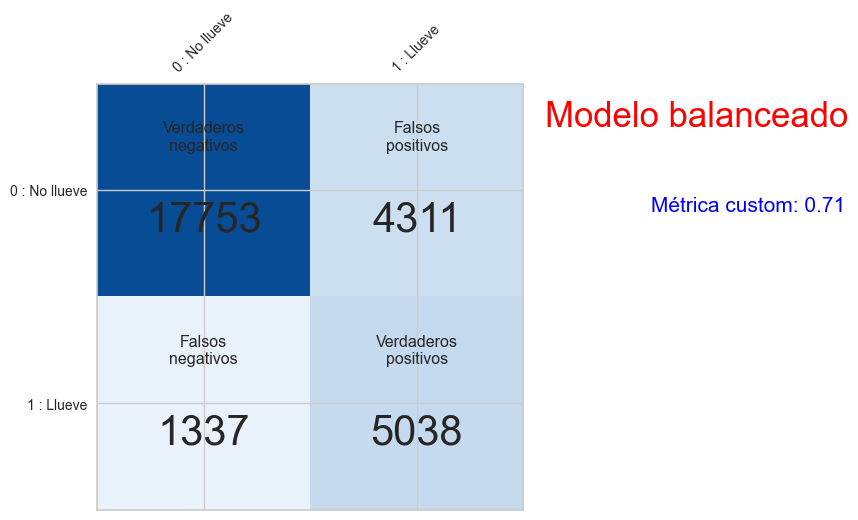

In [ ]:
matriz_de_confusion(y_test, y_pred_balanceado, "Modelo balanceado")

<Figure size 400x400 with 0 Axes>

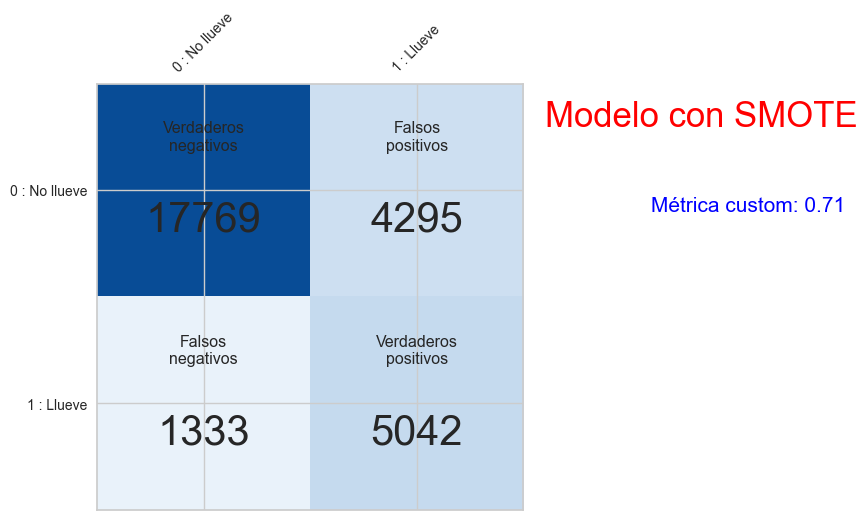

In [ ]:
matriz_de_confusion(y_test, y_pred_smote, "Modelo con SMOTE")

De los resultados de los distintos balanceos aplicados podemos observar que no se producen mejoras en las métricas obtenidas en comparación con el modelo original ajustadando el umbral de decisión al óptimo establecido por la curva ROC. El modelo ajustado con un umbral del 0.14 sigue siendo el de mejor métrica.


# Modelo Base

Utilizamos una única característica (RainToday) para realizar el modelo.

In [ ]:
# Si llovió hoy, predigo que también lloverá mañana; si no, predigo que no
# Mapeo con 0 y 1
y_predbase = X_test['RainToday'].map({'Yes': 1, 'No': 0})

Evaluamos las métricas del modelo base.

<Figure size 400x400 with 0 Axes>

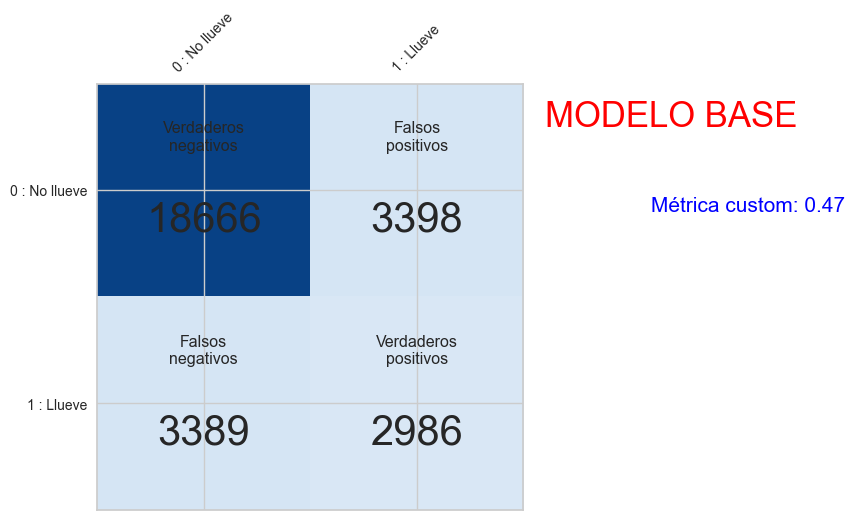

              precision    recall  f1-score   support

           0       0.85      0.85      0.85     22064
           1       0.47      0.47      0.47      6375

    accuracy                           0.76     28439
   macro avg       0.66      0.66      0.66     28439
weighted avg       0.76      0.76      0.76     28439



In [ ]:
matriz_de_confusion(y_test, y_predbase, "MODELO BASE")
print(classification_report(y_test, y_predbase))


Observamos que nuestro modelo tiene mejores métricas que el modelo base con un F1 Score significativamente superior.

# Optimización de Hiperparámetros

Optimizamos:

* El umbral de decisión, que define a partir de qué probabilidad el modelo clasifica una instancia como positiva.

* C, el hiperparámetro de regularización de la regresión logística, que controla la fuerza de penalización L2 sobre los coeficientes del modelo (es el inverso de alpha en la regresión Ridge).


Definimos nuestra métrica y la utilizamos como métrica a maximizar en la optiimizacion de hiperparámetros.

[I 2025-06-29 17:19:23,817] A new study created in memory with name: no-name-d2cb7627-fb0a-4b26-90fb-c9e3962607e2
[I 2025-06-29 17:19:26,129] Trial 0 finished with value: -0.5606429050670615 and parameters: {'C': 0.0009261325186464186, 'umbral': 0.53}. Best is trial 0 with value: -0.5606429050670615.
[I 2025-06-29 17:19:27,922] Trial 1 finished with value: -0.3406118889246358 and parameters: {'C': 0.0003306777396011392, 'umbral': 0.9}. Best is trial 0 with value: -0.5606429050670615.
[I 2025-06-29 17:19:32,324] Trial 2 finished with value: -0.7238819843470239 and parameters: {'C': 2.725347486269595, 'umbral': 0.16}. Best is trial 2 with value: -0.7238819843470239.
[I 2025-06-29 17:19:34,159] Trial 3 finished with value: -0.5550969096466348 and parameters: {'C': 0.00034810067142928343, 'umbral': 0.52}. Best is trial 2 with value: -0.7238819843470239.
[I 2025-06-29 17:19:37,035] Trial 4 finished with value: -0.7093106167022706 and parameters: {'C': 0.008367651010745285, 'umbral': 0.2}. B

Mejores hiperparámetros: {'C': 91.5781873157928, 'umbral': 0.04}


<Figure size 400x400 with 0 Axes>

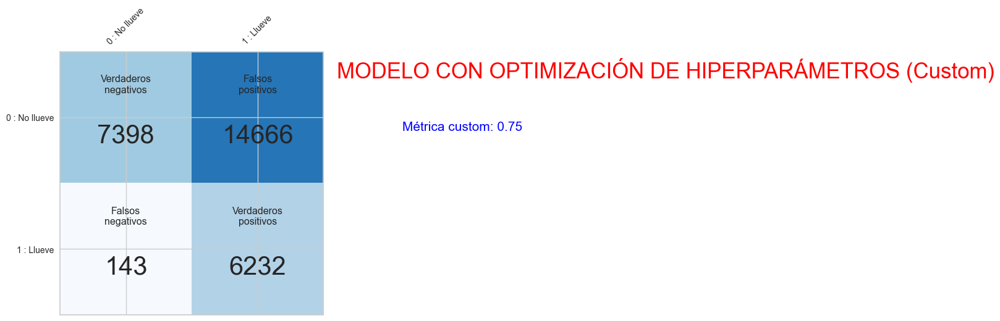

              precision    recall  f1-score   support

           0       0.98      0.34      0.50     22064
           1       0.30      0.98      0.46      6375

    accuracy                           0.48     28439
   macro avg       0.64      0.66      0.48     28439
weighted avg       0.83      0.48      0.49     28439



In [ ]:
def custom_metric(y_true, y_pred):
    recall = recall_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    return (2 * recall + precision) / 3

def objective(trial):
    C = trial.suggest_float('C', 1e-4, 100.0, log=True)
    umbral = trial.suggest_float('umbral', 0.0, 1.0, step=0.01)

    pipeline = Pipeline(steps=[
        ('preprocesamiento', preprocesador),
        ('model', LogisticRegression(penalty='l2', C=C, solver='liblinear', random_state=42))
    ])

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    metric_scores = []

    for train_idx, val_idx in cv.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        pipeline.fit(X_tr, y_tr)
        y_scores = pipeline.predict_proba(X_val)[:, 1]
        y_pred_umbral = (y_scores >= umbral).astype(int)

        # Usamos la métrica custom
        metric = custom_metric(y_val, y_pred_umbral)
        metric_scores.append(metric)

    # maximizamos la metrica
    return -np.mean(metric_scores)  # direction='minimize'
    # O directamente:
    # return np.mean(metric_scores)  # direction='maximize'

study = optuna.create_study(direction='minimize')


study.optimize(objective, n_trials=20)

best_params = study.best_params
print("Mejores hiperparámetros:", best_params)

# Entrenar pipeline final con mejores hiperparámetros
final_pipeline = Pipeline(steps=[
    ('preprocesamiento', preprocesador),
    ('model', LogisticRegression(penalty='l2', C=best_params['C'], solver='liblinear', random_state=42))
])
final_pipeline.fit(X_train, y_train)

# Predecir en test con el mejor umbral
y_scores_test = final_pipeline.predict_proba(X_test)[:, 1]
y_pred_test_op = (y_scores_test >= best_params['umbral']).astype(int)

# Evaluar desempeño
matriz_de_confusion(y_test, y_pred_test_op, "MODELO CON OPTIMIZACIÓN DE HIPERPARÁMETROS (Custom)")
print(classification_report(y_test, y_pred_test_op))



Observamos una mejora en nuestra métrica alcanzando un valor de 0.75 al optimizar los hiperparametros con los siguientes valores:
* C: 0.013599722892075077
* umbral: 0.03

Luego de comparar las distintas métricas de desempeño y analizar las matrices de confusión, así como las decisiones tomadas en cada etapa del trabajo, optamos por quedarnos con el modelo de regresión logística con regularización y optimización de hiperparametros siendo el mismo un modelo más simple, con mejor interpretabilidad y desempeño más cercano al buscado.

# Explicabilidad

In [ ]:

# Transformar X_test con el preprocesador
X_test = preprocesador.transform(X_test)
X_train = preprocesador.transform(X_train)

# Extraer el modelo entrenado del pipeline
model = final_pipeline.named_steps['model']

# Crear el explainer SHAP usando los datos ya transformados
explainer = shap.Explainer(model, X_train, feature_names=preprocesador.get_feature_names_out(), )

In [ ]:
# Calculamos los valores SHAP para un conjunto de ejemplos de prueba
shap_values = explainer(X_test)

In [ ]:
shap_values.shape

(28439, 28)

Procedemos a imprimir el **base value** (valor base), es decir la predicción promedio del modelo antes de ver ninguna información de una observación en particular

In [ ]:
explainer.expected_value

-1.781214212770938

## Interpretabilidad **local**

Comparamos los graficos de fuerzas para las muestras de indice 0,1 y 2.

In [ ]:
shap_values[0]
shap_values[1]
shap_values[2]

.values =
array([-9.56461124e-02,  3.44981325e-01, -1.65157570e-02, -1.41924207e-01,
        2.28542226e-02,  1.05254212e-01,  6.50540135e-02, -1.39968135e+00,
        2.20294198e+00, -2.23682023e-02, -3.62597366e-02, -3.00702829e-02,
       -1.06012442e-01,  1.38930653e-02, -3.50825078e-02, -1.29818748e-02,
       -1.00987176e-03, -4.88217594e-02,  8.22019748e-02, -1.24361336e-01,
        8.34585888e-01, -3.51956311e-02, -4.24555668e-03, -2.71158077e-02,
       -8.71582285e-02, -7.44657464e-03, -8.83652453e-02, -1.50039224e-01])

.base_values =
-1.781214212770938

.data =
array([ 0.18218583,  0.26581951,  0.98888245, -0.40653031,  0.88060277,
        0.68157539,  0.35642057, -1.51912651, -1.67174434, -0.68608071,
        0.75335276,  0.20802832, -0.05543237, -0.10352946,  0.17294125,
        1.        ,  0.        ,  0.        ,  1.        ,  0.        ,
        1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [ ]:
shap.initjs()
# Gráfico de fuerza para índices 0, 1 y 2
for index in [0, 1, 2]:
  print(f"\nSHAP Force Plot para observación {index}")
  display(shap.force_plot(
      explainer.expected_value,
      shap_values.values[index],
      X_test[index],
      feature_names=preprocesador.get_feature_names_out()
  ))


SHAP Force Plot para observación 0



SHAP Force Plot para observación 1



SHAP Force Plot para observación 2


En los ***gráficos de fuerza*** de las muestras tomadas podemos observar el valor base a la izquierda y el valor final de la predicción a la derecha después de aplicarle todas las contribuciones SHAP. Observamos como cada flecha representa una variable y cómo contribuye a la predicción.
Las variables que empujan hacia la derecha (rojo) aumentan la predicción (probabilidad de lluvia). Las vaiables que empujan hacia la izquierda reducen dicha predicción.
De la observación de los tamaños de las flechas mostradas podemos determinar cuan imprtante fué esa variable en la observación.
De allí:
- Observación 0: Gran contribución positva de las horas de sol y negativa de la humedad a las 3pm.
- Observación 1: Gran contribución positiva de la humedad a las 3pm y negativa de la presión a las 9pm.
- Observación 2: Gran contribución positiva de la presión a las 3pm y negativa de la presión a las 9am.

Realizamos gráfico de cascada y barras para las muestras de indice 0,1 y 2.

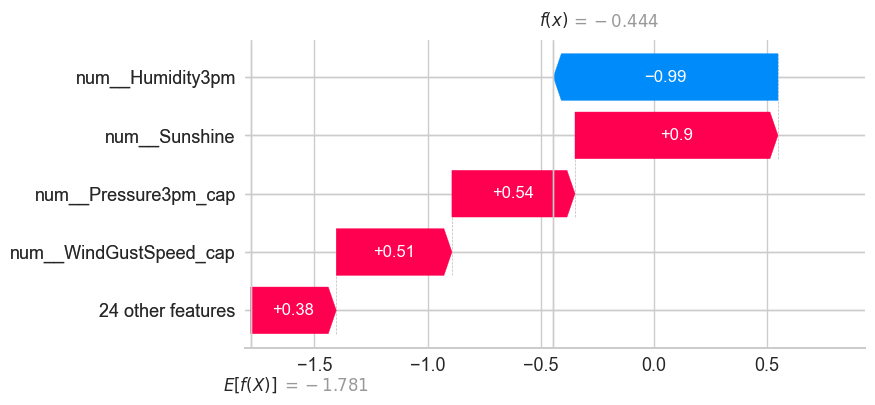

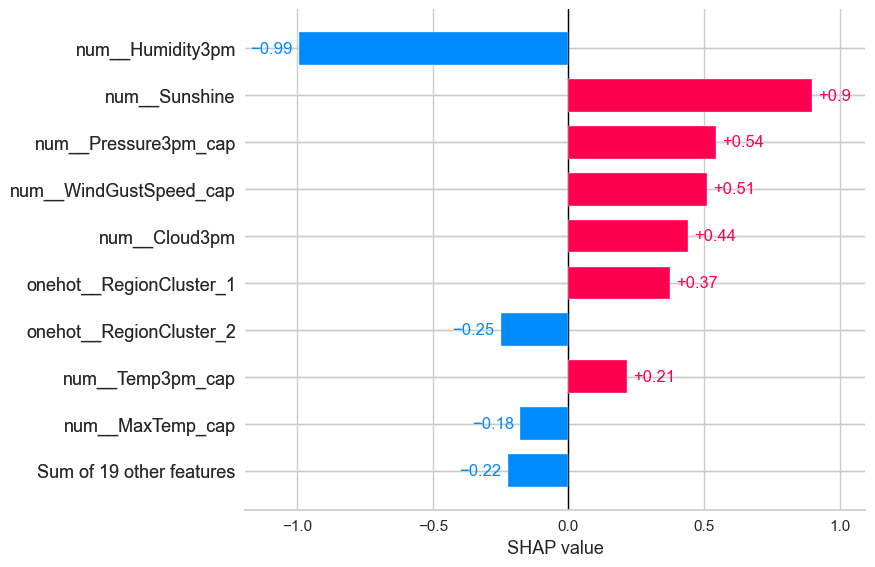

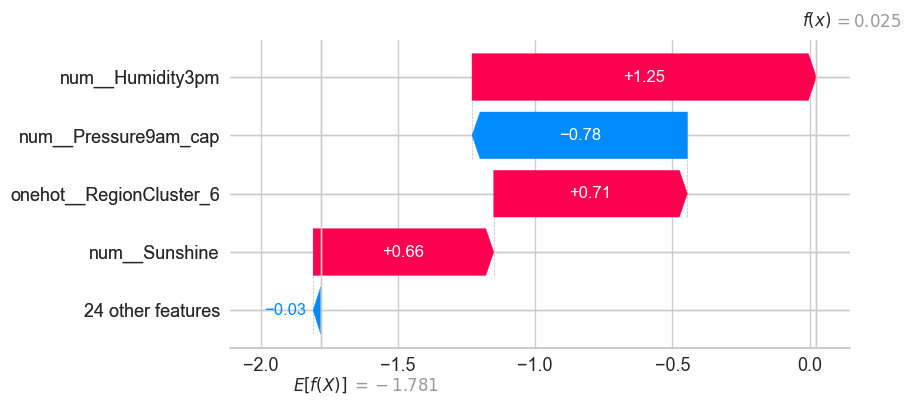

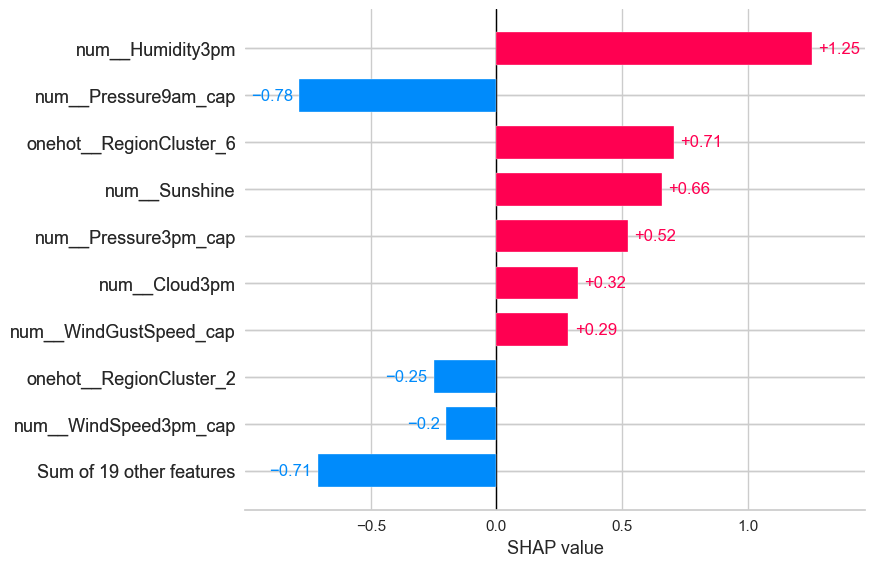

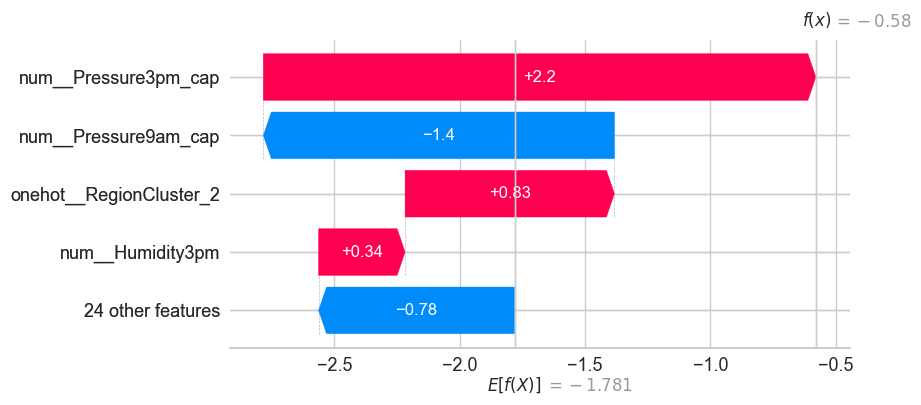

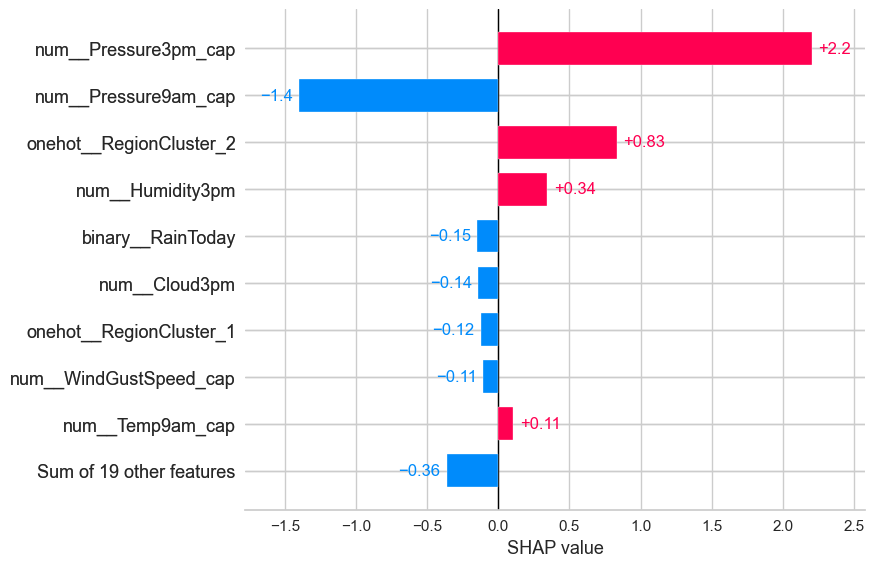

In [ ]:
for index in [0, 1, 2]:
    #Para crear el waterfall creo una explicacion
    explanation = shap.Explanation(
        values=shap_values.values[index],
        base_values=explainer.expected_value,
        feature_names=preprocesador.get_feature_names_out()
    )

    shap.plots.waterfall(explanation, max_display=5)
    shap.plots.bar(explanation)

En los gráficos de cascada y barras presentados podemos complementar la información extraída de los gráficos de fuerza.
En el ***gráfico de cascada*** partimos del base value que determinamos y desde allí podemos ver, cómo cada feature contribuye a la predicción final que estamos analizando. Vemos con barras azules la contribución de variables que disminuyen la predicción y con barras rojas (y su valor) las variables que aumentan la predicción, para llegar así al valor predicho.
Por su parte, el ***gráfico de barras*** complementa la explicación mostrando en forma ordenada la magnitud absoluta por la que influyeron cada una de las variables analizadas previamente.

## Interpretabilidad **global**

Analizamos la explicabilidad de manera global.

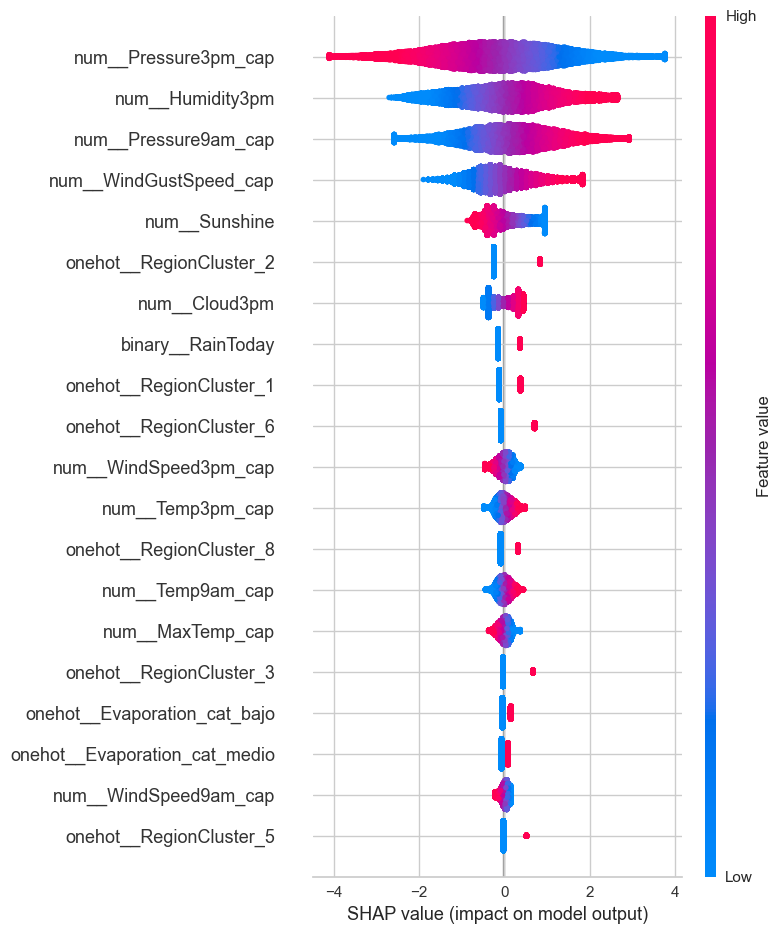

In [ ]:
# Grafico resumen de importancia de variables
shap.summary_plot(shap_values.values, X_test, feature_names=preprocesador.get_feature_names_out())


A partir del gráfico visualizamos el impacto individual de cada feature en las predicciones del modelo.
- Presión 3pm: Feature más influyente. Valores altos de presión (rojo) tienden a mover la predicción hacia NO va a llover (valores SHAP negativos). Valores bajos de presión (azul) tienden a aumentar la probabilidad de lluvia.
- Humedad 3pm: Valores altos contribuyen a predecir lluvia (valores SHAP positivos).
- Velocidad del viento: Ráfagas más fuertes están asociadas con mayor probabilidad de lluvia.
- Horas de Sol: A mayor cantidad de sol, menor probabilidad de lluvia (SHAP negativo)



In [ ]:
explanation = shap.Explanation(values=shap_values, base_values=explainer.expected_value,feature_names=preprocesador.get_feature_names_out(), data=X_test_original)

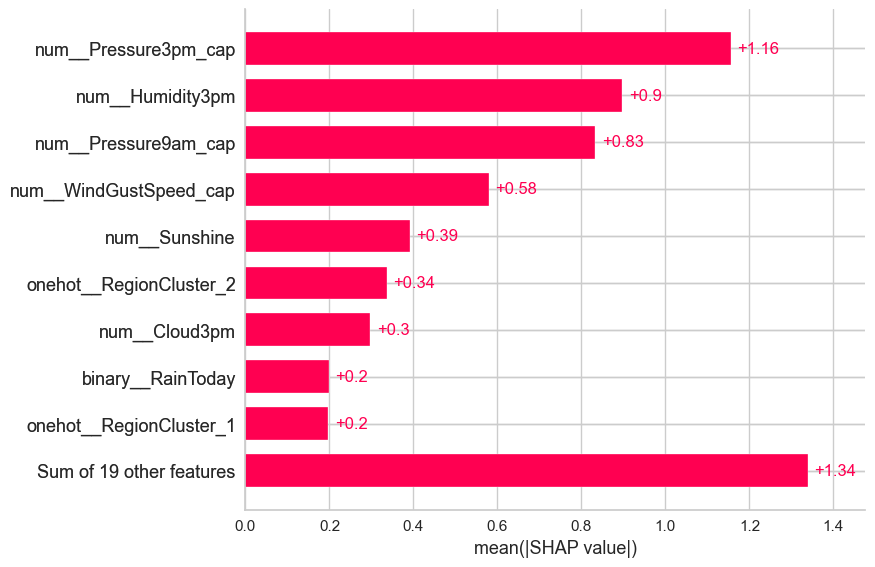

In [ ]:
shap.plots.bar(explanation)

A partir de este gráfico podemos determinar cuáles son las variables más importantes para el modelo y su orden de importancia. De este modo, las 5 variables más importantes en promedio son:


*   Presión a las 3pm
*   Humedad a las 3pm
*   Presión a las 9am
*   Velocidad del viento
*   Horas de sol

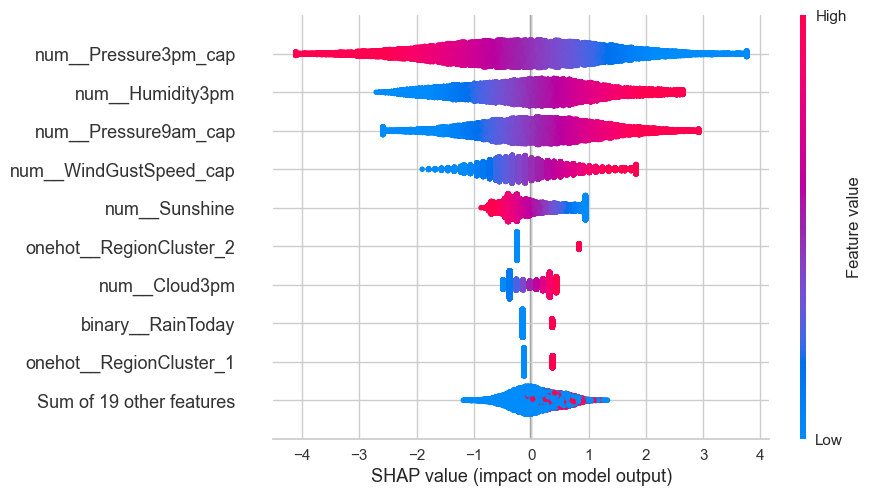

In [ ]:
shap.plots.beeswarm(explanation)

Observamos que las variables meteorológicas numéricas (presión, humedad, sol, viento) son las más importantes.
El modelo aprendió patrones lógicos desde el punto de vista meteorológico:
***humedad alta + presión baja(3pm) + menos sol + ráfagas fuertes = más probabilidad de lluvia.***

# AutoML

In [ ]:
print(type(X_train))
print(type(y_train))


<class 'numpy.ndarray'>
<class 'pandas.core.series.Series'>


In [ ]:
from pycaret.classification import ClassificationExperiment
# Crear una instancia del experimento
exp = ClassificationExperiment()
# Concatenamos
X_train = pd.DataFrame(X_train)
# Reseteamos indices para evitar Nan al concatenar
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
df_train = pd.concat([X_train, y_train.rename('RainTomorrow')], axis=1)
# Borramos faltantes en la target
df_train = df_train.dropna(subset=['RainTomorrow'])


In [ ]:
df_train

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,RainTomorrow
0,1.319660,-1.521260,-0.361116,-0.40653,-0.299239,1.128795,1.715156,-0.620479,-0.680516,-0.898237,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
1,0.507179,-0.410373,-1.036116,-0.76457,-1.085800,-1.246094,-1.031224,0.392283,0.526198,0.189064,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.168644,-0.362073,1.326382,1.02563,1.273883,-0.089492,0.197420,-0.748857,-0.709247,-0.261768,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
3,-0.846958,0.120921,0.651383,-0.04849,0.880603,1.915284,1.628428,-1.918526,-2.030885,0.321662,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,1.102999,-0.313774,0.988882,-0.76457,-0.299239,0.666154,0.356421,1.019910,0.842242,-0.580003,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113749,0.778006,-1.569559,-0.023617,0.66759,-0.299239,0.650733,1.180334,0.021413,-0.134621,-1.375589,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0
113750,-1.578192,-1.569559,0.988882,-1.12261,0.487322,1.329272,1.671792,-2.232339,-2.318198,0.215584,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
113751,-1.618816,1.980450,1.326382,1.38367,-1.085800,-0.336234,-1.313089,0.164055,-0.192084,0.852052,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
113752,1.292578,-0.555271,-1.036116,-0.76457,0.880603,0.866632,0.920151,0.278169,0.095229,-0.580003,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
exp.setup(
    data=df_train,
    target='RainTomorrow',
    session_id=42,
    fix_imbalance=True,                   # activa balanceo
    fix_imbalance_method=SMOTE(),
    imputation_type=None,          # no imputa faltantes
    preprocess=True,               # mantiene otras opciones automáticas
    normalize=False,               # no escala los datos
    encoding_method=None
)

,Description,Value
0,Session id,42
1,Target,RainTomorrow
2,Target type,Binary
3,Original data shape,"(113754, 29)"
4,Transformed data shape,"(157679, 29)"
5,Transformed train set shape,"(123552, 29)"
6,Transformed test set shape,"(34127, 29)"
7,Numeric features,28
8,Preprocess,True
9,Imputation type,None


Pocedemos a comparar modelos y a obtener los 3 con mejor recall.

In [ ]:
best_model_2 = exp.compare_models(sort='Recall', n_select=3)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.7928,0.8738,0.7884,0.5260,0.6307,0.4947,0.5146,0.2770
lr,Logistic Regression,0.7996,0.8761,0.7829,0.5363,0.6365,0.5048,0.5220,0.7590
ridge,Ridge Classifier,0.8028,0.8756,0.7740,0.5421,0.6376,0.5079,0.5230,0.2220
lda,Linear Discriminant Analysis,0.8028,0.8756,0.7735,0.5422,0.6375,0.5078,0.5229,0.2930
knn,K Neighbors Classifier,0.7665,0.8344,0.7721,0.4869,0.5972,0.4444,0.4678,1.4840
nb,Naive Bayes,0.7707,0.8250,0.7260,0.4923,0.5867,0.4360,0.4518,0.2170
ada,Ada Boost Classifier,0.8036,0.8618,0.7249,0.5469,0.6234,0.4941,0.5031,1.2670
qda,Quadratic Discriminant Analysis,0.8020,0.8405,0.7082,0.5449,0.6158,0.4855,0.4931,0.3980
gbc,Gradient Boosting Classifier,0.8287,0.8745,0.6884,0.6035,0.6431,0.5311,0.5331,5.2430
rf,Random Forest Classifier,0.8517,0.8911,0.6553,0.6740,0.6645,0.5693,0.5694,5.8260


Realizamos las predicciones, calculamos metricas y graficamos matrices de confusión.

In [ ]:
# Concatenamos
X_test = pd.DataFrame(X_test)
# Reseteamos indices para evitar Nan al concatenar
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)
df_test = pd.concat([X_test, y_test.rename('RainTomorrow')], axis=1)
# Borramos faltantes en la target
df_test = df_test.dropna(subset=['RainTomorrow'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,SVM - Linear Kernel,0.8005,0.7946,0.7838,0.5377,0.6379,0.5067,0.5238



--- Modelo 1: SGDClassifier ---
Recall test: 0.7838
F1 Score test: 0.6379

Classification Report test:

              precision    recall  f1-score   support

          No       0.93      0.81      0.86     22064
         Yes       0.54      0.78      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.79      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Confusion Matrix:
[[17768  4296]
 [ 1378  4997]]


<Figure size 400x400 with 0 Axes>

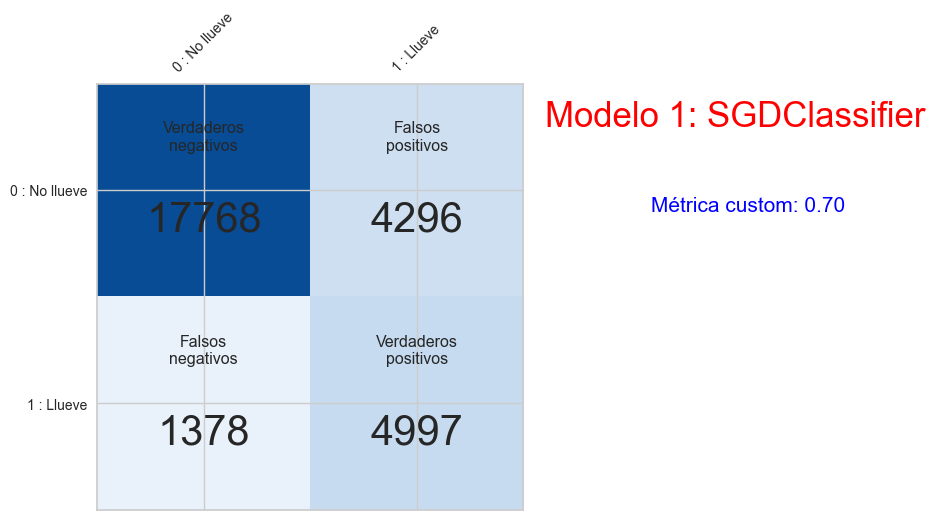

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Logistic Regression,0.8016,0.8778,0.7911,0.5391,0.6412,0.5108,0.5287



--- Modelo 2: LogisticRegression ---
Recall test: 0.7911
F1 Score test: 0.6412

Classification Report test:

              precision    recall  f1-score   support

          No       0.93      0.80      0.86     22064
         Yes       0.54      0.79      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.73      0.80      0.75     28439
weighted avg       0.84      0.80      0.81     28439

Confusion Matrix:
[[17753  4311]
 [ 1332  5043]]


<Figure size 400x400 with 0 Axes>

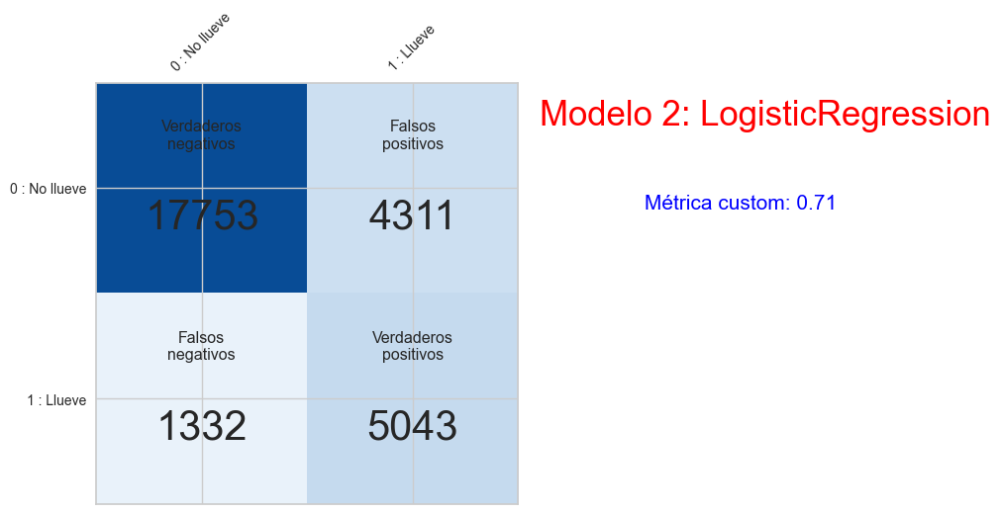

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.8041,0.7957,0.7805,0.5439,0.6411,0.5122,0.5280



--- Modelo 3: RidgeClassifier ---
Recall test: 0.7805
F1 Score test: 0.6411

Classification Report test:

              precision    recall  f1-score   support

          No       0.93      0.81      0.87     22064
         Yes       0.54      0.78      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.74      0.80      0.75     28439
weighted avg       0.84      0.80      0.82     28439

Confusion Matrix:
[[17891  4173]
 [ 1399  4976]]


<Figure size 400x400 with 0 Axes>

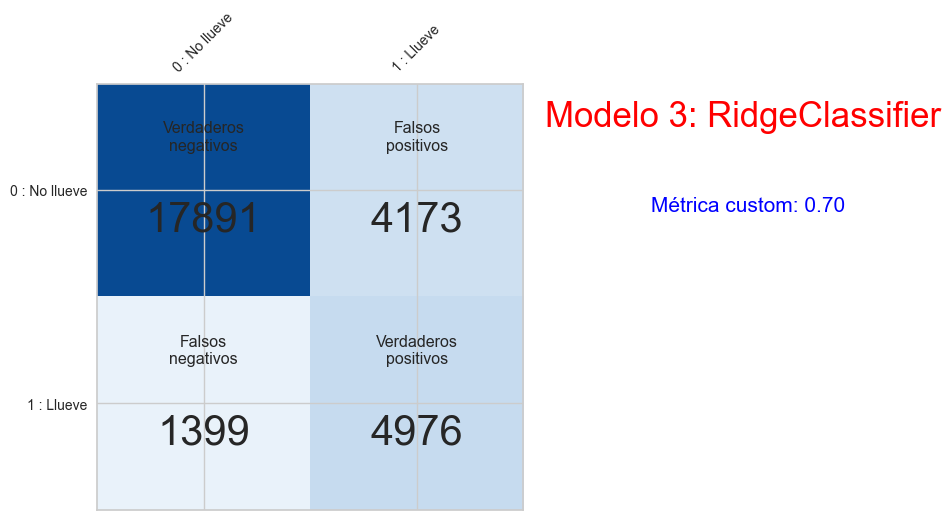

In [ ]:
for idx, model in enumerate(best_model_2):
    # Predicción sobre test
    preds = exp.predict_model(model, data=df_test)

    # Si el target es 'Yes'/'No', lo pasamos a 1/0
    y_true_aml = preds['RainTomorrow']
    y_pred_aml = preds['prediction_label']
    if y_true_aml.dtype == 'O':
        y_true_aml = (y_true == 'Yes').astype(int)
    if y_pred_aml.dtype == 'O':
        y_pred_aml = (y_pred_aml == 'Yes').astype(int)

    # Métricas
    print(f"\n--- Modelo {idx+1}: {type(model).__name__} ---")
    print("Recall test:", round(recall_score(y_true_aml, y_pred_aml, pos_label=1), 4))
    print("F1 Score test:", round(f1_score(y_true_aml, y_pred_aml, pos_label=1), 4))
    print("\nClassification Report test:\n")
    print(classification_report(y_true_aml, y_pred_aml, target_names=['No', 'Yes']))
    print("Confusion Matrix:")
    print(confusion_matrix(y_true_aml, y_pred_aml))

    # Matriz de confusión con métrica custom visualizada
    matriz_de_confusion(y_true_aml, y_pred_aml, titulo=f"Modelo {idx+1}: {type(model).__name__}")

Observamos que los modelos obtienen buenas métricas, siendo 0.71 nuestra métrica para el mejor de ellos (Regresión Logistica). Sin embargo no alcanza el rendimiento del modelo obtenido con optimización de hiperparámetros (0.75). Las métricas obtenidas, y el tiempo y trabajo ahorrado por el modelo de Auto ML lo hacen una opción efectiva para utilizar en contextos que lo ameriten.

In [ ]:
# Guardar el modelo entrenado
primer_modelo = best_model_2[0]

exp.save_model(primer_modelo, 'best_RainPrediction_model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('balance',
                  TransformerWrapper(exclude=None, include=None,
                                     transformer=FixImbalancer(estimator=SMOTE(k_neighbors=5,
                                                                               random_state=None,
                                                                               sampling_strategy='auto')))),
                 ('trained_model',
                  SGDClassifier(alpha=0.0001, average=False, class_weight=None,
                                early_stopping=False, epsilon=0.1, eta0=0.001,
                                fit_intercept=True, l1_ratio=0.15,
                                learning_rate='optimal', loss='hinge',
                                max_iter=1000, n_iter_no_change=5, n_jobs=-1,
                                penalty='l2', power_t=0.5, random_state=42,
                                shuffle=True, tol=0.001, validation_fraction=0.

# Redes Neuronales


## Modelado

Creamos una clase para definir, entrenar y evaluar una red neuronal.
Permite personalizar el número de capas, unidades, tasas de dropout y funciones de activación.
También incluye funciones para entrenamiento, evaluación, predicción y gráficos.

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

class NeuralNetwork:
    def __init__(self, epochs, batch_size, learning_rate,
                 num_layers=2, units=None, dropout_rates=None, activations=None):
        self.epochs = epochs
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.num_layers = num_layers
        self.units = units if units is not None else [64] * num_layers
        self.dropout_rates = dropout_rates if dropout_rates is not None else [0.0] * num_layers
        self.activations = activations if activations is not None else ['relu'] * num_layers
        self.model = None

    def build_model(self, input_shape):
        model = tf.keras.models.Sequential()
        model.add(tf.keras.layers.InputLayer(input_shape=(input_shape,)))

        for i in range(self.num_layers):
            model.add(tf.keras.layers.Dense(self.units[i], activation=self.activations[i]))
            if self.dropout_rates[i] > 0:
                model.add(tf.keras.layers.Dropout(self.dropout_rates[i]))

        model.add(tf.keras.layers.Dense(1, activation='sigmoid'))

        optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
        model.compile(optimizer=optimizer,
                      loss='binary_crossentropy',
                      metrics=[
                          tf.keras.metrics.Recall(name='recall'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.AUC(name='auc')
                      ])
        print("\nModelo construido satisfactoriamente")
        self.model = model
        self.model.summary()

    def train(self, X_train, y_train, X_valid, y_valid):
        history = self.model.fit(X_train, y_train,
                                 validation_data=(X_valid, y_valid),
                                 epochs=self.epochs,
                                 batch_size=self.batch_size)
        return history.history['loss'], history.history['val_loss']

    def evaluate(self, X_test, y_test):
        print("\nEvaluamos métricas en Test:")
        metrics = self.model.evaluate(X_test, y_test, verbose=0)
        loss = metrics[0]
        recall = metrics[1]
        precision = metrics[2]
        auc = metrics[3]

        print(f"Test Loss: {loss:.4f}")
        print(f"Test Recall: {recall:.4f}")
        print(f"Test Precision: {precision:.4f}")
        print(f"Test AUC: {auc:.4f}")

        y_pred_prob = self.model.predict(X_test)
        y_pred = (y_pred_prob > 0.5).astype(int)

        print("\nClassification Report:")
        print(classification_report(y_test, y_pred))

        print("\nMatriz de Confusión:")
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
        disp.plot(cmap='Blues')
        plt.show()

    def predict_proba(self, X):
        return self.model.predict(X)

    def predict(self, X, threshold=0.5):
        y_pred_prob = self.model.predict(X)
        return (y_pred_prob > threshold).astype(int)

    def plot_training(self, history):
        loss, val_loss = history
        plt.figure(figsize=(10, 5))
        plt.plot(loss, label='Train Loss')
        plt.plot(val_loss, label='Validation Loss')
        plt.title('Evolución de la función de pérdida')
        plt.xlabel('Épocas')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)
        plt.show()

Generamos el conjutno de validación.

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [ ]:
print(type(X_train))
print(type(y_train))



<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


Balanceo los datos utilizando SMOTE.

In [ ]:
# Crear el objeto SMOTE
smote = SMOTE(random_state=42)

# Aplicar solo sobre X_train, y_train
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)


In [ ]:
print(y_train_bal.value_counts())


RainTomorrow
0    70539
1    70539
Name: count, dtype: int64


In [ ]:
nn = NeuralNetwork(epochs=200, batch_size=512, learning_rate=0.001)

#buildeo el modelo
nn.build_model(input_shape=X_train_bal.shape[1])



Modelo construido satisfactoriamente
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                1856      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# entreno el modelo
history=nn.train(X_train_bal, y_train_bal, X_valid, y_valid)

Epoch 1/200

276/276 [==============================] - 2s 2ms/step - loss: 0.4689 - recall: 0.7544 - precision: 0.7824 - auc: 0.8574 - val_loss: 0.4186 - val_recall: 0.7902 - val_precision: 0.5316 - val_auc: 0.8813
Epoch 2/200
276/276 [==============================] - 0s 1ms/step - loss: 0.4201 - recall: 0.8080 - precision: 0.8016 - auc: 0.8883 - val_loss: 0.4056 - val_recall: 0.7838 - val_precision: 0.5464 - val_auc: 0.8854
Epoch 3/200
276/276 [==============================] - 0s 1ms/step - loss: 0.4083 - recall: 0.8147 - precision: 0.8080 - auc: 0.8949 - val_loss: 0.4101 - val_recall: 0.7876 - val_precision: 0.5468 - val_auc: 0.8866
Epoch 4/200
276/276 [==============================] - 0s 1ms/step - loss: 0.4014 - recall: 0.8193 - precision: 0.8117 - auc: 0.8987 - val_loss: 0.4058 - val_recall: 0.7906 - val_precision: 0.5501 - val_auc: 0.8879
Epoch 5/200
276/276 [==============================] - 0s 1ms/step - loss: 0.3964 - recall: 0.8231 - precision: 0.8147 - auc: 0.9013 - val_

Observamos las métricas y la matriz de correlación del modelo resultante.


Evaluamos metricas en Test:
Test Loss: 0.4342
Test Accuracy: 0.7628
Test Recall: 0.5503
Test Precision: 0.8772
889/889 [==============================] - 1s 651us/step

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.82      0.87     22064
           1       0.55      0.76      0.64      6375

    accuracy                           0.81     28439
   macro avg       0.74      0.79      0.75     28439
weighted avg       0.84      0.81      0.82     28439


Matriz de Confusion:


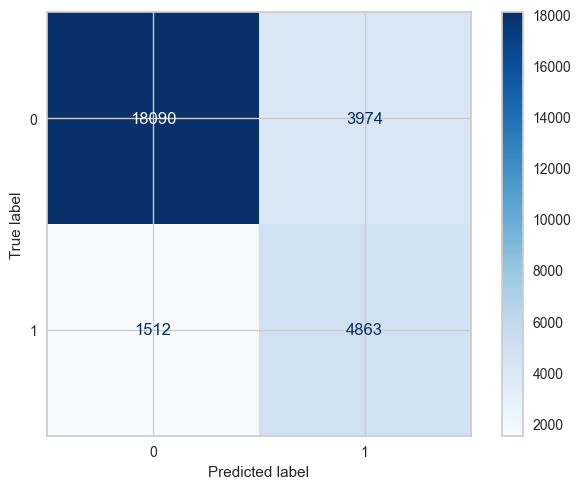

889/889 [==============================] - 1s 682us/step
Métrica custom (2*recall + precision)/3: 0.6920


In [ ]:
# evaluo metricas
nn.evaluate(X_test, y_test)

#Obtenemos las predicciones de la red
y_pred = nn.predict(X_test)

# Calculamos nuestra métrica
custom = custom_metric(y_test, y_pred)
print(f"Métrica custom (2*recall + precision)/3: {custom:.4f}")


Observamos que nuestra métrica para el modelo de redes neuronales es de 0.68.

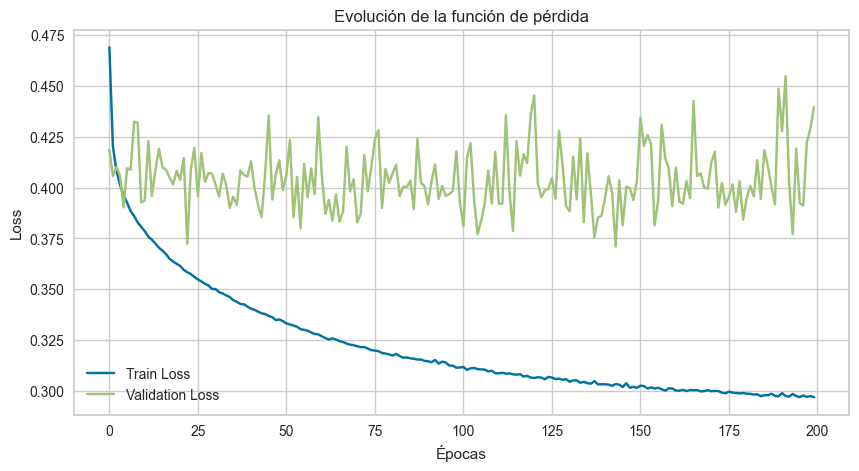

In [ ]:
#Evolucion de la funcion de perdida segun epocas
nn.plot_training(history)

Podemos observar como el modelo aprende bien de los datos de entrenamiento, a partir de la disminución del error, pero también vemos que no logra generalizar mejor en el validation set con el paso de las épocas. El error de validación no se dispara, pero aumenta levemente y no disminuye a medida que disminuye el de train, indicando un sobreajuste que no es severo. A partir de las 20 épocas podemos ver como el error de validación tiene una leve tendencia a aumentar mientras que el error de train sigue disminuyendo.

## Optimizacion de hiperparametros


 Procedemos a optimizar hiperparámetros. Para ello creamos la función objetivo para Optuna, que busca optimizar la arquitectura y los hiperparámetros
 de la red neuronal. Hiperparámetros a optimizar:
 - Cantidad de capas ocultas (1 a 3)
 - Cantidad de unidades por capa
 - Tasas de dropout
 - Funciones de activación por capa
 - Learning rate y batch size

 La métrica de evaluación personalizada es `custom_metric` sobre el conjunto de validación. La cantidad de épocas la establecimos en 13. El valor fue obtenido como resultado de la optimización de la cantidad de épocas como hiperparámetro, siendo coherente con el observado en la gráfica de la función pérdida del primer modelo realizado con una red neuronal. La misma no se incluye en la función para disminuir el tiempo de ejecución.

In [ ]:
def objective2(trial):
    # Cantidad de capas
    num_layers = trial.suggest_int('num_layers', 1, 3)

    # Listas para almacenar hiperparámetros por capa
    units = []
    dropout_rates = []
    activations = []

    for i in range(num_layers):
        units.append(trial.suggest_int(f'units_{i}', 8, 128))
        dropout_rates.append(trial.suggest_float(f'dropout_{i}', 0.0, 0.5))
        activations.append(trial.suggest_categorical(f'activation_{i}', ['relu', 'tanh', 'elu']))

    # Otros hiperparámetros globales
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1e-2, log=True)
    batch_size = trial.suggest_categorical('batch_size', [32, 64, 128])
    epochs = 13  # Valor fijo

    # Instanciá la red
    nn = NeuralNetwork(
        epochs=epochs, batch_size=batch_size, learning_rate=learning_rate,
        num_layers=num_layers, units=units, dropout_rates=dropout_rates, activations=activations
    )
    nn.build_model(input_shape=X_train_bal.shape[1])
    nn.train(X_train_bal, y_train_bal, X_valid, y_valid)
    y_pred = nn.predict(X_valid).flatten()
    score = custom_metric(y_valid, y_pred)
    return score


In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective2, n_trials=50)

best_params = study.best_params
print("Mejores hiperparámetros encontrados:", best_params)



[I 2025-06-29 17:25:42,626] A new study created in memory with name: no-name-941677c6-e0c5-4c43-b399-7e43fd3faf8d



Modelo construido satisfactoriamente
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 64)                1856      
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 2s 1ms/step - loss: 0.4554 - recall: 0.7834 - precision: 0.7873 - auc: 0.8672 - val_loss: 0.4250 - val_recall: 0.7977 - val_precision: 0.5322 - val_auc: 0.8823
Epoch 2/13
1103/1103 [========

[I 2025-06-29 17:26:00,058] Trial 0 finished with value: 0.7050249067937765 and parameters: {'num_layers': 1, 'units_0': 13, 'dropout_0': 0.3664959060421146, 'activation_0': 'elu', 'learning_rate': 0.00032452821393521956, 'batch_size': 128}. Best is trial 0 with value: 0.7050249067937765.



Modelo construido satisfactoriamente
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 64)                1856      
                                                                 
 dense_7 (Dense)             (None, 32)                2080      
                                                                 
 dense_8 (Dense)             (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 5s 1ms/step - loss: 0.4185 - recall: 0.8102 - precision: 0.8030 - auc: 0.8891 - val_loss: 0.3771 - val_recall: 0.7574 - val_precision: 0.5772 - val_auc: 0.8879
Epoch 2/13
4409/4409 [========

[I 2025-06-29 17:27:00,730] Trial 1 finished with value: 0.6916069418553655 and parameters: {'num_layers': 3, 'units_0': 48, 'dropout_0': 0.29565911324311095, 'activation_0': 'relu', 'units_1': 78, 'dropout_1': 0.09967635364795957, 'activation_1': 'tanh', 'units_2': 59, 'dropout_2': 0.3391725431217564, 'activation_2': 'relu', 'learning_rate': 0.0020874373659473594, 'batch_size': 32}. Best is trial 0 with value: 0.7050249067937765.



Modelo construido satisfactoriamente
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 64)                1856      
                                                                 
 dense_10 (Dense)            (None, 32)                2080      
                                                                 
 dense_11 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 5s 1ms/step - loss: 0.4214 - recall: 0.8084 - precision: 0.8030 - auc: 0.8877 - val_loss: 0.4187 - val_recall: 0.8096 - val_precision: 0.5263 - val_auc: 0.8881
Epoch 2/13
4409/4409 [========

[I 2025-06-29 17:28:02,618] Trial 2 finished with value: 0.7082447495696601 and parameters: {'num_layers': 3, 'units_0': 97, 'dropout_0': 0.4817068227228969, 'activation_0': 'tanh', 'units_1': 113, 'dropout_1': 0.03040145430845559, 'activation_1': 'relu', 'units_2': 118, 'dropout_2': 0.2328456600917863, 'activation_2': 'relu', 'learning_rate': 0.007985423853276833, 'batch_size': 32}. Best is trial 2 with value: 0.7082447495696601.



Modelo construido satisfactoriamente
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 64)                1856      
                                                                 
 dense_13 (Dense)            (None, 32)                2080      
                                                                 
 dense_14 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4383 - recall: 0.7967 - precision: 0.7919 - auc: 0.8776 - val_loss: 0.4379 - val_recall: 0.8110 - val_precision: 0.5183 - val_auc: 0.8847
Epoch 2/13
2205/2205 [========

[I 2025-06-29 17:28:42,610] Trial 3 finished with value: 0.7150271070479421 and parameters: {'num_layers': 1, 'units_0': 103, 'dropout_0': 0.1924279230079911, 'activation_0': 'relu', 'learning_rate': 0.00041186247519771254, 'batch_size': 64}. Best is trial 3 with value: 0.7150271070479421.



Modelo construido satisfactoriamente
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_15 (Dense)            (None, 64)                1856      
                                                                 
 dense_16 (Dense)            (None, 32)                2080      
                                                                 
 dense_17 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4269 - recall: 0.8005 - precision: 0.7985 - auc: 0.8843 - val_loss: 0.4059 - val_recall: 0.7878 - val_precision: 0.5476 - val_auc: 0.8881
Epoch 2/13
2205/2205 [========

[I 2025-06-29 17:30:11,334] Trial 4 finished with value: 0.7160793506495816 and parameters: {'num_layers': 1, 'units_0': 48, 'dropout_0': 0.3093433709479386, 'activation_0': 'relu', 'learning_rate': 0.0009695279051409218, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_18 (Dense)            (None, 64)                1856      
                                                                 
 dense_19 (Dense)            (None, 32)                2080      
                                                                 
 dense_20 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 9s 3ms/step - loss: 0.4235 - recall: 0.8040 - precision: 0.7996 - auc: 0.8862 - val_loss: 0.4327 - val_recall: 0.8182 - val_precision: 0.5273 - val_auc: 0.8902
Epoch 2/13
2205/2205 [========

[I 2025-06-29 17:31:51,315] Trial 5 finished with value: 0.7098729235743436 and parameters: {'num_layers': 1, 'units_0': 116, 'dropout_0': 0.01817603564155984, 'activation_0': 'elu', 'learning_rate': 0.0013438015778545558, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 64)                1856      
                                                                 
 dense_22 (Dense)            (None, 32)                2080      
                                                                 
 dense_23 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 11s 4ms/step - loss: 0.4195 - recall: 0.8107 - precision: 0.8019 - auc: 0.8885 - val_loss: 0.3995 - val_recall: 0.7842 - val_precision: 0.5511 - val_auc: 0.8891
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:33:10,107] Trial 6 finished with value: 0.7092139065138844 and parameters: {'num_layers': 1, 'units_0': 128, 'dropout_0': 0.4128489768290807, 'activation_0': 'elu', 'learning_rate': 0.002770075596524633, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 64)                1856      
                                                                 
 dense_25 (Dense)            (None, 32)                2080      
                                                                 
 dense_26 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 2s 1ms/step - loss: 0.4185 - recall: 0.8113 - precision: 0.8022 - auc: 0.8890 - val_loss: 0.4310 - val_recall: 0.8227 - val_precision: 0.5186 - val_auc: 0.8885
Epoch 2/13
1103/1103 [========

[I 2025-06-29 17:33:28,157] Trial 7 finished with value: 0.7023719246599884 and parameters: {'num_layers': 2, 'units_0': 36, 'dropout_0': 0.2491237880969348, 'activation_0': 'relu', 'units_1': 91, 'dropout_1': 0.11370401710443262, 'activation_1': 'tanh', 'learning_rate': 0.005725985808255934, 'batch_size': 128}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 64)                1856      
                                                                 
 dense_28 (Dense)            (None, 32)                2080      
                                                                 
 dense_29 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 2s 1ms/step - loss: 0.4376 - recall: 0.7973 - precision: 0.7901 - auc: 0.8777 - val_loss: 0.4263 - val_recall: 0.7997 - val_precision: 0.5267 - val_auc: 0.8853
Epoch 2/13
1103/1103 [========

[I 2025-06-29 17:33:45,737] Trial 8 finished with value: 0.6983529197015215 and parameters: {'num_layers': 3, 'units_0': 63, 'dropout_0': 0.17425168155512283, 'activation_0': 'relu', 'units_1': 101, 'dropout_1': 0.3088033904085689, 'activation_1': 'elu', 'units_2': 66, 'dropout_2': 0.4606063605430765, 'activation_2': 'relu', 'learning_rate': 0.0006849488310505598, 'batch_size': 128}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_30 (Dense)            (None, 64)                1856      
                                                                 
 dense_31 (Dense)            (None, 32)                2080      
                                                                 
 dense_32 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4248 - recall: 0.8048 - precision: 0.8011 - auc: 0.8856 - val_loss: 0.3972 - val_recall: 0.7773 - val_precision: 0.5630 - val_auc: 0.8878
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:34:18,020] Trial 9 finished with value: 0.7069002602029708 and parameters: {'num_layers': 3, 'units_0': 13, 'dropout_0': 0.3900186659120884, 'activation_0': 'elu', 'units_1': 66, 'dropout_1': 0.34099755661628933, 'activation_1': 'elu', 'units_2': 26, 'dropout_2': 0.27387073032274784, 'activation_2': 'tanh', 'learning_rate': 0.0009731485976437567, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_33 (Dense)            (None, 64)                1856      
                                                                 
 dense_34 (Dense)            (None, 32)                2080      
                                                                 
 dense_35 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4677 - recall: 0.7743 - precision: 0.7767 - auc: 0.8588 - val_loss: 0.4288 - val_recall: 0.7963 - val_precision: 0.5262 - val_auc: 0.8794
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:34:49,877] Trial 10 finished with value: 0.7104581452150099 and parameters: {'num_layers': 2, 'units_0': 78, 'dropout_0': 0.05771863956968609, 'activation_0': 'tanh', 'units_1': 9, 'dropout_1': 0.49352670475681687, 'activation_1': 'relu', 'learning_rate': 0.00012468613410869186, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_36 (Dense)            (None, 64)                1856      
                                                                 
 dense_37 (Dense)            (None, 32)                2080      
                                                                 
 dense_38 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4505 - recall: 0.7943 - precision: 0.7804 - auc: 0.8699 - val_loss: 0.4411 - val_recall: 0.8142 - val_precision: 0.5185 - val_auc: 0.8844
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:35:22,196] Trial 11 finished with value: 0.6948120838896966 and parameters: {'num_layers': 1, 'units_0': 94, 'dropout_0': 0.1666503508030936, 'activation_0': 'relu', 'learning_rate': 0.000294069367459787, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_39 (Dense)            (None, 64)                1856      
                                                                 
 dense_40 (Dense)            (None, 32)                2080      
                                                                 
 dense_41 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4371 - recall: 0.8000 - precision: 0.7918 - auc: 0.8783 - val_loss: 0.4350 - val_recall: 0.8144 - val_precision: 0.5208 - val_auc: 0.8866
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:35:54,751] Trial 12 finished with value: 0.7086620914278322 and parameters: {'num_layers': 2, 'units_0': 45, 'dropout_0': 0.1998266456278813, 'activation_0': 'relu', 'units_1': 29, 'dropout_1': 0.48993947439464813, 'activation_1': 'tanh', 'learning_rate': 0.0004474367520128876, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_42 (Dense)            (None, 64)                1856      
                                                                 
 dense_43 (Dense)            (None, 32)                2080      
                                                                 
 dense_44 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4586 - recall: 0.7833 - precision: 0.7809 - auc: 0.8650 - val_loss: 0.4309 - val_recall: 0.7958 - val_precision: 0.5306 - val_auc: 0.8800
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:36:27,078] Trial 13 finished with value: 0.7091481602183872 and parameters: {'num_layers': 1, 'units_0': 75, 'dropout_0': 0.1037535847986012, 'activation_0': 'relu', 'learning_rate': 0.00014089950766968054, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_45 (Dense)            (None, 64)                1856      
                                                                 
 dense_46 (Dense)            (None, 32)                2080      
                                                                 
 dense_47 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
2205/2205 [==============================] - 3s 1ms/step - loss: 0.4322 - recall: 0.7988 - precision: 0.7958 - auc: 0.8811 - val_loss: 0.4357 - val_recall: 0.8136 - val_precision: 0.5235 - val_auc: 0.8866
Epoch 2/13
2205/2205 [=======

[I 2025-06-29 17:36:59,664] Trial 14 finished with value: 0.7092280486484536 and parameters: {'num_layers': 1, 'units_0': 102, 'dropout_0': 0.30138241717364717, 'activation_0': 'relu', 'learning_rate': 0.0005821306526749539, 'batch_size': 64}. Best is trial 4 with value: 0.7160793506495816.



Modelo construido satisfactoriamente
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_48 (Dense)            (None, 64)                1856      
                                                                 
 dense_49 (Dense)            (None, 32)                2080      
                                                                 
 dense_50 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 8s 2ms/step - loss: 0.4419 - recall: 0.7901 - precision: 0.7909 - auc: 0.8753 - val_loss: 0.4261 - val_recall: 0.8025 - val_precision: 0.5290 - val_auc: 0.8835
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:38:10,979] Trial 15 finished with value: 0.7195120802579823 and parameters: {'num_layers': 2, 'units_0': 62, 'dropout_0': 0.2712066790546334, 'activation_0': 'relu', 'units_1': 49, 'dropout_1': 0.20988413054759544, 'activation_1': 'relu', 'learning_rate': 0.0002318653058411367, 'batch_size': 32}. Best is trial 15 with value: 0.7195120802579823.



Modelo construido satisfactoriamente
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_51 (Dense)            (None, 64)                1856      
                                                                 
 dense_52 (Dense)            (None, 32)                2080      
                                                                 
 dense_53 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 7s 1ms/step - loss: 0.4477 - recall: 0.7859 - precision: 0.7889 - auc: 0.8716 - val_loss: 0.4195 - val_recall: 0.7882 - val_precision: 0.5319 - val_auc: 0.8824
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:39:18,933] Trial 16 finished with value: 0.7042022882696383 and parameters: {'num_layers': 2, 'units_0': 30, 'dropout_0': 0.3219102362899983, 'activation_0': 'tanh', 'units_1': 49, 'dropout_1': 0.21241034982985382, 'activation_1': 'relu', 'learning_rate': 0.00023818532135737224, 'batch_size': 32}. Best is trial 15 with value: 0.7195120802579823.



Modelo construido satisfactoriamente
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_54 (Dense)            (None, 64)                1856      
                                                                 
 dense_55 (Dense)            (None, 32)                2080      
                                                                 
 dense_56 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 6s 1ms/step - loss: 0.4195 - recall: 0.8090 - precision: 0.8035 - auc: 0.8887 - val_loss: 0.4162 - val_recall: 0.8114 - val_precision: 0.5269 - val_auc: 0.8883
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:40:25,767] Trial 17 finished with value: 0.7025338901979632 and parameters: {'num_layers': 2, 'units_0': 57, 'dropout_0': 0.2505558160624943, 'activation_0': 'relu', 'units_1': 46, 'dropout_1': 0.21795868503628554, 'activation_1': 'relu', 'learning_rate': 0.003460568115797847, 'batch_size': 32}. Best is trial 15 with value: 0.7195120802579823.



Modelo construido satisfactoriamente
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_57 (Dense)            (None, 64)                1856      
                                                                 
 dense_58 (Dense)            (None, 32)                2080      
                                                                 
 dense_59 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 6s 1ms/step - loss: 0.4495 - recall: 0.7776 - precision: 0.7900 - auc: 0.8703 - val_loss: 0.4215 - val_recall: 0.7936 - val_precision: 0.5334 - val_auc: 0.8832
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:41:36,472] Trial 18 finished with value: 0.7200298867669305 and parameters: {'num_layers': 2, 'units_0': 82, 'dropout_0': 0.4516636508243588, 'activation_0': 'relu', 'units_1': 127, 'dropout_1': 0.3354526880741265, 'activation_1': 'relu', 'learning_rate': 0.00018036853417505752, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_60 (Dense)            (None, 64)                1856      
                                                                 
 dense_61 (Dense)            (None, 32)                2080      
                                                                 
 dense_62 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 6s 1ms/step - loss: 0.4477 - recall: 0.7875 - precision: 0.7877 - auc: 0.8717 - val_loss: 0.4467 - val_recall: 0.8237 - val_precision: 0.5085 - val_auc: 0.8835
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:42:42,577] Trial 19 finished with value: 0.7173758551474657 and parameters: {'num_layers': 2, 'units_0': 84, 'dropout_0': 0.48733311672509355, 'activation_0': 'tanh', 'units_1': 127, 'dropout_1': 0.3625866934190214, 'activation_1': 'relu', 'learning_rate': 0.00017102318445537428, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_63 (Dense)            (None, 64)                1856      
                                                                 
 dense_64 (Dense)            (None, 32)                2080      
                                                                 
 dense_65 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 6s 1ms/step - loss: 0.4600 - recall: 0.7872 - precision: 0.7803 - auc: 0.8643 - val_loss: 0.4429 - val_recall: 0.8025 - val_precision: 0.5115 - val_auc: 0.8784
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:45:08,548] Trial 20 finished with value: 0.7063549465533517 and parameters: {'num_layers': 2, 'units_0': 67, 'dropout_0': 0.4220995536171724, 'activation_0': 'relu', 'units_1': 64, 'dropout_1': 0.2715341894853129, 'activation_1': 'relu', 'learning_rate': 0.00010157388490892513, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_66 (Dense)            (None, 64)                1856      
                                                                 
 dense_67 (Dense)            (None, 32)                2080      
                                                                 
 dense_68 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 16s 3ms/step - loss: 0.4466 - recall: 0.7974 - precision: 0.7853 - auc: 0.8726 - val_loss: 0.4388 - val_recall: 0.8051 - val_precision: 0.5181 - val_auc: 0.8835
Epoch 2/13
4409/4409 [======

[I 2025-06-29 17:48:20,586] Trial 21 finished with value: 0.7155123667538219 and parameters: {'num_layers': 2, 'units_0': 82, 'dropout_0': 0.49156891992607815, 'activation_0': 'tanh', 'units_1': 126, 'dropout_1': 0.3892679276692034, 'activation_1': 'relu', 'learning_rate': 0.0002008715579656221, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_69 (Dense)            (None, 64)                1856      
                                                                 
 dense_70 (Dense)            (None, 32)                2080      
                                                                 
 dense_71 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 17s 3ms/step - loss: 0.4438 - recall: 0.7902 - precision: 0.7922 - auc: 0.8742 - val_loss: 0.4278 - val_recall: 0.7870 - val_precision: 0.5306 - val_auc: 0.8821
Epoch 2/13
4409/4409 [======

[I 2025-06-29 17:51:27,045] Trial 22 finished with value: 0.7126418918138402 and parameters: {'num_layers': 2, 'units_0': 87, 'dropout_0': 0.45098864426360624, 'activation_0': 'tanh', 'units_1': 126, 'dropout_1': 0.39719501205907826, 'activation_1': 'relu', 'learning_rate': 0.0001752402780550806, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_72 (Dense)            (None, 64)                1856      
                                                                 
 dense_73 (Dense)            (None, 32)                2080      
                                                                 
 dense_74 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 17s 3ms/step - loss: 0.4498 - recall: 0.7925 - precision: 0.7840 - auc: 0.8705 - val_loss: 0.4191 - val_recall: 0.7858 - val_precision: 0.5421 - val_auc: 0.8826
Epoch 2/13
4409/4409 [======

[I 2025-06-29 17:52:50,866] Trial 23 finished with value: 0.7142191017486095 and parameters: {'num_layers': 2, 'units_0': 71, 'dropout_0': 0.36099623507072137, 'activation_0': 'tanh', 'units_1': 106, 'dropout_1': 0.39828799815337046, 'activation_1': 'relu', 'learning_rate': 0.00018443683693164848, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_75 (Dense)            (None, 64)                1856      
                                                                 
 dense_76 (Dense)            (None, 32)                2080      
                                                                 
 dense_77 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 6s 1ms/step - loss: 0.4568 - recall: 0.7955 - precision: 0.7744 - auc: 0.8660 - val_loss: 0.4310 - val_recall: 0.7926 - val_precision: 0.5253 - val_auc: 0.8793
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:53:51,980] Trial 24 finished with value: 0.7122120751685573 and parameters: {'num_layers': 2, 'units_0': 88, 'dropout_0': 0.4423889898298327, 'activation_0': 'tanh', 'units_1': 83, 'dropout_1': 0.17668642056037503, 'activation_1': 'relu', 'learning_rate': 0.00010265732666773903, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_78 (Dense)            (None, 64)                1856      
                                                                 
 dense_79 (Dense)            (None, 32)                2080      
                                                                 
 dense_80 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 5s 1ms/step - loss: 0.4372 - recall: 0.7997 - precision: 0.7916 - auc: 0.8781 - val_loss: 0.4337 - val_recall: 0.8120 - val_precision: 0.5205 - val_auc: 0.8856
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:54:53,205] Trial 25 finished with value: 0.7198619841359127 and parameters: {'num_layers': 2, 'units_0': 59, 'dropout_0': 0.4965675554410636, 'activation_0': 'tanh', 'units_1': 45, 'dropout_1': 0.30206229222472225, 'activation_1': 'relu', 'learning_rate': 0.00026940377546954907, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_81 (Dense)            (None, 64)                1856      
                                                                 
 dense_82 (Dense)            (None, 32)                2080      
                                                                 
 dense_83 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 6s 1ms/step - loss: 0.4375 - recall: 0.7963 - precision: 0.7941 - auc: 0.8781 - val_loss: 0.4017 - val_recall: 0.7825 - val_precision: 0.5518 - val_auc: 0.8856
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:55:54,935] Trial 26 finished with value: 0.7125491127246014 and parameters: {'num_layers': 3, 'units_0': 58, 'dropout_0': 0.4486667324223657, 'activation_0': 'relu', 'units_1': 45, 'dropout_1': 0.2803176312013264, 'activation_1': 'elu', 'units_2': 122, 'dropout_2': 0.01829205706535919, 'activation_2': 'elu', 'learning_rate': 0.0002613376421312347, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_84 (Dense)            (None, 64)                1856      
                                                                 
 dense_85 (Dense)            (None, 32)                2080      
                                                                 
 dense_86 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 5s 1ms/step - loss: 0.4347 - recall: 0.7937 - precision: 0.7951 - auc: 0.8796 - val_loss: 0.4065 - val_recall: 0.7856 - val_precision: 0.5480 - val_auc: 0.8865
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:57:04,159] Trial 27 finished with value: 0.7128404070392483 and parameters: {'num_layers': 2, 'units_0': 39, 'dropout_0': 0.3753104594591174, 'activation_0': 'relu', 'units_1': 32, 'dropout_1': 0.14813861222595953, 'activation_1': 'relu', 'learning_rate': 0.00040204542365630884, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_87 (Dense)            (None, 64)                1856      
                                                                 
 dense_88 (Dense)            (None, 32)                2080      
                                                                 
 dense_89 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 7s 1ms/step - loss: 0.4269 - recall: 0.8035 - precision: 0.7987 - auc: 0.8843 - val_loss: 0.4233 - val_recall: 0.8031 - val_precision: 0.5329 - val_auc: 0.8874
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 17:58:10,042] Trial 28 finished with value: 0.7053869694500957 and parameters: {'num_layers': 3, 'units_0': 26, 'dropout_0': 0.12878027408386677, 'activation_0': 'elu', 'units_1': 56, 'dropout_1': 0.23664116362565063, 'activation_1': 'relu', 'units_2': 10, 'dropout_2': 0.016954569862861923, 'activation_2': 'tanh', 'learning_rate': 0.0006426175170138527, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_90 (Dense)            (None, 64)                1856      
                                                                 
 dense_91 (Dense)            (None, 32)                2080      
                                                                 
 dense_92 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 2s 1ms/step - loss: 0.4563 - recall: 0.7938 - precision: 0.7790 - auc: 0.8664 - val_loss: 0.4272 - val_recall: 0.7952 - val_precision: 0.5303 - val_auc: 0.8817
Epoch 2/13
1103/1103 [=======

[I 2025-06-29 17:59:35,064] Trial 29 finished with value: 0.7151176055225356 and parameters: {'num_layers': 2, 'units_0': 57, 'dropout_0': 0.2683918727097323, 'activation_0': 'tanh', 'units_1': 32, 'dropout_1': 0.31528632322339945, 'activation_1': 'relu', 'learning_rate': 0.00032632696359772244, 'batch_size': 128}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_93 (Dense)            (None, 64)                1856      
                                                                 
 dense_94 (Dense)            (None, 32)                2080      
                                                                 
 dense_95 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 6s 4ms/step - loss: 0.4588 - recall: 0.7869 - precision: 0.7777 - auc: 0.8646 - val_loss: 0.4458 - val_recall: 0.8120 - val_precision: 0.5101 - val_auc: 0.8817
Epoch 2/13
1103/1103 [=======

[I 2025-06-29 18:00:29,749] Trial 30 finished with value: 0.7102852714859815 and parameters: {'num_layers': 2, 'units_0': 65, 'dropout_0': 0.3338989476504589, 'activation_0': 'elu', 'units_1': 19, 'dropout_1': 0.26549106524113253, 'activation_1': 'tanh', 'learning_rate': 0.0003117587522887496, 'batch_size': 128}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_96 (Dense)            (None, 64)                1856      
                                                                 
 dense_97 (Dense)            (None, 32)                2080      
                                                                 
 dense_98 (Dense)            (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 16s 3ms/step - loss: 0.4483 - recall: 0.7860 - precision: 0.7888 - auc: 0.8714 - val_loss: 0.4151 - val_recall: 0.7829 - val_precision: 0.5423 - val_auc: 0.8837
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:04:03,095] Trial 31 finished with value: 0.7193215773469261 and parameters: {'num_layers': 2, 'units_0': 82, 'dropout_0': 0.4999927048900493, 'activation_0': 'tanh', 'units_1': 115, 'dropout_1': 0.35225788325813295, 'activation_1': 'relu', 'learning_rate': 0.00014851410574729545, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_99 (Dense)            (None, 64)                1856      
                                                                 
 dense_100 (Dense)           (None, 32)                2080      
                                                                 
 dense_101 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 19s 4ms/step - loss: 0.4576 - recall: 0.7836 - precision: 0.7791 - auc: 0.8654 - val_loss: 0.4250 - val_recall: 0.7900 - val_precision: 0.5346 - val_auc: 0.8807
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:07:10,285] Trial 32 finished with value: 0.7107341409527068 and parameters: {'num_layers': 2, 'units_0': 51, 'dropout_0': 0.49926062811955035, 'activation_0': 'tanh', 'units_1': 114, 'dropout_1': 0.42720162915814597, 'activation_1': 'relu', 'learning_rate': 0.0001436080771745435, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_102 (Dense)           (None, 64)                1856      
                                                                 
 dense_103 (Dense)           (None, 32)                2080      
                                                                 
 dense_104 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 11s 2ms/step - loss: 0.4461 - recall: 0.7930 - precision: 0.7875 - auc: 0.8727 - val_loss: 0.4286 - val_recall: 0.8015 - val_precision: 0.5252 - val_auc: 0.8836
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:10:05,422] Trial 33 finished with value: 0.7140100629616947 and parameters: {'num_layers': 2, 'units_0': 73, 'dropout_0': 0.4722550339906647, 'activation_0': 'tanh', 'units_1': 57, 'dropout_1': 0.3206398989084687, 'activation_1': 'relu', 'learning_rate': 0.00019909362645931635, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_105 (Dense)           (None, 64)                1856      
                                                                 
 dense_106 (Dense)           (None, 32)                2080      
                                                                 
 dense_107 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 18s 3ms/step - loss: 0.4422 - recall: 0.7929 - precision: 0.7901 - auc: 0.8753 - val_loss: 0.4233 - val_recall: 0.7997 - val_precision: 0.5302 - val_auc: 0.8849
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:13:12,594] Trial 34 finished with value: 0.7120314689294149 and parameters: {'num_layers': 3, 'units_0': 111, 'dropout_0': 0.4102466650875587, 'activation_0': 'tanh', 'units_1': 38, 'dropout_1': 0.3522647801600532, 'activation_1': 'relu', 'units_2': 84, 'dropout_2': 0.49002030774467303, 'activation_2': 'elu', 'learning_rate': 0.00023904258209864532, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_108 (Dense)           (None, 64)                1856      
                                                                 
 dense_109 (Dense)           (None, 32)                2080      
                                                                 
 dense_110 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 18s 4ms/step - loss: 0.4281 - recall: 0.8039 - precision: 0.7968 - auc: 0.8835 - val_loss: 0.4151 - val_recall: 0.7985 - val_precision: 0.5386 - val_auc: 0.8886
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:16:23,457] Trial 35 finished with value: 0.7076114250903546 and parameters: {'num_layers': 2, 'units_0': 93, 'dropout_0': 0.45981921058430847, 'activation_0': 'tanh', 'units_1': 76, 'dropout_1': 0.4285594043787061, 'activation_1': 'elu', 'learning_rate': 0.0004753394310390396, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_111 (Dense)           (None, 64)                1856      
                                                                 
 dense_112 (Dense)           (None, 32)                2080      
                                                                 
 dense_113 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 17s 4ms/step - loss: 0.4198 - recall: 0.8087 - precision: 0.8024 - auc: 0.8884 - val_loss: 0.4255 - val_recall: 0.8075 - val_precision: 0.5328 - val_auc: 0.8867
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:19:50,330] Trial 36 finished with value: 0.7016343147653075 and parameters: {'num_layers': 2, 'units_0': 80, 'dropout_0': 0.34607233685090666, 'activation_0': 'relu', 'units_1': 115, 'dropout_1': 0.2910827833793883, 'activation_1': 'relu', 'learning_rate': 0.001315912646610262, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_114 (Dense)           (None, 64)                1856      
                                                                 
 dense_115 (Dense)           (None, 32)                2080      
                                                                 
 dense_116 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 16s 3ms/step - loss: 0.4560 - recall: 0.7878 - precision: 0.7807 - auc: 0.8664 - val_loss: 0.4362 - val_recall: 0.7969 - val_precision: 0.5205 - val_auc: 0.8795
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:23:01,012] Trial 37 finished with value: 0.7123279740637819 and parameters: {'num_layers': 3, 'units_0': 63, 'dropout_0': 0.4258796521963973, 'activation_0': 'relu', 'units_1': 102, 'dropout_1': 0.19906480259878562, 'activation_1': 'relu', 'units_2': 92, 'dropout_2': 0.16096501600081972, 'activation_2': 'elu', 'learning_rate': 0.00013414511690389464, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_117 (Dense)           (None, 64)                1856      
                                                                 
 dense_118 (Dense)           (None, 32)                2080      
                                                                 
 dense_119 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 15s 3ms/step - loss: 0.4356 - recall: 0.7997 - precision: 0.7933 - auc: 0.8792 - val_loss: 0.4226 - val_recall: 0.8001 - val_precision: 0.5310 - val_auc: 0.8858
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:26:03,800] Trial 38 finished with value: 0.7070673435672594 and parameters: {'num_layers': 1, 'units_0': 52, 'dropout_0': 0.4696176792725648, 'activation_0': 'tanh', 'learning_rate': 0.0003359162698252694, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_120 (Dense)           (None, 64)                1856      
                                                                 
 dense_121 (Dense)           (None, 32)                2080      
                                                                 
 dense_122 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 16s 3ms/step - loss: 0.4208 - recall: 0.8058 - precision: 0.8034 - auc: 0.8879 - val_loss: 0.4386 - val_recall: 0.8241 - val_precision: 0.5199 - val_auc: 0.8908
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:29:13,137] Trial 39 finished with value: 0.7082059352719782 and parameters: {'num_layers': 2, 'units_0': 107, 'dropout_0': 0.39091232260854364, 'activation_0': 'elu', 'units_1': 75, 'dropout_1': 0.24766613409668453, 'activation_1': 'tanh', 'learning_rate': 0.0008097481803481655, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_123 (Dense)           (None, 64)                1856      
                                                                 
 dense_124 (Dense)           (None, 32)                2080      
                                                                 
 dense_125 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 7s 4ms/step - loss: 0.4704 - recall: 0.7928 - precision: 0.7628 - auc: 0.8571 - val_loss: 0.4300 - val_recall: 0.7969 - val_precision: 0.5264 - val_auc: 0.8804
Epoch 2/13
1103/1103 [=======

[I 2025-06-29 18:30:08,746] Trial 40 finished with value: 0.716424725161399 and parameters: {'num_layers': 2, 'units_0': 123, 'dropout_0': 0.21521230196332686, 'activation_0': 'relu', 'units_1': 90, 'dropout_1': 0.17804492909461406, 'activation_1': 'relu', 'learning_rate': 0.0002238822088758981, 'batch_size': 128}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_126 (Dense)           (None, 64)                1856      
                                                                 
 dense_127 (Dense)           (None, 32)                2080      
                                                                 
 dense_128 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 17s 3ms/step - loss: 0.4477 - recall: 0.7903 - precision: 0.7885 - auc: 0.8718 - val_loss: 0.4243 - val_recall: 0.7969 - val_precision: 0.5333 - val_auc: 0.8827
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:33:35,614] Trial 41 finished with value: 0.7194265475308236 and parameters: {'num_layers': 2, 'units_0': 89, 'dropout_0': 0.4991277050246676, 'activation_0': 'tanh', 'units_1': 128, 'dropout_1': 0.3564782015628346, 'activation_1': 'relu', 'learning_rate': 0.00015706947097415355, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_129 (Dense)           (None, 64)                1856      
                                                                 
 dense_130 (Dense)           (None, 32)                2080      
                                                                 
 dense_131 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 9s 2ms/step - loss: 0.4539 - recall: 0.7890 - precision: 0.7828 - auc: 0.8679 - val_loss: 0.4355 - val_recall: 0.7977 - val_precision: 0.5249 - val_auc: 0.8817
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 18:34:40,886] Trial 42 finished with value: 0.7105976555089235 and parameters: {'num_layers': 2, 'units_0': 101, 'dropout_0': 0.4949505196538972, 'activation_0': 'tanh', 'units_1': 123, 'dropout_1': 0.36234899050911734, 'activation_1': 'relu', 'learning_rate': 0.00012253784189363132, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_132 (Dense)           (None, 64)                1856      
                                                                 
 dense_133 (Dense)           (None, 32)                2080      
                                                                 
 dense_134 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 5s 1ms/step - loss: 0.4480 - recall: 0.7950 - precision: 0.7861 - auc: 0.8719 - val_loss: 0.4152 - val_recall: 0.7846 - val_precision: 0.5425 - val_auc: 0.8823
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 18:35:42,035] Trial 43 finished with value: 0.7061843897293071 and parameters: {'num_layers': 2, 'units_0': 93, 'dropout_0': 0.43905313178608285, 'activation_0': 'tanh', 'units_1': 119, 'dropout_1': 0.05680170620438174, 'activation_1': 'relu', 'learning_rate': 0.0001632823426396206, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_135 (Dense)           (None, 64)                1856      
                                                                 
 dense_136 (Dense)           (None, 32)                2080      
                                                                 
 dense_137 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 5s 1ms/step - loss: 0.4323 - recall: 0.7958 - precision: 0.7962 - auc: 0.8811 - val_loss: 0.4301 - val_recall: 0.8092 - val_precision: 0.5275 - val_auc: 0.8861
Epoch 2/13
4409/4409 [=======

[I 2025-06-29 18:37:27,541] Trial 44 finished with value: 0.7164660343742691 and parameters: {'num_layers': 2, 'units_0': 72, 'dropout_0': 0.4704379618714082, 'activation_0': 'tanh', 'units_1': 106, 'dropout_1': 0.327184672592052, 'activation_1': 'relu', 'learning_rate': 0.0003656522481203634, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_138 (Dense)           (None, 64)                1856      
                                                                 
 dense_139 (Dense)           (None, 32)                2080      
                                                                 
 dense_140 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 17s 3ms/step - loss: 0.4374 - recall: 0.7975 - precision: 0.7918 - auc: 0.8780 - val_loss: 0.4152 - val_recall: 0.7908 - val_precision: 0.5392 - val_auc: 0.8854
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:40:38,653] Trial 45 finished with value: 0.7057884936886932 and parameters: {'num_layers': 2, 'units_0': 84, 'dropout_0': 0.39590125759802774, 'activation_0': 'tanh', 'units_1': 118, 'dropout_1': 0.44551068236115043, 'activation_1': 'elu', 'learning_rate': 0.0002657823181424125, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_141 (Dense)           (None, 64)                1856      
                                                                 
 dense_142 (Dense)           (None, 32)                2080      
                                                                 
 dense_143 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
4409/4409 [==============================] - 16s 3ms/step - loss: 0.4589 - recall: 0.7927 - precision: 0.7759 - auc: 0.8648 - val_loss: 0.4255 - val_recall: 0.7888 - val_precision: 0.5280 - val_auc: 0.8792
Epoch 2/13
4409/4409 [======

[I 2025-06-29 18:43:37,907] Trial 46 finished with value: 0.7180728323773692 and parameters: {'num_layers': 2, 'units_0': 76, 'dropout_0': 0.4977962025544202, 'activation_0': 'relu', 'units_1': 93, 'dropout_1': 0.2961983255244199, 'activation_1': 'tanh', 'learning_rate': 0.00011422128036526043, 'batch_size': 32}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_144 (Dense)           (None, 64)                1856      
                                                                 
 dense_145 (Dense)           (None, 32)                2080      
                                                                 
 dense_146 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 6s 4ms/step - loss: 0.4410 - recall: 0.7937 - precision: 0.7931 - auc: 0.8761 - val_loss: 0.4215 - val_recall: 0.7946 - val_precision: 0.5332 - val_auc: 0.8850
Epoch 2/13
1103/1103 [=======

[I 2025-06-29 18:44:29,491] Trial 47 finished with value: 0.7199608392108243 and parameters: {'num_layers': 2, 'units_0': 97, 'dropout_0': 0.28177975061059424, 'activation_0': 'elu', 'units_1': 107, 'dropout_1': 0.36226382308266347, 'activation_1': 'relu', 'learning_rate': 0.0005205291880353578, 'batch_size': 128}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_49"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_147 (Dense)           (None, 64)                1856      
                                                                 
 dense_148 (Dense)           (None, 32)                2080      
                                                                 
 dense_149 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 6s 4ms/step - loss: 0.4275 - recall: 0.8030 - precision: 0.7984 - auc: 0.8839 - val_loss: 0.4247 - val_recall: 0.8067 - val_precision: 0.5311 - val_auc: 0.8877
Epoch 2/13
1103/1103 [=======

[I 2025-06-29 18:45:12,975] Trial 48 finished with value: 0.7183882506673761 and parameters: {'num_layers': 1, 'units_0': 97, 'dropout_0': 0.2829794306807859, 'activation_0': 'elu', 'learning_rate': 0.0012262514031391367, 'batch_size': 128}. Best is trial 18 with value: 0.7200298867669305.



Modelo construido satisfactoriamente
Model: "sequential_50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_150 (Dense)           (None, 64)                1856      
                                                                 
 dense_151 (Dense)           (None, 32)                2080      
                                                                 
 dense_152 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 2s 1ms/step - loss: 0.4452 - recall: 0.7884 - precision: 0.7922 - auc: 0.8734 - val_loss: 0.4321 - val_recall: 0.8049 - val_precision: 0.5273 - val_auc: 0.8843
Epoch 2/13
1103/1103 [=======

[I 2025-06-29 18:45:30,417] Trial 49 finished with value: 0.721662624359829 and parameters: {'num_layers': 2, 'units_0': 117, 'dropout_0': 0.2200272500238253, 'activation_0': 'elu', 'units_1': 110, 'dropout_1': 0.11776475924189853, 'activation_1': 'relu', 'learning_rate': 0.0004464553163526807, 'batch_size': 128}. Best is trial 49 with value: 0.721662624359829.


Mejores hiperparámetros encontrados: {'num_layers': 2, 'units_0': 117, 'dropout_0': 0.2200272500238253, 'activation_0': 'elu', 'units_1': 110, 'dropout_1': 0.11776475924189853, 'activation_1': 'relu', 'learning_rate': 0.0004464553163526807, 'batch_size': 128}



Modelo construido satisfactoriamente
Model: "sequential_51"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_153 (Dense)           (None, 64)                1856      
                                                                 
 dense_154 (Dense)           (None, 32)                2080      
                                                                 
 dense_155 (Dense)           (None, 1)                 33        
                                                                 
Total params: 3969 (15.50 KB)
Trainable params: 3969 (15.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/13
1103/1103 [==============================] - 2s 1ms/step - loss: 0.4446 - recall: 0.7864 - precision: 0.7913 - auc: 0.8738 - val_loss: 0.4279 - val_recall: 0.8013 - val_precision: 0.5310 - val_auc: 0.8846
Epoch 2/13
1103/1103 [=======

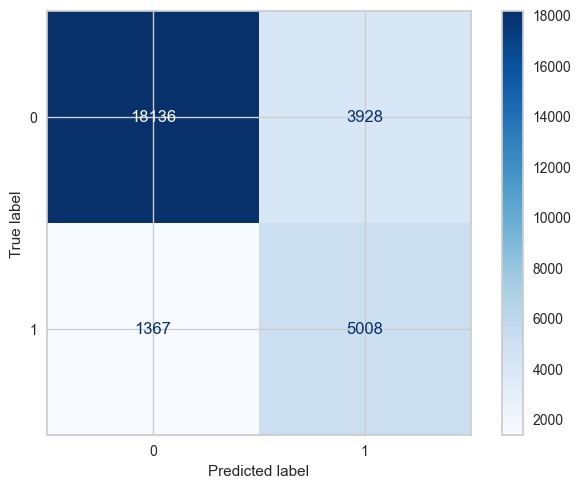

889/889 [==============================] - 1s 622us/step
Métrica custom (2*recall + precision)/3: 0.7105


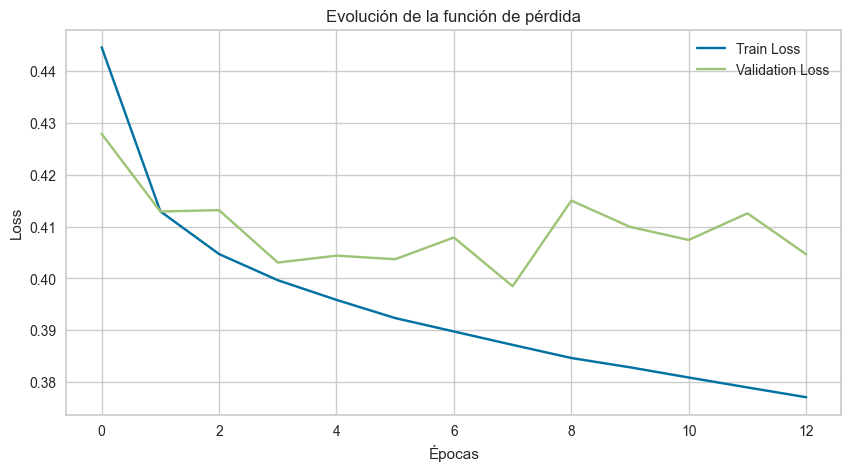

In [ ]:

num_layers = best_params['num_layers']
units      = [best_params[f'units_{i}']      for i in range(num_layers)]
dropouts   = [best_params[f'dropout_{i}']    for i in range(num_layers)]
activs     = [best_params[f'activation_{i}'] for i in range(num_layers)]

# Instanciar y construir el modelo final
nn_best = NeuralNetwork(
    epochs=13,
    batch_size=best_params['batch_size'],
    learning_rate=best_params['learning_rate'],
    num_layers=num_layers,
    units=units,
    dropout_rates=dropouts,
    activations=activs
)
nn_best.build_model(input_shape=X_train_bal.shape[1])

# Entrenar el modelo
history = nn_best.train(X_train_bal, y_train_bal, X_valid, y_valid)

# Evaluar en el set de test y calcular la métrica custom
nn_best.evaluate(X_test, y_test)
y_pred_test_red = nn_best.predict(X_test)
custom = custom_metric(y_test, y_pred_test_red)
print(f"Métrica custom (2*recall + precision)/3: {custom:.4f}")

# Graficar la evolución de la función de pérdida
nn_best.plot_training(history)


Podemos observar que el modelo alcanza una métrica custom de 0.71. Además, el error en el conjunto de entrenamiento es levemente inferior al de validación, lo que indica que el modelo no presenta sobreajuste significativo y generaliza correctamente a nuevos datos.

## Explicabilidad

PermutationExplainer explainer: 28440it [18:42, 25.10it/s]                           


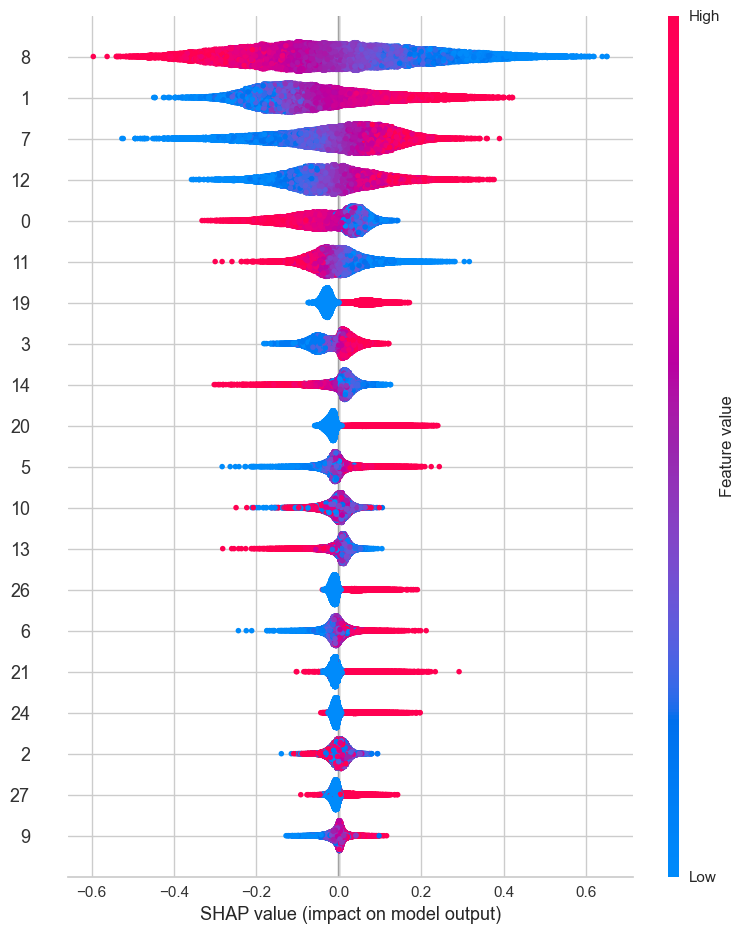

In [ ]:
# Convertimos a array
X_test_np = X_test.to_numpy()
background_np = X_train_bal.sample(100, random_state=42).to_numpy()

# Creamos el explainer
explainer = shap.Explainer(nn_best.model, background_np)

# Obtenemos los valores shap para el test
shap_values = explainer(X_test_np)

# Graficamos
shap.summary_plot(shap_values, X_test_np, feature_names=X_test.columns)

In [ ]:
print(shap_values.values.shape)

(28439, 28)


Procedemos a imprimir el base value (valor base), es decir la predicción promedio del modelo antes de ver ninguna información de una observación en particular

In [ ]:
# Acceder al valor base esperado de predicción
base = shap_values.base_values[0]
print("Base value (predicción promedio del modelo):", base)

Base value (predicción promedio del modelo): [0.51059118]


### Interpretabilidad local

Comparamos los graficos de fuerzas para las muestras de indice 0,1 y 2.

In [ ]:
shap_values[0]
shap_values[1]
shap_values[2]

.values =
array([-2.10971250e-03, -1.52381186e-02, -1.84391538e-02, -1.39141136e-02,
        2.36071931e-02,  7.83354723e-03, -8.02661536e-03, -1.66407610e-01,
        4.93396952e-01, -1.93731635e-02, -8.65525512e-03, -1.96720756e-02,
       -1.66461433e-02,  2.36758150e-02,  1.47240421e-02,  1.17139112e-03,
       -1.73526088e-03,  1.74684688e-03,  8.69457596e-03, -1.27266559e-02,
        1.32133819e-01, -8.65069262e-03, -8.75131013e-04, -4.35751511e-04,
       -1.13765115e-02, -8.20342313e-04, -1.19155723e-02,  1.80583841e-03])

.base_values =
array([0.51059118])

.data =
array([ 0.18218583,  0.26581951,  0.98888245, -0.40653031,  0.88060277,
        0.68157539,  0.35642057, -1.51912651, -1.67174434, -0.68608071,
        0.75335276,  0.20802832, -0.05543237, -0.10352946,  0.17294125,
        1.        ,  0.        ,  0.        ,  1.        ,  0.        ,
        1.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ])

In [ ]:
print(type(shap_values))
if isinstance(shap_values, list):
    print("shap_values es una lista")
    print("Shape[0]:", shap_values[0].shape)
else:
    print("Shape:", shap_values.shape)
print("X_test shape:", X_test.shape)

<class 'shap._explanation.Explanation'>
Shape: (28439, 28)
X_test shape: (28439, 28)


In [ ]:
shap.initjs()
# Gráfico de fuerza para índices 0, 1 y 2
for index in [0, 1, 2]:
    print(f"\nSHAP Force Plot para observación {index}")
    display(shap.force_plot(
        shap_values.base_values[index],
        shap_values.values[index],
        X_test.iloc[index],
      feature_names=preprocesador.get_feature_names_out()
  ))


SHAP Force Plot para observación 0



SHAP Force Plot para observación 1



SHAP Force Plot para observación 2


En los ***gráficos de fuerza*** de las muestras tomadas podemos observar el valor base a la izquierda y el valor final de la predicción a la derecha después de aplicarle todas las contribuciones SHAP. Observamos como cada flecha representa una variable y cómo contribuye a la predicción.
Las variables que empujan hacia la derecha (rojo) aumentan la predicción (probabilidad de lluvia). Las vaiables que empujan hacia la izquierda reducen dicha predicción.
De la observación de los tamaños de las flechas mostradas podemos determinar cuan imprtante fué esa variable en la observación.
De allí:
- Observación 0: Gran contribución positva de las horas de sol y negativa de la humedad a las 3pm.
- Observación 1: Gran contribución positiva de la humedad a las 3pm y negativa de la presión a las 9am.
- Observación 2: Gran contribución positiva de la presión a las 3pm y negativa de la presión a las 9am.

Realizamos gráfico de cascada y barras para las muestras de indice 0,1 y 2.

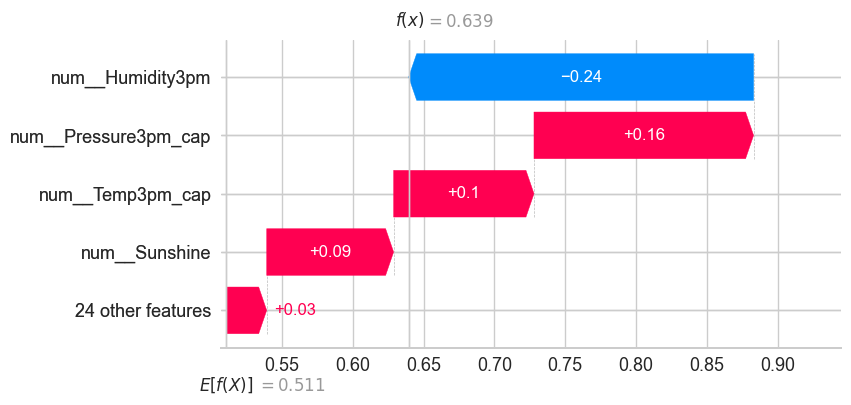

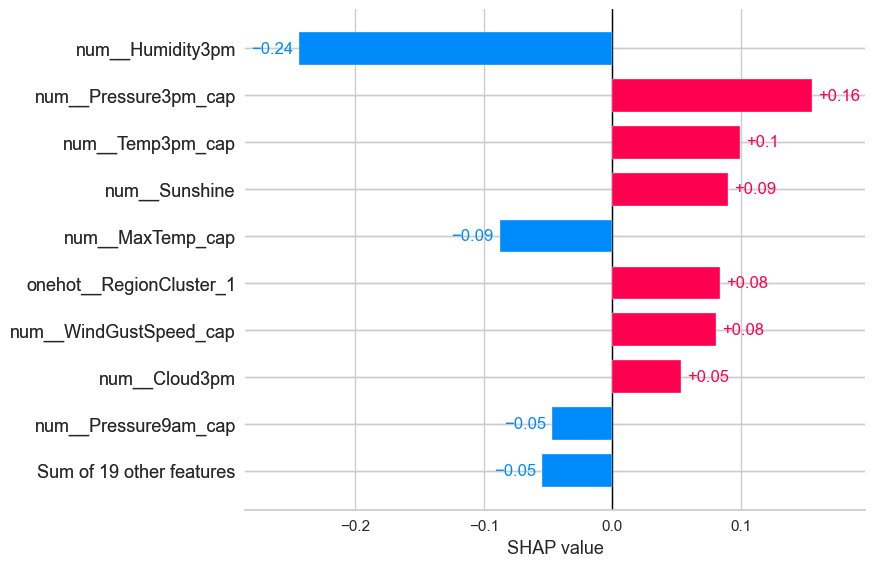

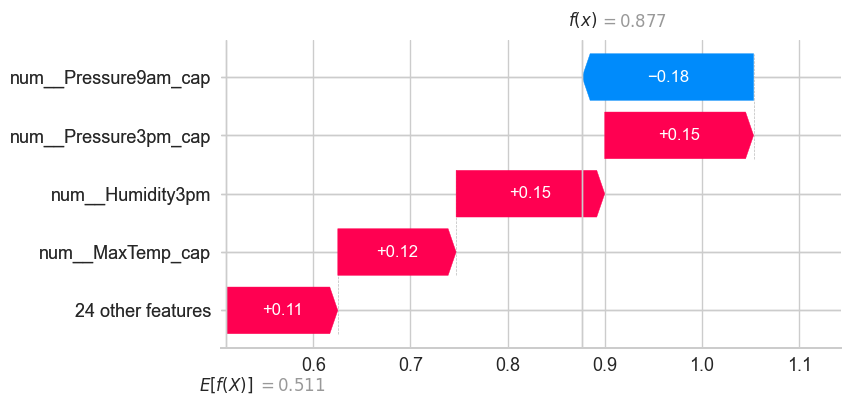

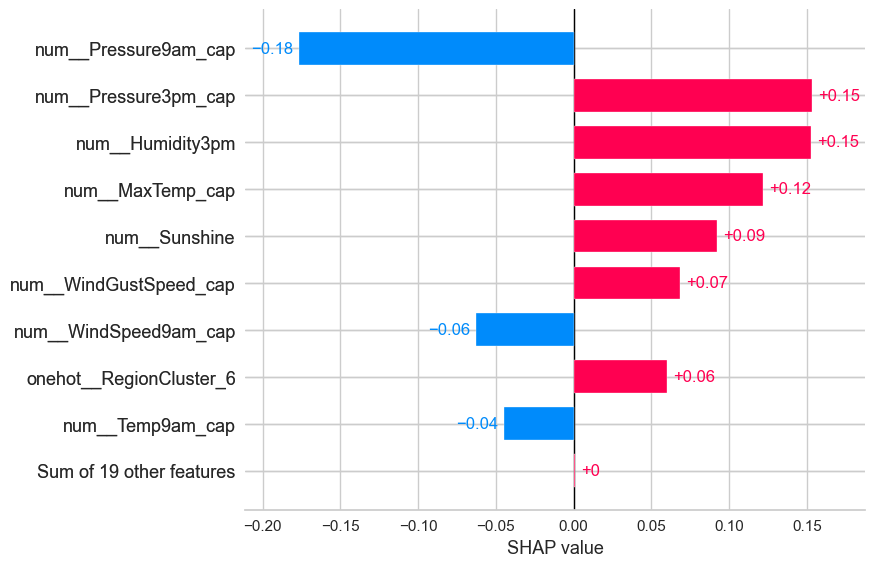

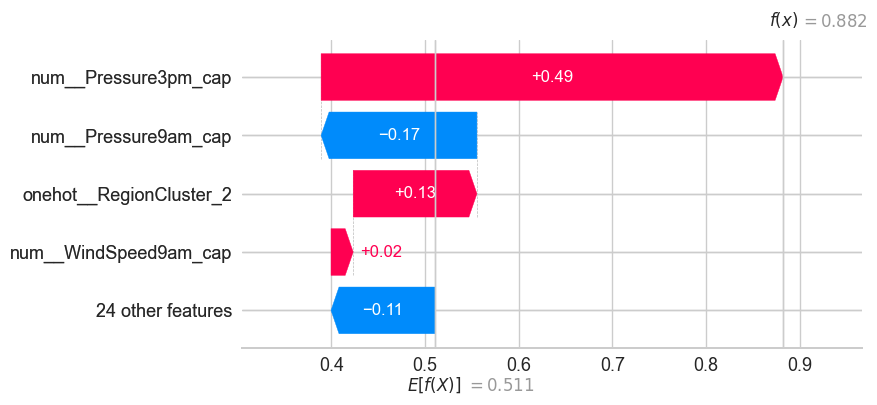

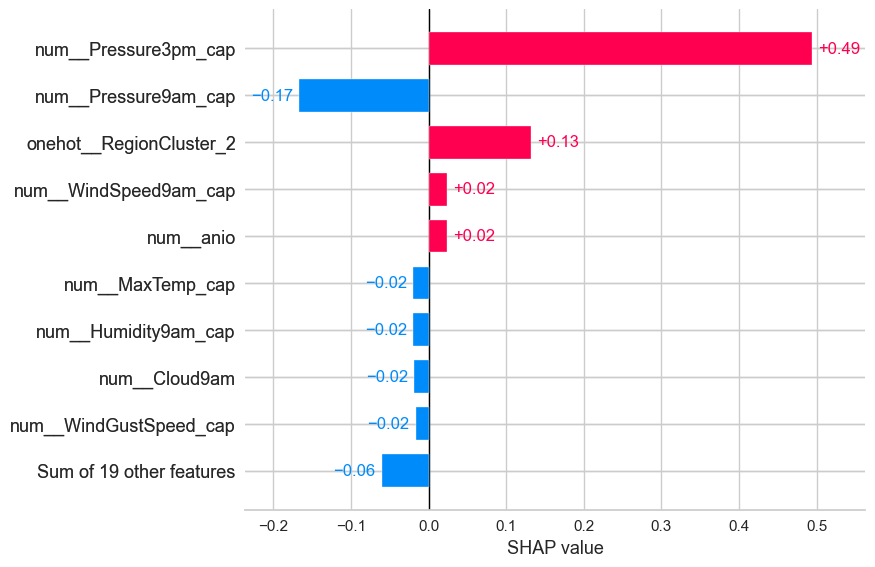

In [ ]:
for index in [0, 1, 2]:
    explanation = shap.Explanation(
        values=shap_values.values[index],
        base_values=shap_values.base_values[index],
        feature_names=preprocesador.get_feature_names_out()
    )

    shap.plots.waterfall(explanation, max_display=5)
    shap.plots.bar(explanation)

En los gráficos de cascada y barras presentados podemos complementar la información extraída de los gráficos de fuerza. En el gráfico de cascada partimos del base value que determinamos y desde allí podemos ver, cómo cada feature contribuye a la predicción final que estamos analizando. Vemos con barras azules la contribución de variables que disminuyen la predicción y con barras rojas (y su valor) las variables que aumentan la predicción, para llegar así al valor predicho. Por su parte, el gráfico de barras complementa la explicación mostrando en forma ordenada la magnitud absoluta por la que influyeron cada una de las variables analizadas previamente.

### Interpretabilidad global

Analizamos la explicabilidad de manera global.

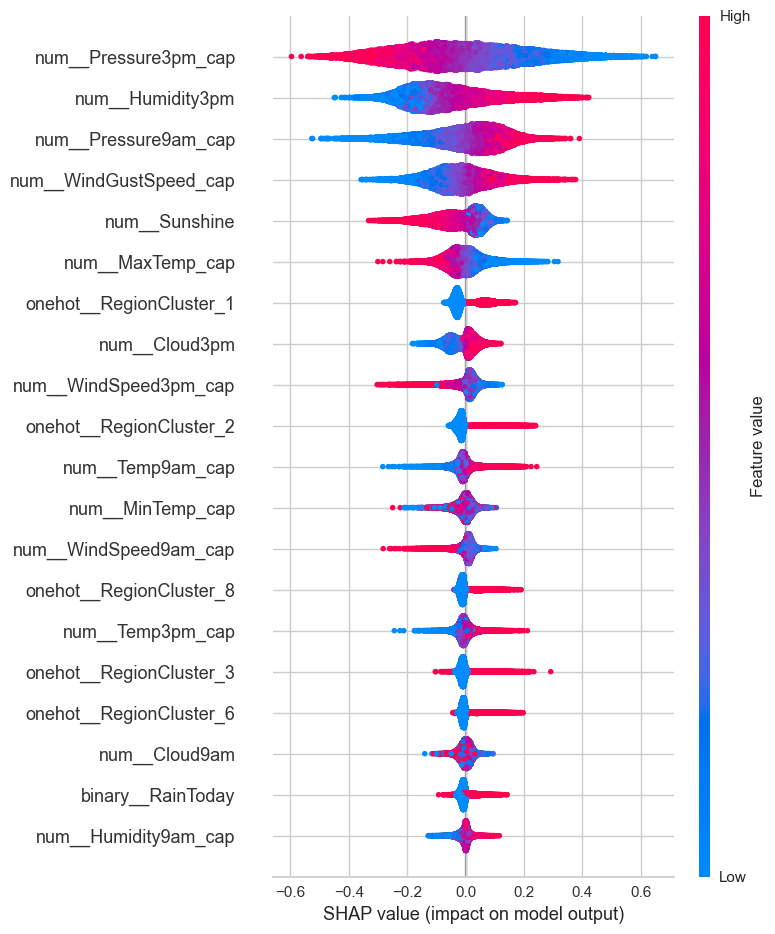

In [ ]:
# Grafico resumen de importancia de variables
shap.summary_plot(shap_values.values, X_test, feature_names=preprocesador.get_feature_names_out())


A partir del gráfico visualizamos el impacto individual de cada feature en las predicciones del modelo.
- Presión 3pm: Feature más influyente. Valores altos de presión (rojo) tienden a mover la predicción hacia NO va a llover (valores SHAP negativos). Valores bajos de presión (azul) tienden a aumentar la probabilidad de lluvia.
- Humedad 3pm: Valores altos contribuyen a predecir lluvia (valores SHAP positivos).
- Presión 9 am:  Valores altos contribuyen a predecir lluvia (valores SHAP positivos).
- Velocidad del viento: Ráfagas más fuertes están asociadas con mayor probabilidad de lluvia.



In [ ]:
expected_value = shap_values.values.mean()

explanation = shap.Explanation(
    values=shap_values.values,
    base_values=shap_values.base_values,
    feature_names=preprocesador.get_feature_names_out(),
    data=X_test
)

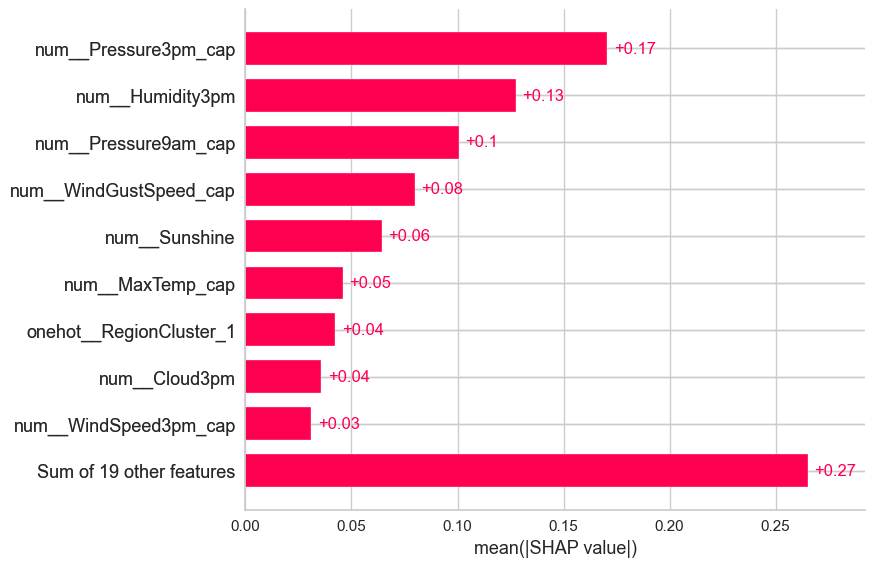

In [ ]:
shap.plots.bar(explanation)

A partir de este gráfico podemos determinar cuáles son las variables más importantes para el modelo y su orden de importancia. De este modo, las 5 variables más importantes en promedio son:


*   Presión a las 3pm
*   Humedad a las 3pm
*   Presión a las 9am
*   Velocidad del viento
*   Horas de sol

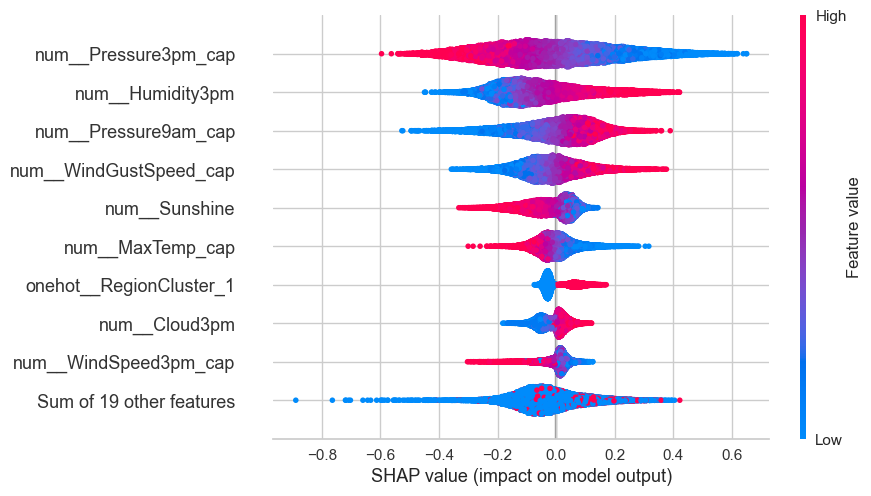

In [ ]:
shap.plots.beeswarm(explanation)

Observamos que las variables meteorológicas numéricas (presión, humedad, sol, viento) son las más importantes.
El modelo aprendió patrones lógicos desde el punto de vista meteorológico:
***humedad alta + presión baja (3pm) + menos sol + ráfagas fuertes = más probabilidad de lluvia.***

# Comparacion de modelos

Procedemos a comparar las métricas de el modelo con optimización de hiperparámetros con regularización y ajuste de umbral, el modelo de AutoML, el generado por Redes Neuronales y el modelo base.

<Figure size 400x400 with 0 Axes>

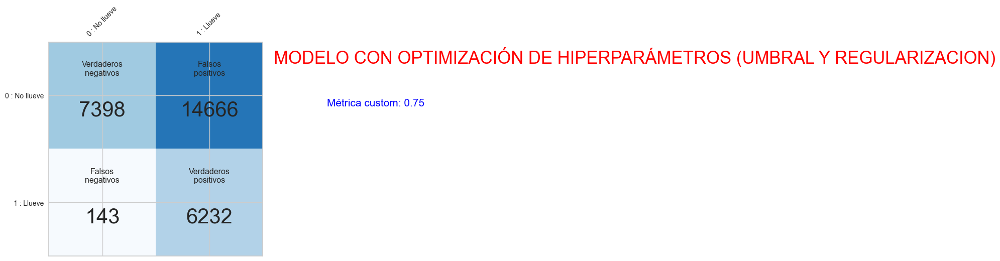

              precision    recall  f1-score   support

           0       0.98      0.34      0.50     22064
           1       0.30      0.98      0.46      6375

    accuracy                           0.48     28439
   macro avg       0.64      0.66      0.48     28439
weighted avg       0.83      0.48      0.49     28439



In [ ]:
matriz_de_confusion(y_test, y_pred_test_op, "MODELO CON OPTIMIZACIÓN DE HIPERPARÁMETROS (UMBRAL Y REGULARIZACION)")
print(classification_report(y_test, y_pred_test_op))

<Figure size 400x400 with 0 Axes>

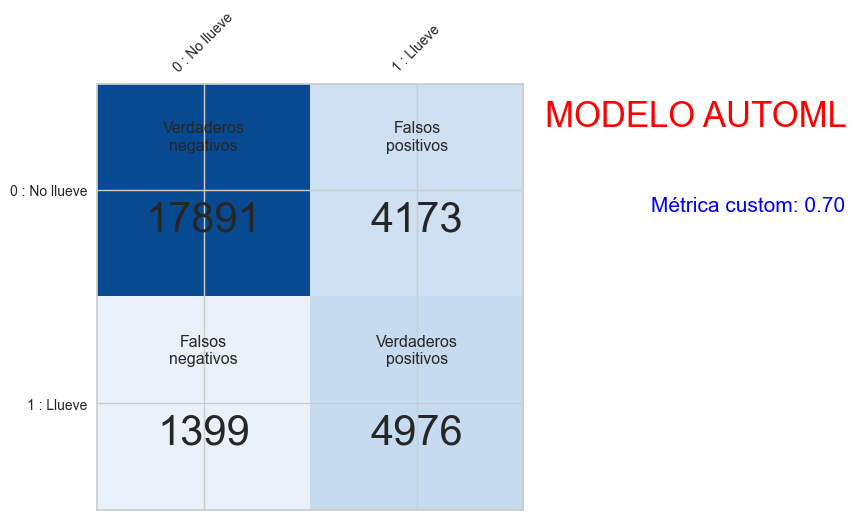

              precision    recall  f1-score   support

           0       0.93      0.81      0.87     22064
           1       0.54      0.78      0.64      6375

    accuracy                           0.80     28439
   macro avg       0.74      0.80      0.75     28439
weighted avg       0.84      0.80      0.82     28439



In [ ]:
matriz_de_confusion(y_true_aml, y_pred_aml, "MODELO AUTOML")
print(classification_report(y_true_aml, y_pred_aml))

<Figure size 400x400 with 0 Axes>

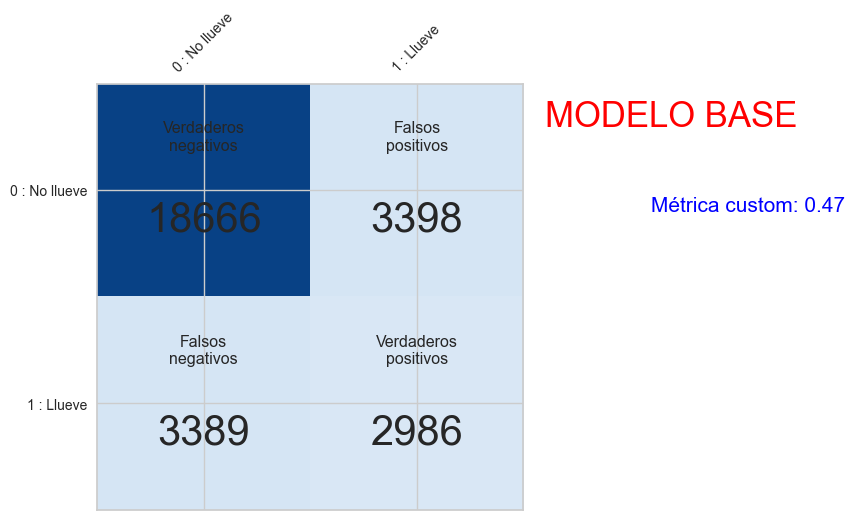

              precision    recall  f1-score   support

           0       0.85      0.85      0.85     22064
           1       0.47      0.47      0.47      6375

    accuracy                           0.76     28439
   macro avg       0.66      0.66      0.66     28439
weighted avg       0.76      0.76      0.76     28439



In [ ]:
matriz_de_confusion(y_test, y_predbase, "MODELO BASE")
print(classification_report(y_test, y_predbase))

<Figure size 400x400 with 0 Axes>

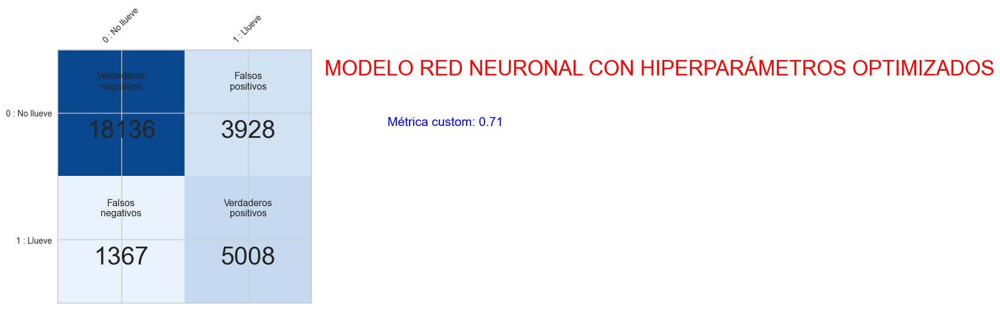

              precision    recall  f1-score   support

           0       0.93      0.82      0.87     22064
           1       0.56      0.79      0.65      6375

    accuracy                           0.81     28439
   macro avg       0.75      0.80      0.76     28439
weighted avg       0.85      0.81      0.82     28439



In [ ]:
matriz_de_confusion(y_test, y_pred_test_red, "MODELO RED NEURONAL CON HIPERPARÁMETROS OPTIMIZADOS")
print(classification_report(y_test, y_pred_test_red))

De la comparación de modelos podemos concluir que los distintos enfoques implementados mejoran significativamente las métricas respecto al modelo base. Entre todos los modelos, el que combina regularización, ajuste de umbral y optimización de hiperparámetros es el que más se acerca al rendimiento deseado. Este modelo logra aumentar considerablemente el recall de la clase 1 (recall = 0.92) —es decir, detecta correctamente el 92% de los casos en los que realmente llueve—, aunque esto se logra a costa de reducir el recall de la clase 0 (recall = 0.60) y la precisión de la clase 1 (precision = 0.40). En otras palabras, solo en el 40% de las veces que el modelo predice lluvia, efectivamente llueve.

Este balance se refleja en el valor obtenido por la métrica custom (custom = 0.75), priorizando el recall de la clase minoritaria. Por su parte, tanto el modelo de AutoML como el de redes neuronales con ajuste de hiperparámetros obtienen resultados muy similares (custom = 0.71), aunque siguen siendo inferiores al modelo optimizado en umbral y regularización.

En resumen, la optimización específica del umbral y el parámetro de regularización permite construir un modelo mejor alineado con el objetivo del problema: maximizar la detección de lluvias, aun sacrificando cierta precisión. Dependiendo del caso de uso, se podría modificar la métrica a priorizar, pudiendo ser otro de los modelos el que mejor se adapte a la búsqueda.

# Puesta en producción (MLOps)

Procedemos a efectuar la carga de datos

In [ ]:
# Carga dataset
df = pd.read_csv('./files/input.csv')

# Carga coordenadas de Australia para geocluster
coord_aus = pd.read_csv('https://raw.githubusercontent.com/guillericci/AA1-TUIA-Aranda-Cicoria-Ricci/refs/heads/main/coordenadas_aus.csv')

Eliminamos nulos de la variable target

In [ ]:
df = df.dropna(subset=['RainTomorrow'])

Definimos las columnas a utilizar

In [ ]:
# Columnas categóricas
cat_cols = df.select_dtypes(include=['object']).columns.difference(['RainTomorrow']).tolist()

# Columnas categóricas para codificación
onehot_cols = ['Rainfall_cat', 'Evaporation_cat', 'RegionCluster']
binary_cols = ['RainToday']

# Columnas numéricas para escalar
num_cols = [
    'Sunshine', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'anio',
    'Temp9am_cap', 'Temp3pm_cap', 'Pressure9am_cap', 'Pressure3pm_cap',
    'Humidity9am_cap', 'MinTemp_cap', 'MaxTemp_cap',
    'WindGustSpeed_cap', 'WindSpeed9am_cap', 'WindSpeed3pm_cap'
]

Definimos el preprocesador

In [ ]:
preprocesador = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_cols),
    ('onehot', OneHotEncoder(drop='first', handle_unknown='ignore'), onehot_cols),
    ('binary', OrdinalEncoder(), binary_cols)
])

Definimos el modelo final (mejores hiperparámetros)

In [ ]:
modelo_final = LogisticRegression(
    penalty='l2',
    C=0.07439822123443487,
    solver='liblinear',
    random_state=42
)

Construimos el Pipeline completo

In [ ]:
pipeline_produccion = Pipeline([
    ('geo', TemporalGeoTransformer(coord_df=coord_aus, n_clusters=9)),
    ('imputacion', HierarchicalImputer(
        columnas_num_excluir=['Cloud9am', 'Cloud3pm'],
        columnas_cat=cat_cols + ['Cloud9am', 'Cloud3pm']
    )),
    ('outliers', OutlierCapper()),
    ('cyclic_clean', CyclicEncoderCleaner()),
    ('preprocesamiento', preprocesador),
    ('modelo', modelo_final)
])

Dividimos el dataset en train y test para la evaluación posterior

In [ ]:
# Separación features y target
y = df['RainTomorrow'].map({'No': 0, 'Yes': 1})
X = df.drop(columns=['RainTomorrow'])

# División train-test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

Entrenamos el Pipeline y lo guardamos

In [ ]:
pipeline_produccion.fit(X_train, y_train)


joblib.dump(pipeline_produccion, './docker/pipeline.pkl')
print("✅ Pipeline entrenado y guardado correctamente en './docker/pipeline.pkl'")

✅ Pipeline entrenado y guardado correctamente en './docker/pipeline.pkl'


In [ ]:
pipeline = joblib.load('./docker/pipeline.pkl')
pipeline

Pipeline(memory=None,
         steps=[('geo',
                 TemporalGeoTransformer(coord_df=            Location   Latitude   Longitude
0             Albury -36.074816  146.923828
1      BadgerysCreek -33.884444  150.783056
2              Cobar -31.496667  145.834167
3       CoffsHarbour -30.296263  153.113533
4              Moree -29.462778  149.841667
5          Newcastle -32.926670  151.778900
6          NorahHead -33.281389  151.568611
7      NorfolkIsland -29.032222  167.958611
8            Penrith -33.751389...
                                                                 unknown_value=None),
                                                  ['RainToday'])],
                                   verbose=False,
                                   verbose_feature_names_out=True)),
                ('modelo',
                 LogisticRegression(C=0.07439822123443487, class_weight=None,
                                    dual=False, fit_intercept=True,
                                    intercept_scaling=1, l1_ratio=None,
                                    max_iter=100, multi_class='auto',
                                    n_jobs=None, penalty='l2', random_state=42,
                                    solver='liblinear', tol=0.0001, verbose=0,
                                    warm_start=False))],
         verbose=False)

# Docker

Los siguientes comandos para la construccion de la imagen y la ejecucion del container deben ser realizados por consola


Con comando ```cd``` nos situamos sobre la carpeta de docker descargada. Por ejemplo:

```
>>> D:\Downloads\> cd docker
>>> D:\Downloads\docker>

```

Luego construimos la imagen de docker.


```
>>> D:\Downloads\docker> docker build -t inference-python-test .
```

docker build -t inference-python-test .

```

Para la ejecucion, debemos indicarle el path correspondiente en donde se encuentra. Por ejemplo:
Si el path es `D:/Downloads`, debo ejecutar:

`docker run --rm -v "{path}/files:/files" inference-python-test`

```
>>> D:\Downloads\docker> docker run --rm -v "D:/Downloads/files:/files" inference-python-test

```

docker run --rm -v "{path}/files:/files" inference-python-test

## Output

Se creará en la carpeta `files`un archivo `output.csv` con las predicciones

In [ ]:
df_output = pd.read_csv('./files/output.csv')
df_output.sample(5)

,RainTomorrow_pred
47520,0
138370,0
20747,1
94830,0
74363,0


# Ejemplo de prediccion

In [ ]:
# Tomar una fila de X_test para hacer predicción
indice = 0
nueva_fila = X_test.iloc[[indice]]  # Usamos doble corchete para mantener el formato DataFrame

# Predecir la probabilidad de clase 1 (lluvia)
proba = pipeline.predict_proba(nueva_fila)[:, 1]

# Aplicar umbral custom
umbral = 0.1
prediccion = (proba >= umbral).astype(int)

# Mostrar resultados
print(f"Predicción para fila {indice} del conjunto de prueba : {'Lloverá' if prediccion[0] == 1 else 'No lloverá'}")


Predicción para fila 0 del conjunto de prueba : Lloverá


Evaluamos el rendimiento del modelo para los datos de prueba. Este paso es para verificar que el pipeline este funcionando como esperamos.


 Reporte de clasificación (umbral 0.1):
              precision    recall  f1-score   support

           0       0.96      0.60      0.74     22064
           1       0.40      0.92      0.56      6375

    accuracy                           0.67     28439
   macro avg       0.68      0.76      0.65     28439
weighted avg       0.84      0.67      0.70     28439

 Métrica personalizada (custom): 0.746
 Recall clase 1: 0.919
 Precisión clase 1: 0.400
 Matriz de confusión (umbral ajustado):


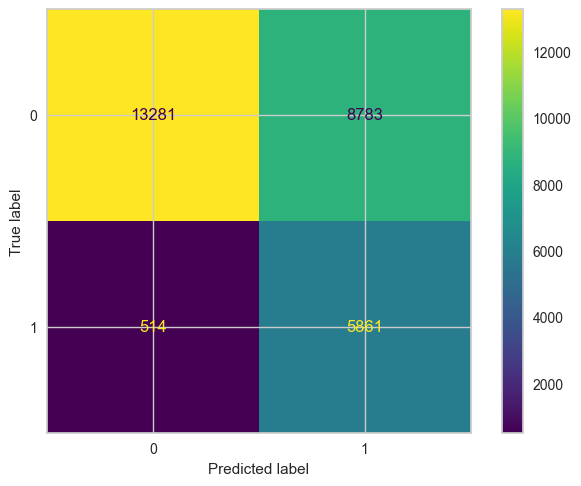

In [ ]:
# Predecir clases
y_pred = pipeline.predict(X_test)

# Predecir probabilidades
y_proba = pipeline.predict_proba(X_test)[:, 1]

# Predicción con umbral custom
y_pred_custom = (y_proba >= umbral).astype(int)

# Reporte de clasificación
print(f"\n Reporte de clasificación (umbral {umbral}):")
print(classification_report(y_test, y_pred_custom))

# Métrica personalizada
precision_1 = precision_score(y_test, y_pred_custom, pos_label=1)
recall_1 = recall_score(y_test, y_pred_custom, pos_label=1)
custom_metric = (2 * recall_1 + precision_1) / 3

print(f" Métrica personalizada (custom): {custom_metric:.3f}")
print(f" Recall clase 1: {recall_1:.3f}")
print(f" Precisión clase 1: {precision_1:.3f}")

# Matriz de confusión
print(" Matriz de confusión (umbral ajustado):")
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_custom)
plt.show()